
# Publication-style overlap and annotation plots for proteomics, REDOX, and phospho

This notebook builds publication-ready overlap figures for:
- **Proteomics**
- **REDOX**
- **Phosphorylation**

It supports:
- **Venn diagrams** for overlap counts
- **Enrichment dot plots**
- **Raw-term bubble charts**
- **Enrichment heat maps**
- **Horizontal bar plots of enriched terms**
- **Looping over one or many annotation columns**
- **Protein-level collapsing** for site-level REDOX/phospho data
- **analyzing pathways of selected targets**

In [1]:

import os
import ast
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
from scipy.stats import fisher_exact
from statsmodels.stats.multitest import multipletests

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import textwrap

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["ps.fonttype"] = 42


/Users/czaj603/miniconda3/envs/lipGSM/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


Number of unique targets: 24


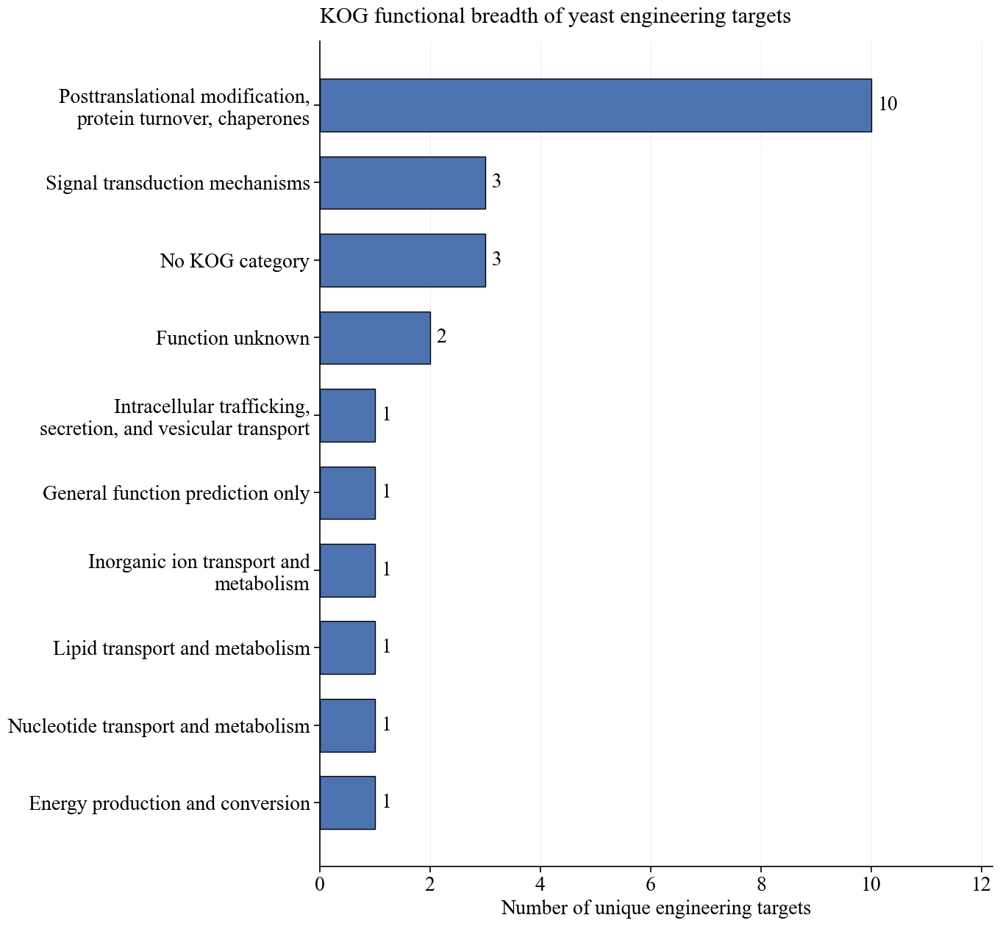

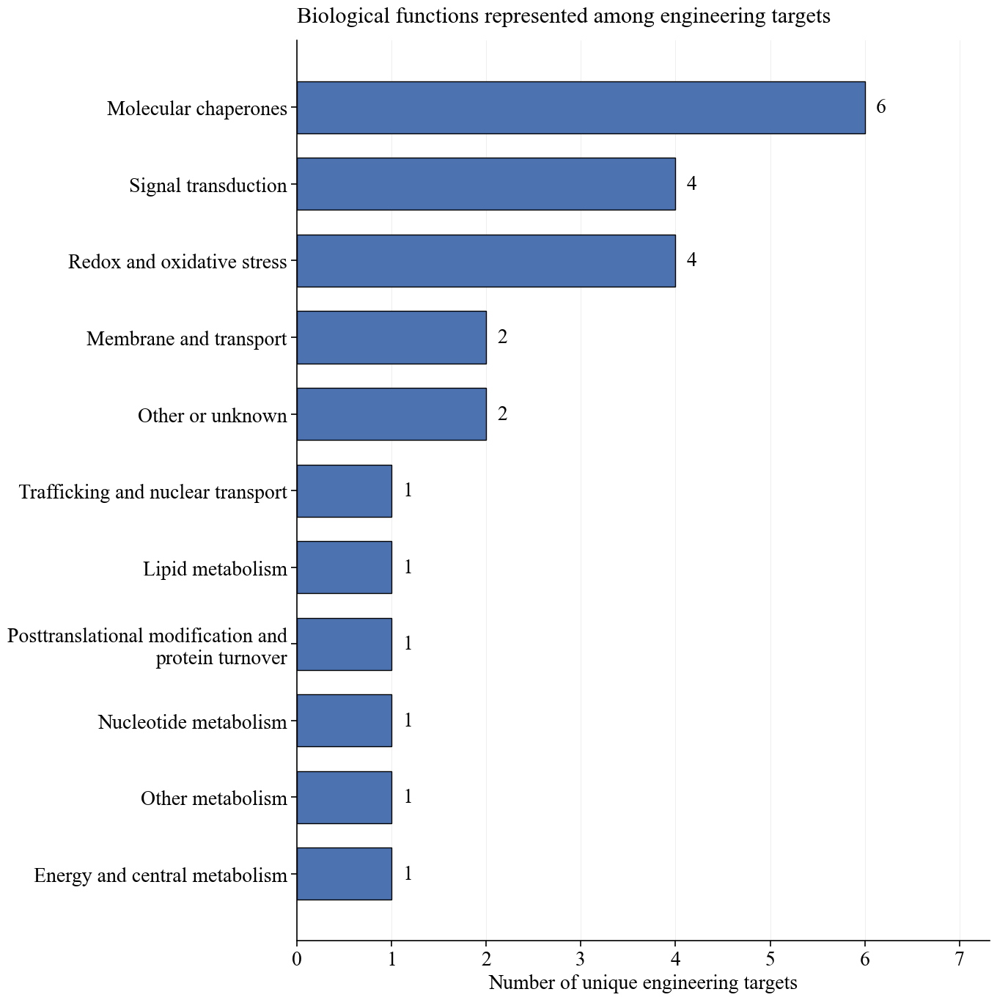

In [2]:
# ============================================================
# Publication settings
# ============================================================

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "font.size": 20,
    "font.weight": "normal",
    "axes.titlesize": 22,
    "axes.titleweight": "normal",
    "axes.labelsize": 20,
    "axes.labelweight": "normal",
    "xtick.labelsize": 20,
    "ytick.labelsize": 20,
    "legend.fontsize": 20,
    "axes.linewidth": 1.2,
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
    "xtick.major.size": 6,
    "ytick.major.size": 6,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "savefig.dpi": 600,
    "savefig.bbox": "tight"
})

publication_blue = "#4C72B0"


# ============================================================
# Unique engineering targets and annotations
# ============================================================

annotation_data = [
    {
        "Protein ID": 1448,
        "YALI0_locus": "YALI0B10736g",
        "Protein annotation":
            "Mitochondrial tricarboxylate/dicarboxylate carrier",
        "KOG category":
            "Energy production and conversion",
        "Functional theme":
            "Energy and central metabolism"
    },
    {
        "Protein ID": 2212,
        "YALI0_locus": "YALI0C03443g",
        "Protein annotation":
            "Small heat-shock protein Hsp26/Hsp42",
        "KOG category":
            "Posttranslational modification, protein turnover, chaperones",
        "Functional theme":
            "Molecular chaperones"
    },
    {
        "Protein ID": 2941,
        "YALI0_locus": "YALI0C17347g",
        "Protein annotation":
            "HSP70-family molecular chaperone",
        "KOG category":
            "Posttranslational modification, protein turnover, chaperones",
        "Functional theme":
            "Molecular chaperones"
    },
    {
        "Protein ID": 1206,
        "YALI0_locus": "YALI0B05610g",
        "Protein annotation":
            "Mitochondrial chaperonin",
        "KOG category":
            "Posttranslational modification, protein turnover, chaperones",
        "Functional theme":
            "Molecular chaperones"
    },
    {
        "Protein ID": 4777,
        "YALI0_locus": "YALI0E02310g",
        "Protein annotation":
            "Glutathione peroxidase",
        "KOG category":
            "Posttranslational modification, protein turnover, chaperones",
        "Functional theme":
            "Redox and oxidative stress"
    },
    {
        "Protein ID": 4559,
        "YALI0_locus": "YALI0D25322g",
        "Protein annotation":
            "NIPSNAP1 protein",
        "KOG category":
            "Function unknown",
        "Functional theme":
            "Other or unknown"
    },
    {
        "Protein ID": 2159,
        "YALI0_locus": "YALI0C02321g",
        "Protein annotation":
            "S-adenosyl-L-methionine-dependent methyltransferase",
        "KOG category":
            "No KOG category",
        "Functional theme":
            "Other metabolism"
    },
    {
        "Protein ID": 2038,
        "YALI0_locus": "YALI0B23188g",
        "Protein annotation":
            "Phosphoribosylaminoimidazole carboxylase",
        "KOG category":
            "Nucleotide transport and metabolism",
        "Functional theme":
            "Nucleotide metabolism"
    },
    {
        "Protein ID": 4933,
        "YALI0_locus": "YALI0E05665g",
        "Protein annotation":
            "Aquaporin-like protein",
        "KOG category":
            "No KOG category",
        "Functional theme":
            "Membrane and transport"
    },
    {
        "Protein ID": 4631,
        "YALI0_locus": "YALI0D26884g",
        "Protein annotation":
            "COP9 signalosome complex subunit 6",
        "KOG category":
            "No KOG category",
        "Functional theme":
            "Posttranslational modification and protein turnover"
    },
    {
        "Protein ID": 2600,
        "YALI0_locus": "YALI0C10989g",
        "Protein annotation":
            "Diacylglycerol cholinephosphotransferase",
        "KOG category":
            "Lipid transport and metabolism",
        "Functional theme":
            "Lipid metabolism"
    },
    {
        "Protein ID": 6140,
        "YALI0_locus": "YALI0E31064g",
        "Protein annotation":
            "Na+/dicarboxylate, Na+/tricarboxylate and phosphate transporter",
        "KOG category":
            "Inorganic ion transport and metabolism",
        "Functional theme":
            "Membrane and transport"
    },
    {
        "Protein ID": 6770,
        "YALI0_locus": "YALI0F08165g",
        "Protein annotation":
            "MEKK-related serine/threonine protein kinase",
        "KOG category":
            "Signal transduction mechanisms",
        "Functional theme":
            "Signal transduction"
    },
    {
        "Protein ID": 5931,
        "YALI0_locus": "YALI0E26609g",
        "Protein annotation":
            "Casein kinase",
        "KOG category":
            "Signal transduction mechanisms",
        "Functional theme":
            "Signal transduction"
    },
    {
        "Protein ID": 5015,
        "YALI0_locus": "YALI0E07601g",
        "Protein annotation":
            "Rac GTPase-activating protein BCR/ABR",
        "KOG category":
            "Signal transduction mechanisms",
        "Functional theme":
            "Signal transduction"
    },
    {
        "Protein ID": 1449,
        "YALI0_locus": "YALI0B10758g",
        "Protein annotation":
            "PCTAIRE-related protein kinase",
        "KOG category":
            "General function prediction only",
        "Functional theme":
            "Signal transduction"
    },
    {
        "Protein ID": 6434,
        "YALI0_locus": "YALI0F01793g",
        "Protein annotation":
            "Karyopherin-beta2/Transportin",
        "KOG category":
            "Intracellular trafficking, secretion, and vesicular transport",
        "Functional theme":
            "Trafficking and nuclear transport"
    },
    {
        "Protein ID": 6965,
        "YALI0_locus": "YALI0F12111g",
        "Protein annotation":
            "DnaJ-family molecular chaperone",
        "KOG category":
            "Posttranslational modification, protein turnover, chaperones",
        "Functional theme":
            "Molecular chaperones"
    },
    {
        "Protein ID": 3692,
        "YALI0_locus": "YALI0D08140g",
        "Protein annotation":
            "Defense-related SCP-domain protein",
        "KOG category":
            "Function unknown",
        "Functional theme":
            "Other or unknown"
    },
    {
        "Protein ID": 2484,
        "YALI0_locus": "YALI0C08987g",
        "Protein annotation":
            "Molecular co-chaperone STI1",
        "KOG category":
            "Posttranslational modification, protein turnover, chaperones",
        "Functional theme":
            "Molecular chaperones"
    },
    {
        "Protein ID": 7749,
        "YALI0_locus": "YALI0F28127g",
        "Protein annotation":
            "Glutaredoxin",
        "KOG category":
            "Posttranslational modification, protein turnover, chaperones",
        "Functional theme":
            "Redox and oxidative stress"
    },
    {
        "Protein ID": 6419,
        "YALI0_locus": "YALI0F01496g",
        "Protein annotation":
            "Thioredoxin",
        "KOG category":
            "Posttranslational modification, protein turnover, chaperones",
        "Functional theme":
            "Redox and oxidative stress"
    },
    {
        "Protein ID": 7001,
        "YALI0_locus": "YALI0F12463g",
        "Protein annotation":
            "HSP104-related ATP-dependent chaperone",
        "KOG category":
            "Posttranslational modification, protein turnover, chaperones",
        "Functional theme":
            "Molecular chaperones"
    },
    {
        "Protein ID": 4783,
        "YALI0_locus": "YALI0E02420g",
        "Protein annotation":
            "Thioredoxin/protein disulfide isomerase",
        "KOG category":
            "Posttranslational modification, protein turnover, chaperones",
        "Functional theme":
            "Redox and oxidative stress"
    }
]

annotations = pd.DataFrame(annotation_data)

print(
    "Number of unique targets:",
    annotations["YALI0_locus"].nunique()
)


# ============================================================
# Plotting function
# ============================================================

def plot_annotation_counts(
    counts,
    title,
    output_name,
    wrap_width=35,
    figure_width=14,
    row_height=1.0
):
    counts = counts.sort_values(ascending=True)

    wrapped_labels = [
        "\n".join(
            textwrap.wrap(
                str(label),
                width=wrap_width
            )
        )
        for label in counts.index
    ]

    figure_height = max(
        7,
        len(counts) * row_height + 2.5
    )

    fig, ax = plt.subplots(
        figsize=(figure_width, figure_height)
    )

    bars = ax.barh(
        wrapped_labels,
        counts.values,
        height=0.68,
        color=publication_blue,
        edgecolor="black",
        linewidth=1.0
    )

    ax.set_xlabel(
        "Number of unique engineering targets",
        fontsize=20,
        fontweight="normal"
    )

    ax.set_ylabel("")

    ax.set_title(
        title,
        loc="left",
        pad=18,
        fontsize=22,
        fontweight="normal"
    )

    ax.xaxis.set_major_locator(
        MaxNLocator(integer=True)
    )

    x_padding = max(
        1.2,
        counts.max() * 0.22
    )

    ax.set_xlim(
        0,
        counts.max() + x_padding
    )

    for bar, value in zip(
        bars,
        counts.values
    ):
        ax.text(
            bar.get_width() + 0.12,
            bar.get_y() + bar.get_height() / 2,
            f"{int(value)}",
            va="center",
            ha="left",
            fontsize=20,
            fontweight="normal"
        )

    ax.tick_params(
        axis="both",
        which="major",
        direction="out",
        labelsize=20
    )

    for label in (
        ax.get_xticklabels()
        + ax.get_yticklabels()
    ):
        label.set_fontweight("normal")

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(1.2)
    ax.spines["bottom"].set_linewidth(1.2)

    ax.grid(
        axis="x",
        linestyle="-",
        linewidth=0.6,
        alpha=0.25
    )

    ax.set_axisbelow(True)

    plt.tight_layout()

    fig.savefig(
        f"{output_name}.pdf"
    )

    fig.savefig(
        f"{output_name}.svg"
    )

    fig.savefig(
        f"{output_name}.png",
        dpi=600
    )

    plt.show()


# ============================================================
# Figure 1: original KOG categories
# ============================================================

kog_counts = (
    annotations["KOG category"]
    .value_counts()
)

plot_annotation_counts(
    counts=kog_counts,
    title="KOG functional breadth of yeast engineering targets",
    output_name="Figure_KOG_annotation_breadth",
    wrap_width=35,
    figure_width=14,
    row_height=1.05
)


# ============================================================
# Figure 2: curated functional themes
# ============================================================

theme_counts = (
    annotations["Functional theme"]
    .value_counts()
)

plot_annotation_counts(
    counts=theme_counts,
    title="Biological functions represented among engineering targets",
    output_name="Figure_functional_theme_breadth",
    wrap_width=34,
    figure_width=14,
    row_height=1.05
)


# ============================================================
# Export the underlying annotation table
# ============================================================

# annotations.to_csv(
#     "yeast_engineering_target_annotations.csv",
#     index=False
# )

## 1) File paths

In [8]:

# Update these if your files live elsewhere.
# Defaults match paths referenced in your existing notebooks.

# PROT_PATH = '../Data/ProcessedData/Proteomics/PPI_yarrowia_protein_abundance_wAnnotations_fullLog2FC.xlsx'
PROT_PATH = '../Data/ProcessedData/Proteomics/PPI_yarrowia_protein_abundance_wAnnotations_fullLog2FC_withOsc.csv'

REDOX_PATH = '../Data/ProcessedData/Proteomics/PPI_yarrowia_redox_wAnnotations_fullLog2FC_withOsc.csv'
PHOSPHO_PATH = '../Data/ProcessedData/Proteomics/PPI_yarrowia_phospho_wAnnotations_fullLog2FC_withOsc.csv'

OUTDIR = 'publication_overlap_plots_full_OscvsLow'
os.makedirs(OUTDIR, exist_ok=True)
OUTDIR


'publication_overlap_plots_full_OscvsLow'

## 2) Load datasets

In [9]:

# prot = pd.read_excel(PROT_PATH)
prot = pd.read_csv(PROT_PATH)

redox = pd.read_csv(REDOX_PATH)
phospho = pd.read_csv(PHOSPHO_PATH)

print('Proteomics:', prot.shape)
print('REDOX:', redox.shape)
print('Phospho:', phospho.shape)


Proteomics: (2759, 206)
REDOX: (5228, 190)
Phospho: (457, 207)


## 3) Configuration

In [48]:

# =========================
# GLOBAL SETTINGS
# =========================

# Significance thresholds
LOW_FC_COL   = "low/control_late_combined"
LOW_PADJ_COL = "low/control_late_combined_ANOVA_padj"
# OSC_FC_COL   = "osc/low_late_cominbed"
# OSC_PADJ_COL = "osc/low_late_cominbedANOVA_padj"

# # =========================
# # OSC_vsLow_FC
# # =========================
# OSC_FC_COL   = "osc/control_late_cominbed"
# OSC_PADJ_COL = "osc/control_late_cominbedANOVA_padj"

OSC_COMPARISON = "vs_control"  # or "vs_low"
if OSC_COMPARISON == "vs_control":
    OSC_FC_COL   = "osc/control_late_cominbed"
    OSC_PADJ_COL = "osc/control_late_cominbedANOVA_padj"
elif OSC_COMPARISON == "vs_low":
    OSC_FC_COL   = "osc/low_late_cominbed"
    OSC_PADJ_COL = "osc/low_late_cominbedANOVA_padj"
else:
    raise ValueError(f"Unknown OSC_COMPARISON: {OSC_COMPARISON!r}")

LOG2FC_THRESHOLD = np.log2(1.3)
PROTEIN_COL = "proteinId"

# Plot + enrichment settings
MIN_TERM_SIZE = 3
PADJ_CUTOFF = 0.05
TOP_N_TERMS = 10
MAX_TERM_LABEL = 55
FIG_DPI = 600
SAVE_FIGURES = True
SAVE_TABLES = True

# Plot styles to run
# Supported: venn, enrichment_dotplot, raw_bubble, enrichment_heatmap, enrichment_barh
PLOT_STYLES = [
    "venn",
    "enrichment_dotplot",
    "raw_bubble",
    "enrichment_heatmap",
    "enrichment_barh",
]

# Dataset selection
# Supported names: proteomics, redox, phospho
DATASETS_TO_RUN = ["proteomics", "redox", "phospho"]

# Annotation column mode
# "single" = use ANN_COL
# "all" = loop through all available annotation columns
ANNOTATION_MODE = "all"

# Use any available annotation column, for example:
# "kogGroup", "kogClass", "pathway_class", "pathway", "goName", "definition", ...
ANN_COL = "kogGroup"

# Preferred order when looping over all annotation columns
ANNOTATION_PRIORITY = [
    "kogGroup",
    "kogClass",
    "pathway_class",
    "pathway",
    "pathway_type",
    "goName",
    "gotermType",
    "goAcc",
    "kogdefline",
    "definition",
    "catalyticActivity",
]

# Optional: run only these columns when ANNOTATION_MODE == "all".
# Set to None to use all available annotation columns in priority order.
ANNOTATION_INCLUDE = None
ANNOTATION_INCLUDE = [
    # "kogGroup",
    "kogClass",
    "pathway_class",
    "pathway",
    "pathway_type",
    "goName",
    # "gotermType",
    # "goAcc",
    "kogdefline",
    "definition",
    # "catalyticActivity",
]
FS_LEGEND_T=20

## 4) Helpers

In [11]:

def parse_terms(x):
    if pd.isna(x):
        return []
    if isinstance(x, list):
        return [str(i).strip() for i in x if str(i).strip()]

    s = str(x).strip()
    if s == "" or s.lower() in {"nan", "none"}:
        return []

    try:
        val = ast.literal_eval(s)
        if isinstance(val, list):
            return [str(i).strip() for i in val if str(i).strip()]
        return [str(val).strip()]
    except Exception:
        pass

    for sep in [" // ", "//", " | ", "|", ";"]:
        s = s.replace(sep, ";;;")
    return [i.strip() for i in s.split(";;;") if i.strip()]


def shorten_term(x, max_len=55):
    x = str(x)
    return x if len(x) <= max_len else x[:max_len - 3] + "..."


def available_annotation_cols(df):
    cols = [c for c in ANNOTATION_PRIORITY if c in df.columns]
    extra = [c for c in df.columns if c not in cols and c not in {
        LOW_FC_COL, LOW_PADJ_COL, OSC_FC_COL, OSC_PADJ_COL, PROTEIN_COL
    }]
    # keep only plausible annotation columns with object dtype
    extra = [c for c in extra if pd.api.types.is_object_dtype(df[c])]
    cols = cols + [c for c in extra if c not in cols]
    if ANNOTATION_INCLUDE is not None:
        cols = [c for c in cols if c in ANNOTATION_INCLUDE]
    return cols


def get_annotation_cols(df):
    cols = available_annotation_cols(df)
    if ANNOTATION_MODE == "single":
        if ANN_COL not in df.columns:
            raise ValueError(f"Annotation column '{ANN_COL}' not found. Available: {cols}")
        return [ANN_COL]
    return cols


def collapse_to_protein_annotations(df, protein_col, annotation_cols):
    tmp = df.copy()
    tmp[protein_col] = tmp[protein_col].astype(str).str.strip()
    tmp = tmp[tmp[protein_col].notna()].copy()

    rows = []
    for pid, g in tmp.groupby(protein_col, dropna=False):
        row = {protein_col: pid}
        for col in annotation_cols:
            vals = g[col].dropna() if col in g.columns else pd.Series(dtype=object)
            row[col] = vals.iloc[0] if len(vals) else np.nan
        rows.append(row)
    return pd.DataFrame(rows)


def make_site_id(df):
    preferred_cols = ["site_id", "site", "sitePosition", "position", "modifiedSite", "AA", "peptide"]
    hit_cols = [c for c in preferred_cols if c in df.columns]
    if hit_cols:
        site_part = df[hit_cols].astype(str).agg("|".join, axis=1)
        return df[PROTEIN_COL].astype(str) + "||" + site_part
    return df[PROTEIN_COL].astype(str) + "||row_" + df.index.astype(str)


def collapse_sites_to_protein(df, protein_col, annotation_cols):
    # Keep one row per protein with first non-null annotation
    return collapse_to_protein_annotations(df, protein_col, annotation_cols)


def count_terms_in_section(df, protein_col, ann_col):
    counts = Counter()
    tmp = df[[protein_col, ann_col]].dropna().copy()
    tmp[protein_col] = tmp[protein_col].astype(str)
    for _, row in tmp.iterrows():
        terms = set(parse_terms(row[ann_col]))
        for term in terms:
            counts[term] += 1
    return counts


def build_term_to_proteins(df, protein_col, ann_col):
    term_to_proteins = {}
    tmp = df[[protein_col, ann_col]].dropna().copy()
    tmp[protein_col] = tmp[protein_col].astype(str)
    for _, row in tmp.iterrows():
        pid = row[protein_col]
        for term in set(parse_terms(row[ann_col])):
            term_to_proteins.setdefault(term, set()).add(pid)
    return term_to_proteins


def enrich_section(background_df, hit_df, protein_col, ann_col, min_term_size=3):
    bg = background_df[[protein_col, ann_col]].dropna().copy()
    hits = hit_df[[protein_col]].dropna().copy()

    bg_ids = set(bg[protein_col].astype(str))
    hit_ids = set(hits[protein_col].astype(str)) & bg_ids

    term_to_bg = build_term_to_proteins(bg, protein_col, ann_col)

    M = len(bg_ids)
    N = len(hit_ids)

    results = []
    if M == 0 or N == 0:
        return pd.DataFrame()

    for term, bg_term_ids in term_to_bg.items():
        bg_term_ids = set(bg_term_ids) & bg_ids
        n = len(bg_term_ids)
        k = len(bg_term_ids & hit_ids)

        if n < min_term_size or k == 0:
            continue

        a = k
        b = N - k
        c = n - k
        d = M - n - b
        if min(a, b, c, d) < 0:
            continue

        odds_ratio, pval = fisher_exact([[a, b], [c, d]], alternative="greater")

        results.append({
            "term": term,
            "hit_with_term": a,
            "hit_total": N,
            "bg_with_term": n,
            "bg_total": M,
            "hit_fraction": a / N,
            "bg_fraction": n / M,
            "fold_enrichment": (a / N) / (n / M) if n > 0 else np.nan,
            "odds_ratio": odds_ratio,
            "pvalue": pval
        })

    if not results:
        return pd.DataFrame()

    res = pd.DataFrame(results)
    res["padj"] = multipletests(res["pvalue"], method="fdr_bh")[1]
    res["neglog10_padj"] = -np.log10(res["padj"].clip(lower=1e-300))
    return res.sort_values(["padj", "fold_enrichment"], ascending=[True, False]).reset_index(drop=True)


def select_plot_terms_enrichment(enrich_df, top_n=15, padj_cutoff=0.25):
    if enrich_df.empty:
        return []
    sig = enrich_df[enrich_df["padj"] < padj_cutoff].copy()
    if sig.empty:
        sig = enrich_df.copy()
    return (
        sig.groupby("term")["neglog10_padj"]
        .max()
        .sort_values(ascending=False)
        .head(top_n)
        .index
        .tolist()
    )


def select_plot_terms_raw(raw_df, top_n=15):
    if raw_df.empty:
        return []
    return (
        raw_df.groupby("term")["count"]
        .sum()
        .sort_values(ascending=False)
        .head(top_n)
        .index
        .tolist()
    )


def ensure_dir(path):
    os.makedirs(path, exist_ok=True)
    return path


## 5) Dataset preparation

In [12]:

def prepare_dataset_tables(df, dataset_name, is_site_level=False):
    ann_cols = available_annotation_cols(df)
    if PROTEIN_COL not in df.columns:
        raise ValueError(f"{dataset_name}: missing protein column '{PROTEIN_COL}'")

    work = df.copy()
    work[PROTEIN_COL] = work[PROTEIN_COL].astype(str).str.strip()

    # Site-level datasets are collapsed back to protein level for annotation-driven overlap plots
    if is_site_level and "site_id" not in work.columns:
        work["site_id"] = make_site_id(work)

    low_tested = work[work[LOW_FC_COL].notna() & work[LOW_PADJ_COL].notna()].copy()
    osc_tested = work[work[OSC_FC_COL].notna() & work[OSC_PADJ_COL].notna()].copy()

    low_sig = low_tested[
        (low_tested[LOW_PADJ_COL] < 0.05) &
        (low_tested[LOW_FC_COL].abs() > LOG2FC_THRESHOLD)
    ].copy()

    osc_sig = osc_tested[
        (osc_tested[OSC_PADJ_COL] < 0.05) &
        (osc_tested[OSC_FC_COL].abs() > LOG2FC_THRESHOLD)
    ].copy()

    all_prot_annot = collapse_to_protein_annotations(work, PROTEIN_COL, ann_cols)
    low_prot_annot = collapse_to_protein_annotations(low_sig, PROTEIN_COL, ann_cols)
    osc_prot_annot = collapse_to_protein_annotations(osc_sig, PROTEIN_COL, ann_cols)

    low_ids = set(low_prot_annot[PROTEIN_COL].dropna().astype(str))
    osc_ids = set(osc_prot_annot[PROTEIN_COL].dropna().astype(str))

    low_only_ids = low_ids - osc_ids
    osc_only_ids = osc_ids - low_ids
    shared_ids = low_ids & osc_ids

    low_only_df = all_prot_annot[all_prot_annot[PROTEIN_COL].isin(low_only_ids)].copy()
    osc_only_df = all_prot_annot[all_prot_annot[PROTEIN_COL].isin(osc_only_ids)].copy()
    shared_df = all_prot_annot[all_prot_annot[PROTEIN_COL].isin(shared_ids)].copy()

    return {
        "dataset_name": dataset_name,
        "is_site_level": is_site_level,
        "raw_df": work,
        "all_prot_annot": all_prot_annot,
        "low_tested": low_tested,
        "osc_tested": osc_tested,
        "low_sig": low_sig,
        "osc_sig": osc_sig,
        "low_prot_annot": low_prot_annot,
        "osc_prot_annot": osc_prot_annot,
        "low_only_df": low_only_df,
        "osc_only_df": osc_only_df,
        "shared_df": shared_df,
        "low_ids": low_ids,
        "osc_ids": osc_ids,
        "shared_ids": shared_ids,
        "section_dict": {
            "Oscillation only": osc_only_df,
            "Shared": shared_df,
            "Low oxygen only": low_only_df,
        },
        "ann_cols": ann_cols,
        "summary": pd.DataFrame([{
            "dataset": dataset_name,
            "sig_low": len(low_ids),
            "sig_osc": len(osc_ids),
            "shared": len(shared_ids),
            "osc_only": len(osc_only_ids),
            "low_only": len(low_only_ids),
        }])
    }


## 6) Plotting functions

In [13]:

def plot_venn(prep, save_prefix=None):
    fig, ax = plt.subplots(figsize=(4.4, 4.4), dpi=FIG_DPI)
    venn = venn2(
        [prep["osc_ids"], prep["low_ids"]],
        set_labels=("Oscillation significant", "Low oxygen significant"),
        ax=ax
    )
    colors = {"10": "#ff9999", "01": "#9999ff", "11": "#d3b3ff"}

    for pid, color in colors.items():
        patch = venn.get_patch_by_id(pid)
        if patch is not None:
            patch.set_color(color)
            patch.set_alpha(0.85)
            patch.set_edgecolor("black")
            patch.set_linewidth(1.0)

    for text in venn.set_labels:
        if text is not None:
            text.set_fontfamily("Times New Roman")
            text.set_fontsize(11)

    for text in venn.subset_labels:
        if text is not None:
            text.set_fontfamily("Times New Roman")
            text.set_fontsize(11)

    ax.set_axis_off()
    plt.tight_layout()

    if SAVE_FIGURES and save_prefix is not None:
        fig.savefig(f"{save_prefix}_venn.pdf", bbox_inches="tight")
        fig.savefig(f"{save_prefix}_venn.png", bbox_inches="tight", dpi=FIG_DPI)

    plt.show()
    return fig


def build_enrichment_plot_df(prep, ann_col):
    frames = []
    for section_name, df_sec in prep["section_dict"].items():
        res = enrich_section(prep["all_prot_annot"], df_sec, PROTEIN_COL, ann_col, min_term_size=MIN_TERM_SIZE)
        if not res.empty:
            res["section"] = section_name
            frames.append(res)
    return pd.concat(frames, ignore_index=True) if frames else pd.DataFrame()


def build_raw_plot_df(prep, ann_col):
    rows = []
    for section_name, df_sec in prep["section_dict"].items():
        counts = count_terms_in_section(df_sec, PROTEIN_COL, ann_col)
        section_size = df_sec[PROTEIN_COL].nunique()
        for term, count in counts.items():
            rows.append({
                "section": section_name,
                "term": term,
                "count": count,
                "section_size": section_size,
                "fraction": count / section_size if section_size > 0 else np.nan
            })
    return pd.DataFrame(rows)


def plot_enrichment_dotplot(prep, ann_col, save_prefix=None):
    enrich_df = build_enrichment_plot_df(prep, ann_col)
    if enrich_df.empty:
        print(f"No enrichment results for {prep['dataset_name']} / {ann_col}")
        return None, enrich_df

    top_terms = select_plot_terms_enrichment(enrich_df, top_n=TOP_N_TERMS, padj_cutoff=PADJ_CUTOFF)
    plot_df = enrich_df[enrich_df["term"].isin(top_terms)].copy()
    if plot_df.empty:
        print(f"No plot terms selected for {prep['dataset_name']} / {ann_col}")
        return None, enrich_df

    plot_df["term_short"] = plot_df["term"].apply(lambda x: shorten_term(x, MAX_TERM_LABEL))
    term_order = (
        plot_df.groupby("term_short")["neglog10_padj"]
        .max().sort_values(ascending=True).index.tolist()
    )
    section_order = ["Oscillation only", "Shared", "Low oxygen only"]

    plot_df["term_short"] = pd.Categorical(plot_df["term_short"], categories=term_order, ordered=True)
    plot_df["section"] = pd.Categorical(plot_df["section"], categories=section_order, ordered=True)
    x_map = {s: i for i, s in enumerate(section_order)}
    y_map = {t: i for i, t in enumerate(term_order)}
    plot_df["x"] = plot_df["section"].map(x_map)
    plot_df["y"] = plot_df["term_short"].map(y_map)

    fig, ax = plt.subplots(figsize=(6.6, max(4.5, 0.34 * len(term_order) + 1.6)), dpi=FIG_DPI)
    sc = ax.scatter(
        plot_df["x"], plot_df["y"],
        s=plot_df["hit_with_term"] * 35,
        c=plot_df["neglog10_padj"],
        cmap="viridis",
        edgecolor="black",
        linewidth=0.5
    )

    ax.set_xticks(range(len(section_order)))
    ax.set_xticklabels(section_order, fontsize=10)
    ax.set_yticks(range(len(term_order)))
    ax.set_yticklabels(term_order, fontsize=9)
    ax.set_xlim(-0.5, len(section_order)-0.5)
    ax.set_ylim(-0.5, len(term_order)-0.5)
    ax.set_axisbelow(True)
    ax.grid(axis="x", linestyle=":", alpha=0.35)
    ax.grid(axis="y", linestyle=":", alpha=0.15)
    ax.set_title(f"{prep['dataset_name']} | enrichment dot plot | {ann_col}", fontsize=11)

    cbar = plt.colorbar(sc, ax=ax, pad=0.02)
    cbar.set_label(r"$-\log_{10}(FDR)$", fontsize=10)

    size_values = sorted(plot_df["hit_with_term"].dropna().unique())
    if len(size_values) > 0:
        ex = np.unique(np.quantile(size_values, [0.25, 0.5, 0.75]).astype(int))
        ex = [int(s) for s in ex if s > 0]
        handles = [plt.scatter([], [], s=s*35, facecolor="lightgray", edgecolor="black", linewidth=0.5) for s in ex]
        ax.legend(handles, [str(s) for s in ex], title="Protein count",
                  loc="lower right", bbox_to_anchor=(1.34, 0.02),
                  frameon=False, fontsize=8, title_fontsize=9)

    plt.tight_layout()
    if SAVE_FIGURES and save_prefix is not None:
        fig.savefig(f"{save_prefix}_enrichment_dotplot.pdf", bbox_inches="tight")
        fig.savefig(f"{save_prefix}_enrichment_dotplot.png", bbox_inches="tight", dpi=FIG_DPI)
    plt.show()
    return fig, enrich_df


def plot_raw_bubble(prep, ann_col, save_prefix=None):
    raw_df = build_raw_plot_df(prep, ann_col)
    if raw_df.empty:
        print(f"No raw-term results for {prep['dataset_name']} / {ann_col}")
        return None, raw_df

    top_terms = select_plot_terms_raw(raw_df, top_n=TOP_N_TERMS)
    plot_df = raw_df[raw_df["term"].isin(top_terms)].copy()
    if plot_df.empty:
        print(f"No plot terms selected for {prep['dataset_name']} / {ann_col}")
        return None, raw_df

    plot_df["term_short"] = plot_df["term"].apply(lambda x: shorten_term(x, MAX_TERM_LABEL))
    term_order = (
        plot_df.groupby("term_short")["fraction"]
        .max().sort_values(ascending=True).index.tolist()
    )
    section_order = ["Oscillation only", "Shared", "Low oxygen only"]

    plot_df["term_short"] = pd.Categorical(plot_df["term_short"], categories=term_order, ordered=True)
    plot_df["section"] = pd.Categorical(plot_df["section"], categories=section_order, ordered=True)
    x_map = {s: i for i, s in enumerate(section_order)}
    y_map = {t: i for i, t in enumerate(term_order)}
    plot_df["x"] = plot_df["section"].map(x_map)
    plot_df["y"] = plot_df["term_short"].map(y_map)

    fig, ax = plt.subplots(figsize=(6.6, max(4.5, 0.34 * len(term_order) + 1.6)), dpi=FIG_DPI)
    sc = ax.scatter(
        plot_df["x"], plot_df["y"],
        s=plot_df["count"] * 35,
        c=plot_df["fraction"],
        cmap="magma",
        edgecolor="black",
        linewidth=0.5
    )

    ax.set_xticks(range(len(section_order)))
    ax.set_xticklabels(section_order, fontsize=10)
    ax.set_yticks(range(len(term_order)))
    ax.set_yticklabels(term_order, fontsize=9)
    ax.set_xlim(-0.5, len(section_order)-0.5)
    ax.set_ylim(-0.5, len(term_order)-0.5)
    ax.set_axisbelow(True)
    ax.grid(axis="x", linestyle=":", alpha=0.35)
    ax.grid(axis="y", linestyle=":", alpha=0.15)
    ax.set_title(f"{prep['dataset_name']} | raw-term bubble chart | {ann_col}", fontsize=11)

    cbar = plt.colorbar(sc, ax=ax, pad=0.02)
    cbar.set_label("Fraction of proteins in section", fontsize=10)

    size_values = sorted(plot_df["count"].dropna().unique())
    if len(size_values) > 0:
        ex = np.unique(np.quantile(size_values, [0.25, 0.5, 0.75]).astype(int))
        ex = [int(s) for s in ex if s > 0]
        handles = [plt.scatter([], [], s=s*35, facecolor="lightgray", edgecolor="black", linewidth=0.5) for s in ex]
        ax.legend(handles, [str(s) for s in ex], title="Protein count",
                  loc="lower right", bbox_to_anchor=(1.34, 0.02),
                  frameon=False, fontsize=8, title_fontsize=9)

    plt.tight_layout()
    if SAVE_FIGURES and save_prefix is not None:
        fig.savefig(f"{save_prefix}_raw_bubble.pdf", bbox_inches="tight")
        fig.savefig(f"{save_prefix}_raw_bubble.png", bbox_inches="tight", dpi=FIG_DPI)
    plt.show()
    return fig, raw_df

def plot_raw_bubble_count(prep, ann_col, save_prefix=None):
    raw_df = build_raw_plot_df(prep, ann_col)
    if raw_df.empty:
        print(f"No raw-term results for {prep['dataset_name']} / {ann_col}")
        return None, raw_df

    top_terms = select_plot_terms_raw(raw_df, top_n=TOP_N_TERMS)
    plot_df = raw_df[raw_df["term"].isin(top_terms)].copy()
    if plot_df.empty:
        print(f"No plot terms selected for {prep['dataset_name']} / {ann_col}")
        return None, raw_df

    plot_df["term_short"] = plot_df["term"].apply(lambda x: shorten_term(x, MAX_TERM_LABEL))
    term_order = (
        plot_df.groupby("term_short")["fraction"]
        .max().sort_values(ascending=True).index.tolist()
    )
    section_order = ["Oscillation only", "Shared", "Low oxygen only"]

    plot_df["term_short"] = pd.Categorical(plot_df["term_short"], categories=term_order, ordered=True)
    plot_df["section"] = pd.Categorical(plot_df["section"], categories=section_order, ordered=True)
    x_map = {s: i for i, s in enumerate(section_order)}
    y_map = {t: i for i, t in enumerate(term_order)}
    plot_df["x"] = plot_df["section"].map(x_map)
    plot_df["y"] = plot_df["term_short"].map(y_map)

    fig, ax = plt.subplots(figsize=(6.6, max(4.5, 0.34 * len(term_order) + 1.6)), dpi=FIG_DPI)
    sc = ax.scatter(
        plot_df["x"], plot_df["y"],
        s=plot_df["count"] * 35,
        c=plot_df["count"],
        cmap="magma",
        edgecolor="black",
        linewidth=0.5
    )

    ax.set_xticks(range(len(section_order)))
    ax.set_xticklabels(section_order, fontsize=10)
    ax.set_yticks(range(len(term_order)))
    ax.set_yticklabels(term_order, fontsize=9)
    ax.set_xlim(-0.5, len(section_order)-0.5)
    ax.set_ylim(-0.5, len(term_order)-0.5)
    ax.set_axisbelow(True)
    ax.grid(axis="x", linestyle=":", alpha=0.35)
    ax.grid(axis="y", linestyle=":", alpha=0.15)
    ax.set_title(f"{prep['dataset_name']} | raw-term bubble chart | {ann_col}", fontsize=11)

    cbar = plt.colorbar(sc, ax=ax, pad=0.02)
    cbar.set_label("Protein count", fontsize=10)

    size_values = sorted(plot_df["count"].dropna().unique())
    if len(size_values) > 0:
        ex = np.unique(np.quantile(size_values, [0.25, 0.5, 0.75]).astype(int))
        ex = [int(s) for s in ex if s > 0]
        handles = [plt.scatter([], [], s=s*35, facecolor="lightgray", edgecolor="black", linewidth=0.5) for s in ex]
        ax.legend(handles, [str(s) for s in ex], title="Protein count",
                  loc="lower right", bbox_to_anchor=(1.34, 0.02),
                  frameon=False, fontsize=8, title_fontsize=9)

    plt.tight_layout()
    if SAVE_FIGURES and save_prefix is not None:
        fig.savefig(f"{save_prefix}_raw_bubble.pdf", bbox_inches="tight")
        fig.savefig(f"{save_prefix}_raw_bubble.png", bbox_inches="tight", dpi=FIG_DPI)
    plt.show()
    return fig, raw_df

def plot_enrichment_heatmap(prep, ann_col, save_prefix=None):
    enrich_df = build_enrichment_plot_df(prep, ann_col)
    if enrich_df.empty:
        print(f"No enrichment results for {prep['dataset_name']} / {ann_col}")
        return None, enrich_df

    top_terms = select_plot_terms_enrichment(enrich_df, top_n=TOP_N_TERMS, padj_cutoff=PADJ_CUTOFF)
    plot_df = enrich_df[enrich_df["term"].isin(top_terms)].copy()
    if plot_df.empty:
        print(f"No plot terms selected for {prep['dataset_name']} / {ann_col}")
        return None, enrich_df

    plot_df["term_short"] = plot_df["term"].apply(lambda x: shorten_term(x, MAX_TERM_LABEL))
    mat = plot_df.pivot_table(index="term_short", columns="section", values="neglog10_padj", fill_value=0)
    count_mat = plot_df.pivot_table(index="term_short", columns="section", values="hit_with_term", fill_value=0)

    section_order = ["Oscillation only", "Shared", "Low oxygen only"]
    mat = mat.reindex(columns=section_order, fill_value=0)
    count_mat = count_mat.reindex(columns=section_order, fill_value=0)
    mat = mat.loc[mat.max(axis=1).sort_values().index]

    fig, ax = plt.subplots(figsize=(6.2, max(4.2, 0.36 * mat.shape[0] + 1.4)), dpi=FIG_DPI)
    im = ax.imshow(mat.values, aspect="auto", cmap="viridis")

    ax.set_xticks(np.arange(mat.shape[1]))
    ax.set_xticklabels(mat.columns, fontsize=10)
    ax.set_yticks(np.arange(mat.shape[0]))
    ax.set_yticklabels(mat.index, fontsize=9)
    ax.set_title(f"{prep['dataset_name']} | enrichment heat map | {ann_col}", fontsize=11)

    for i in range(mat.shape[0]):
        for j in range(mat.shape[1]):
            count_val = int(count_mat.loc[mat.index[i], mat.columns[j]]) if mat.index[i] in count_mat.index else 0
            if count_val > 0:
                ax.text(j, i, str(count_val), ha="center", va="center", fontsize=7, color="white")

    cbar = plt.colorbar(im, ax=ax, pad=0.02)
    cbar.set_label(r"$-\log_{10}(FDR)$", fontsize=10)

    plt.tight_layout()
    if SAVE_FIGURES and save_prefix is not None:
        fig.savefig(f"{save_prefix}_enrichment_heatmap.pdf", bbox_inches="tight")
        fig.savefig(f"{save_prefix}_enrichment_heatmap.png", bbox_inches="tight", dpi=FIG_DPI)
    plt.show()
    return fig, enrich_df

def plot_enrichment_heatmap_count(prep, ann_col, save_prefix=None):
    enrich_df = build_enrichment_plot_df(prep, ann_col)
    if enrich_df.empty:
        print(f"No enrichment results for {prep['dataset_name']} / {ann_col}")
        return None, enrich_df

    top_terms = select_plot_terms_enrichment(enrich_df, top_n=TOP_N_TERMS, padj_cutoff=PADJ_CUTOFF)
    plot_df = enrich_df[enrich_df["term"].isin(top_terms)].copy()
    if plot_df.empty:
        print(f"No plot terms selected for {prep['dataset_name']} / {ann_col}")
        return None, enrich_df

    plot_df["term_short"] = plot_df["term"].apply(lambda x: shorten_term(x, MAX_TERM_LABEL))
    mat = plot_df.pivot_table(index="term_short", columns="section", values="hit_with_term", fill_value=0)
    count_mat = mat.copy()

    section_order = ["Oscillation only", "Shared", "Low oxygen only"]
    mat = mat.reindex(columns=section_order, fill_value=0)
    count_mat = count_mat.reindex(columns=section_order, fill_value=0)
    mat = mat.loc[mat.max(axis=1).sort_values().index]

    fig, ax = plt.subplots(figsize=(6.2, max(4.2, 0.36 * mat.shape[0] + 1.4)), dpi=FIG_DPI)
    im = ax.imshow(mat.values, aspect="auto", cmap="viridis")

    ax.set_xticks(np.arange(mat.shape[1]))
    ax.set_xticklabels(mat.columns, fontsize=10)
    ax.set_yticks(np.arange(mat.shape[0]))
    ax.set_yticklabels(mat.index, fontsize=9)
    ax.set_title(f"{prep['dataset_name']} | enrichment heat map | {ann_col}", fontsize=11)

    for i in range(mat.shape[0]):
        for j in range(mat.shape[1]):
            count_val = int(count_mat.loc[mat.index[i], mat.columns[j]]) if mat.index[i] in count_mat.index else 0
            if count_val > 0:
                ax.text(j, i, str(count_val), ha="center", va="center", fontsize=7, color="white")

    cbar = plt.colorbar(im, ax=ax, pad=0.05)
    cbar.set_label("Protein count", fontsize=10)
    
    plt.tight_layout()
    if SAVE_FIGURES and save_prefix is not None:
        fig.savefig(f"{save_prefix}_enrichment_heatmap.pdf", bbox_inches="tight")
        fig.savefig(f"{save_prefix}_enrichment_heatmap.png", bbox_inches="tight", dpi=FIG_DPI)
    plt.show()
    return fig, enrich_df


def plot_enrichment_barh(prep, ann_col, save_prefix=None):
    enrich_df = build_enrichment_plot_df(prep, ann_col)
    if enrich_df.empty:
        print(f"No enrichment results for {prep['dataset_name']} / {ann_col}")
        return None, enrich_df

    section_order = ["Oscillation only", "Shared", "Low oxygen only"]
    fig, axes = plt.subplots(
        1, 3,
        figsize=(13.0, 4.2),
        dpi=FIG_DPI,
        sharex=False
    )

    any_plotted = False
    for ax, section in zip(axes, section_order):
        sec = enrich_df[(enrich_df["section"] == section) & (enrich_df["padj"] < PADJ_CUTOFF)].copy()
        if sec.empty:
            sec = enrich_df[enrich_df["section"] == section].copy()
        sec = sec.sort_values(["neglog10_padj", "fold_enrichment"], ascending=[False, False]).head(TOP_N_TERMS)
        if sec.empty:
            ax.axis("off")
            continue

        any_plotted = True
        sec = sec.sort_values("neglog10_padj", ascending=True)
        y = np.arange(len(sec))
        ax.barh(y, sec["neglog10_padj"])
        ax.set_yticks(y)
        ax.set_yticklabels([shorten_term(t, 35) for t in sec["term"]], fontsize=8)
        ax.set_title(section, fontsize=10)
        ax.set_xlabel(r"$-\log_{10}(FDR)$", fontsize=9)

    if not any_plotted:
        print(f"No enrichment bar data for {prep['dataset_name']} / {ann_col}")
        plt.close(fig)
        return None, enrich_df

    fig.suptitle(f"{prep['dataset_name']} | enrichment bar panels | {ann_col}", fontsize=11, y=1.02)
    plt.tight_layout()
    if SAVE_FIGURES and save_prefix is not None:
        fig.savefig(f"{save_prefix}_enrichment_barh.pdf", bbox_inches="tight")
        fig.savefig(f"{save_prefix}_enrichment_barh.png", bbox_inches="tight", dpi=FIG_DPI)
    plt.show()
    return fig, enrich_df


## 6b) Shared-protein log2FC scatter plot

In [14]:

def plot_shared_fc_scatter(prep, save_prefix=None, label_top_n=0, color_mode="direction"):
    '''
    Scatter plot for shared significant proteins:
    x = low/control log2FC
    y = oscillation/control log2FC

    Parameters
    ----------
    prep : dict
        Prepared dataset object from prepare_dataset_tables(...)
    save_prefix : str or None
        File prefix for saving figures
    label_top_n : int
        Number of top off-diagonal proteins to label
    color_mode : str
        "direction" = color same/opposite sign
        "difference" = color by abs(osc-low)
        "single" = single color
    '''
    shared_ids = prep["shared_ids"]
    if len(shared_ids) == 0:
        print(f"No shared proteins for {prep['dataset_name']}")
        return None, pd.DataFrame()

    shared_plot_df = (
        prep["raw_df"][prep["raw_df"][PROTEIN_COL].astype(str).isin(shared_ids)][[PROTEIN_COL, LOW_FC_COL, OSC_FC_COL]]
        .dropna()
        .copy()
    )
    if shared_plot_df.empty:
        print(f"No shared FC rows for {prep['dataset_name']}")
        return None, shared_plot_df

    shared_plot_df[PROTEIN_COL] = shared_plot_df[PROTEIN_COL].astype(str)

    # Collapse to one row per protein (mean FC if multiple rows/sites exist)
    shared_plot_df = (
        shared_plot_df
        .groupby(PROTEIN_COL, as_index=False)
        .agg({
            LOW_FC_COL: "mean",
            OSC_FC_COL: "mean"
        })
    )

    shared_plot_df["direction_class"] = np.where(
        np.sign(shared_plot_df[LOW_FC_COL]) == np.sign(shared_plot_df[OSC_FC_COL]),
        "Same direction",
        "Opposite direction"
    )
    shared_plot_df["diag_diff"] = shared_plot_df[OSC_FC_COL] - shared_plot_df[LOW_FC_COL]
    shared_plot_df["abs_diag_diff"] = shared_plot_df["diag_diff"].abs()

    r = np.nan
    if len(shared_plot_df) > 1:
        r = shared_plot_df[[LOW_FC_COL, OSC_FC_COL]].corr().iloc[0, 1]

    all_vals = pd.concat([shared_plot_df[LOW_FC_COL], shared_plot_df[OSC_FC_COL]])
    lim_min = float(np.floor(all_vals.min() * 1.1))
    lim_max = float(np.ceil(all_vals.max() * 1.1))
    if lim_min == lim_max:
        lim_min -= 1
        lim_max += 1

    fig, ax = plt.subplots(figsize=(5.4, 5.4), dpi=FIG_DPI)

    if color_mode == "direction":
        color_map = {
            "Same direction": "#6E8FB9",
            "Opposite direction": "#D97A6A",
        }
        for cls, sub in shared_plot_df.groupby("direction_class"):
            ax.scatter(
                sub[LOW_FC_COL],
                sub[OSC_FC_COL],
                s=30,
                alpha=0.82,
                color=color_map.get(cls, "gray"),
                edgecolor="black",
                linewidth=0.35,
                label=cls
            )
        ax.legend(frameon=False, fontsize=9, loc="lower right")

    elif color_mode == "difference":
        sc = ax.scatter(
            shared_plot_df[LOW_FC_COL],
            shared_plot_df[OSC_FC_COL],
            c=shared_plot_df["abs_diag_diff"],
            s=32,
            cmap="viridis",
            alpha=0.85,
            edgecolor="black",
            linewidth=0.35
        )
        cbar = plt.colorbar(sc, ax=ax, pad=0.02)
        cbar.set_label("|Osc - Low| log$_2$FC", fontsize=10)

    else:
        ax.scatter(
            shared_plot_df[LOW_FC_COL],
            shared_plot_df[OSC_FC_COL],
            s=30,
            alpha=0.82,
            color="#6E8FB9",
            edgecolor="black",
            linewidth=0.35
        )

    # reference lines
    ax.axhline(0, color="black", linewidth=0.8, linestyle="--")
    ax.axvline(0, color="black", linewidth=0.8, linestyle="--")
    ax.plot([lim_min, lim_max], [lim_min, lim_max], color="gray", linewidth=1.0, linestyle=":")

    if label_top_n and label_top_n > 0:
        to_label = shared_plot_df.nlargest(label_top_n, "abs_diag_diff")
        for _, row in to_label.iterrows():
            ax.text(
                row[LOW_FC_COL],
                row[OSC_FC_COL],
                row[PROTEIN_COL],
                fontsize=7,
                ha="left",
                va="bottom"
            )

    ax.text(
        0.03, 0.97,
        f"Shared proteins = {len(shared_plot_df)}\nPearson r = {r:.2f}" if pd.notna(r) else f"Shared proteins = {len(shared_plot_df)}",
        transform=ax.transAxes,
        ha="left",
        va="top",
        fontsize=9
    )

    ax.set_xlim(lim_min, lim_max)
    ax.set_ylim(lim_min, lim_max)
    ax.set_xlabel("Low O$_2$ vs control log$_2$FC", fontsize=11)
    ax.set_xlabel("log$_2$FC (Low O$_2$/control)", fontsize=11)

    ax.set_ylabel("Oscillation vs control log$_2$FC", fontsize=11)
    ax.set_ylabel("log$_2$FC (Osc/control)", fontsize=11)
    
    # ax.set_title(f"{prep['dataset_name']} | shared significant proteins", fontsize=11)

    plt.tight_layout()
    if SAVE_FIGURES and save_prefix is not None:
        fig.savefig(f"{save_prefix}_shared_fc_scatter.pdf", bbox_inches="tight")
        fig.savefig(f"{save_prefix}_shared_fc_scatter.png", bbox_inches="tight", dpi=FIG_DPI)

    plt.show()
    return fig, shared_plot_df


## 7) Build dataset objects

In [15]:

dataset_registry = {
    "proteomics": prepare_dataset_tables(prot, "proteomics", is_site_level=False),
    "redox": prepare_dataset_tables(redox, "redox", is_site_level=True),
    "phospho": prepare_dataset_tables(phospho, "phospho", is_site_level=True),
}

summary_df = pd.concat([dataset_registry[name]["summary"] for name in dataset_registry], ignore_index=True)
summary_df


,dataset,sig_low,sig_osc,shared,osc_only,low_only
0,proteomics,1086,706,355,351,731
1,redox,1592,604,522,82,1070
2,phospho,93,75,37,38,56


## 8) Quick view of available annotation columns

In [16]:

for name, prep in dataset_registry.items():
    print(f"\n{name}:")
    print(prep["ann_cols"])



proteomics:
['kogClass', 'pathway_class', 'pathway', 'pathway_type', 'goName', 'kogdefline', 'definition']

redox:
[]

phospho:
['kogClass', 'pathway_class', 'pathway', 'pathway_type', 'goName', 'kogdefline', 'definition']


## Scatter plot of shared response.

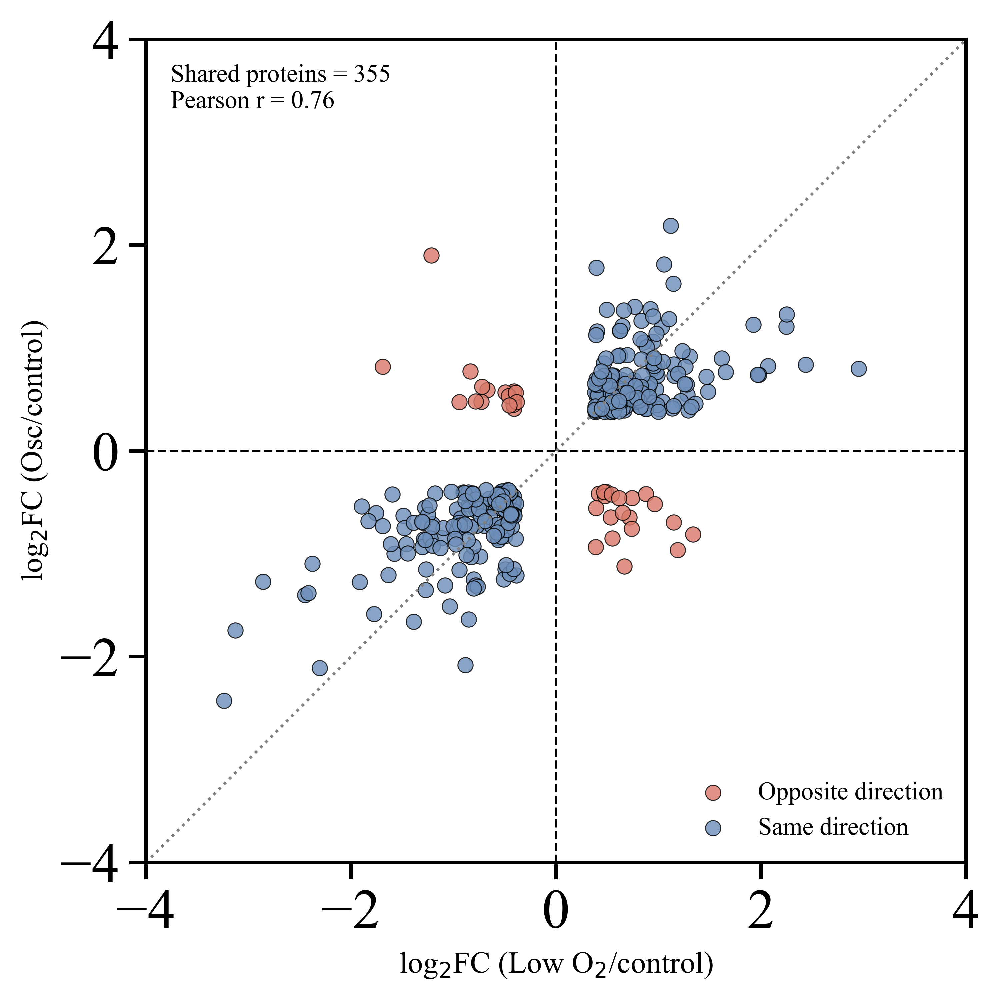

,proteinId,low/control_late_combined,osc/control_late_cominbed,direction_class,diag_diff,abs_diag_diff
0,1036,0.740677,-0.457891,Opposite direction,-1.198568,1.198568
1,1076,0.973901,0.599904,Same direction,-0.373997,0.373997
2,1080,0.419412,0.509591,Same direction,0.090179,0.090179
3,1084,-0.536795,-0.478713,Same direction,0.058081,0.058081
4,1096,-0.530096,-0.537979,Same direction,-0.007883,0.007883


In [17]:

proteomics_prep = dataset_registry["proteomics"]
proteomics_dir = ensure_dir(os.path.join(OUTDIR, "proteomics"))
proteomics_prefix = os.path.join(proteomics_dir, "proteomics_shared_fc")


# color_mode: "direction", "difference", or "single"
_fig, proteomics_shared_scatter_df = plot_shared_fc_scatter(
    proteomics_prep,
    save_prefix=proteomics_prefix,
    label_top_n=0,
    color_mode="direction"
)

proteomics_shared_scatter_df.head()


In [18]:
opposite_proteins_df = proteomics_shared_scatter_df[
    proteomics_shared_scatter_df["direction_class"] == "Opposite direction"
].copy()

opposite_proteins_df = opposite_proteins_df.sort_values(
    "abs_diag_diff", ascending=False
)

display(opposite_proteins_df)

,proteinId,low/control_late_combined,osc/control_late_cominbed,direction_class,diag_diff,abs_diag_diff
179,4671,-1.216614,1.899852,Opposite direction,3.116466,3.116466
193,4820,-1.690620,0.820205,Opposite direction,2.510825,2.510825
45,1796,1.187737,-0.962328,Opposite direction,-2.150065,2.150065
123,3519,1.334992,-0.810063,Opposite direction,-2.145054,2.145054
182,4702,1.146447,-0.695180,Opposite direction,-1.841628,1.841628
14,1340,0.666926,-1.121524,Opposite direction,-1.788450,1.788450
291,7,-0.835902,0.773955,Opposite direction,1.609858,1.609858
332,7595,0.737820,-0.755630,Opposite direction,-1.493449,1.493449
305,7231,0.962647,-0.515734,Opposite direction,-1.478381,1.478381
323,7503,-0.944409,0.475690,Opposite direction,1.420099,1.420099


In [19]:
# opposite-direction shared proteins
opposite_proteins_df = proteomics_shared_scatter_df.loc[
    proteomics_shared_scatter_df["direction_class"] == "Opposite direction",
    [PROTEIN_COL, LOW_FC_COL, OSC_FC_COL, "diag_diff", "abs_diag_diff", "direction_class"]
].copy()

# choose annotation columns you want
annotation_cols = [
    "definition",
    "pathway",
    "pathway_class",
    "pathway_type",
    "goName",
    "gotermType",
    "goAcc",
    "kogdefline",
    "kogClass",
    "kogGroup",
]

annotation_cols = [c for c in annotation_cols if c in prot.columns]

# one row per protein from the full proteomics table
prot_annot_unique = collapse_to_protein_annotations(
    prot,
    PROTEIN_COL,
    annotation_cols
)

# merge annotations onto opposite-direction proteins
opposite_proteins_annot_df = opposite_proteins_df.merge(
    prot_annot_unique,
    on=PROTEIN_COL,
    how="left"
)

# sort by biggest disagreement between low and oscillation
opposite_proteins_annot_df = opposite_proteins_annot_df.sort_values(
    "abs_diag_diff", ascending=False
).reset_index(drop=True)

display(opposite_proteins_annot_df)

,proteinId,low/control_late_combined,osc/control_late_cominbed,diag_diff,abs_diag_diff,direction_class,definition,pathway,pathway_class,pathway_type,goName,gotermType,goAcc,kogdefline,kogClass,kogGroup
0,4671,-1.216614,1.899852,3.116466,3.116466,Opposite direction,NaN,NaN,NaN,NaN,catalytic activity,molecular_function,GO:0003824,Predicted hydrolases of HD superfamily,General function prediction only,POORLY CHARACTERIZED
1,4820,-1.690620,0.820205,2.510825,2.510825,Opposite direction,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Thioredoxin-like protein,"Posttranslational modification, protein turnov...",CELLULAR PROCESSES AND SIGNALING
2,1796,1.187737,-0.962328,-2.150065,2.150065,Opposite direction,NaN,NaN,NaN,NaN,integral to membrane,cellular_component,GO:0016021,Predicted membrane protein,Function unknown,POORLY CHARACTERIZED
3,3519,1.334992,-0.810063,-2.145054,2.145054,Opposite direction,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4702,1.146447,-0.695180,-1.841628,1.841628,Opposite direction,NaN,NaN,NaN,NaN,"protein complex, protein polymerization, GTPas...","cellular_component, biological_process, molecu...","GO:0043234, GO:0051258, GO:0003924, GO:0005525",Beta tubulin,Cytoskeleton,CELLULAR PROCESSES AND SIGNALING
5,1340,0.666926,-1.121524,-1.788450,1.788450,Opposite direction,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,-0.835902,0.773955,1.609858,1.609858,Opposite direction,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,7595,0.737820,-0.755630,-1.493449,1.493449,Opposite direction,NaN,NaN,NaN,NaN,"catalytic activity, cellular metabolic process...","molecular_function, biological_process","GO:0003824, GO:0044237, GO:0050662, GO:0043892",Flavonol reductase/cinnamoyl-CoA reductase,Defense mechanisms,CELLULAR PROCESSES AND SIGNALING
8,7231,0.962647,-0.515734,-1.478381,1.478381,Opposite direction,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,7503,-0.944409,0.475690,1.420099,1.420099,Opposite direction,NaN,NaN,NaN,NaN,"nucleic acid binding, intracellular, zinc ion ...","molecular_function, cellular_component","GO:0003676, GO:0005622, GO:0008270",FOG: Zn-finger,General function prediction only,POORLY CHARACTERIZED


In [20]:
opposite_proteins_annot_df.to_csv(
    os.path.join(proteomics_dir, "proteomics_opposite_direction_shared_proteins_with_annotations.csv"),
    index=False
)

## 9) Run all requested plots


DATASET: proteomics
   dataset  sig_low  sig_osc  shared  osc_only  low_only
proteomics     1086      706     355       351       731
Annotation columns to run: ['kogClass', 'pathway_class', 'pathway', 'pathway_type', 'goName', 'kogdefline', 'definition']

--- proteomics | kogClass ---


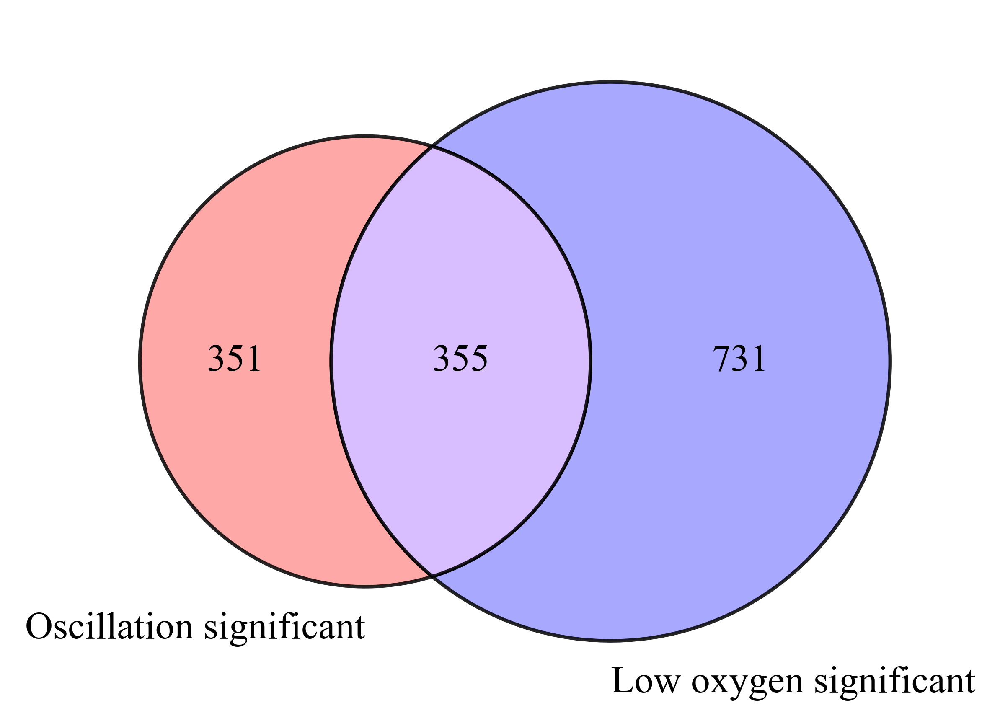


--- proteomics | pathway_class ---


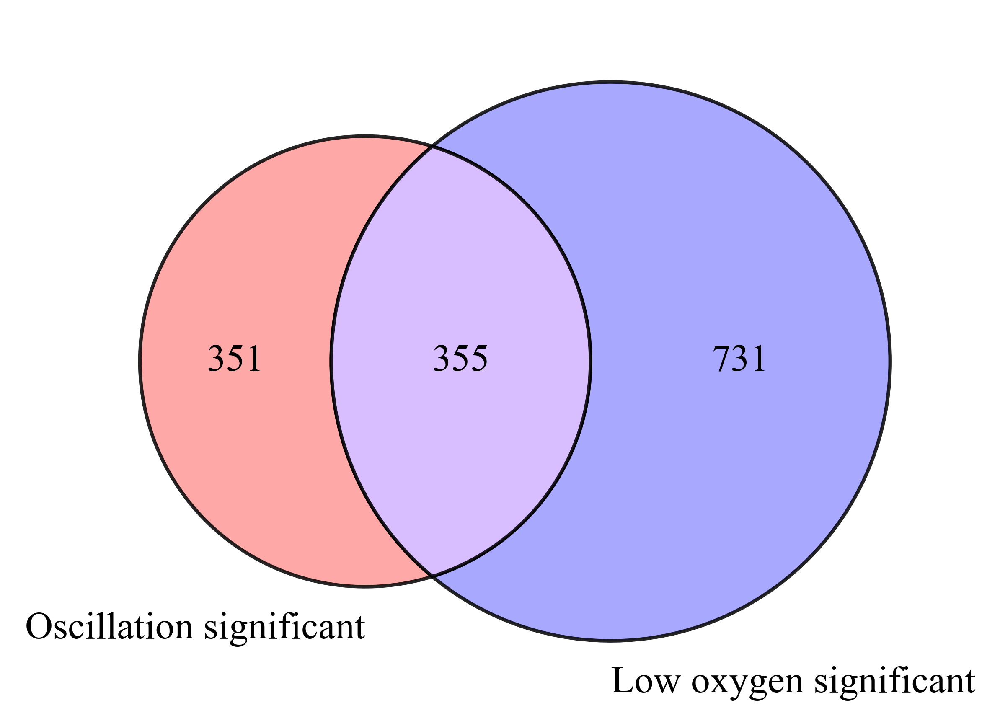


--- proteomics | pathway ---


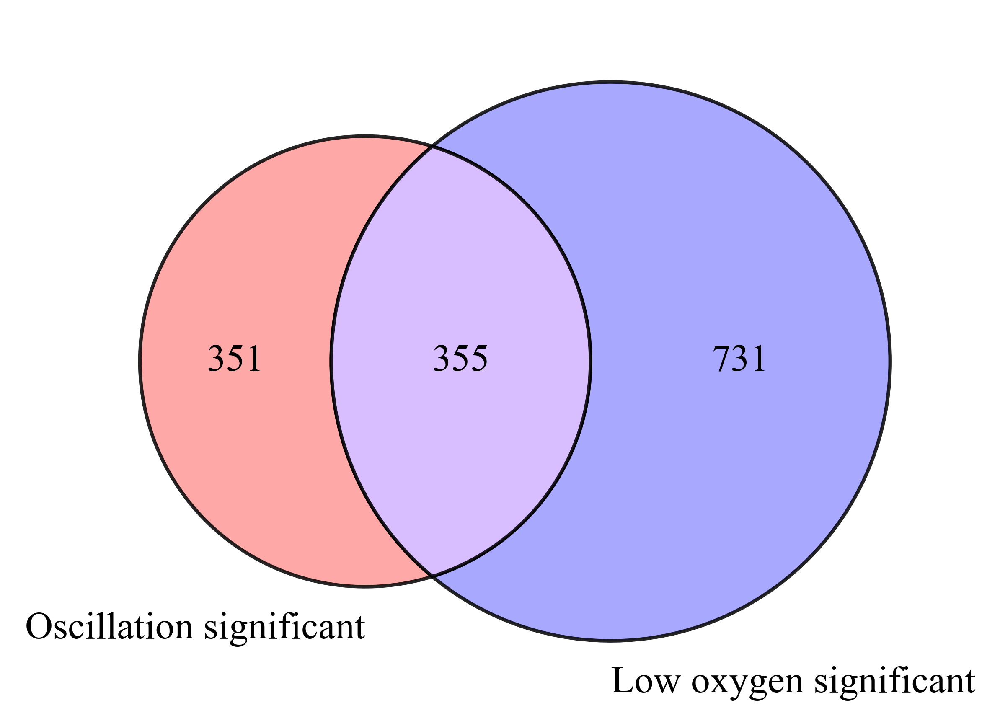


--- proteomics | pathway_type ---


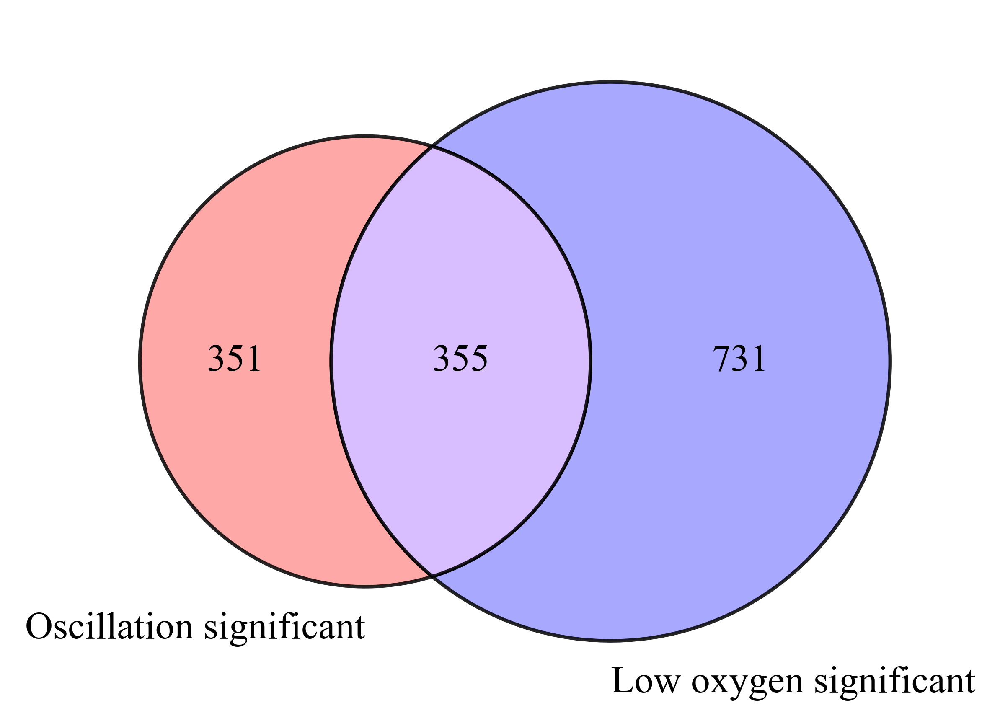


--- proteomics | goName ---


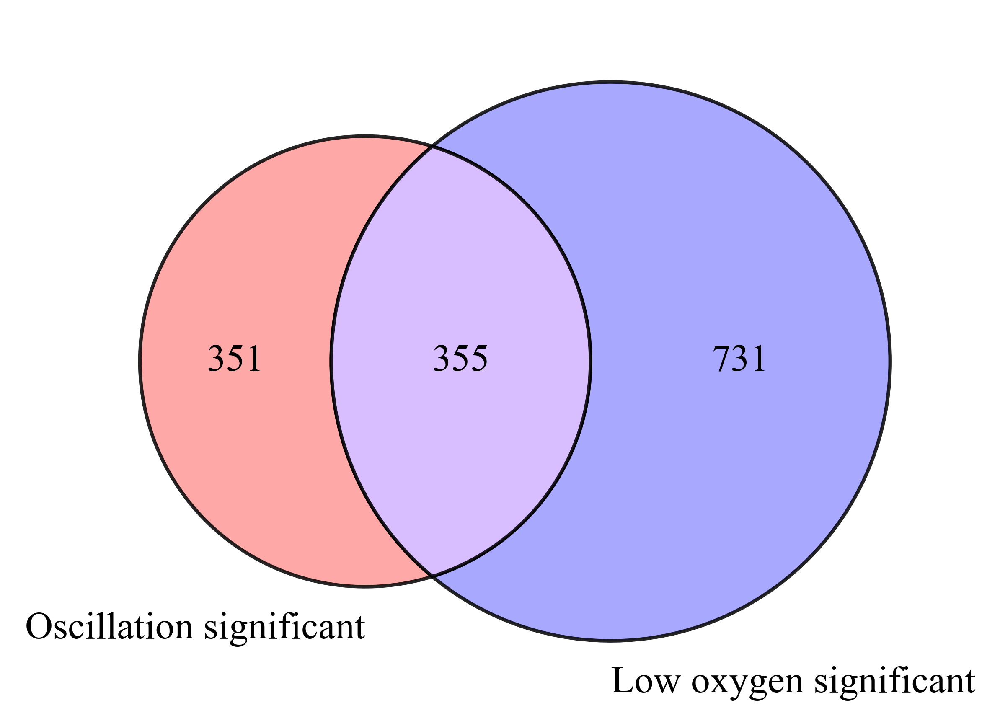


--- proteomics | kogdefline ---


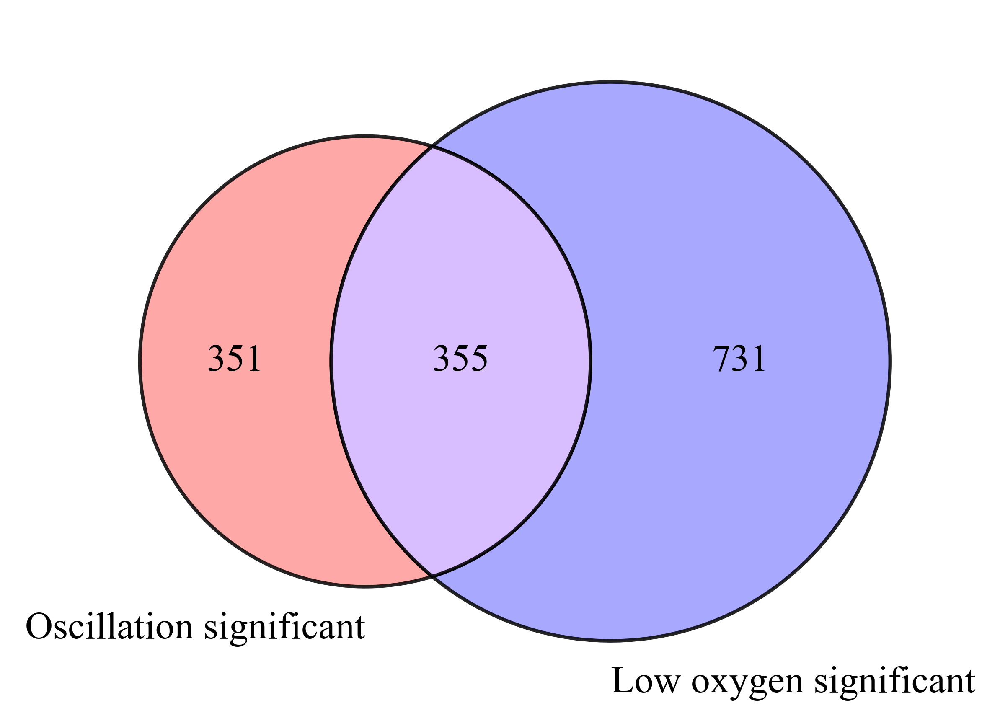


--- proteomics | definition ---


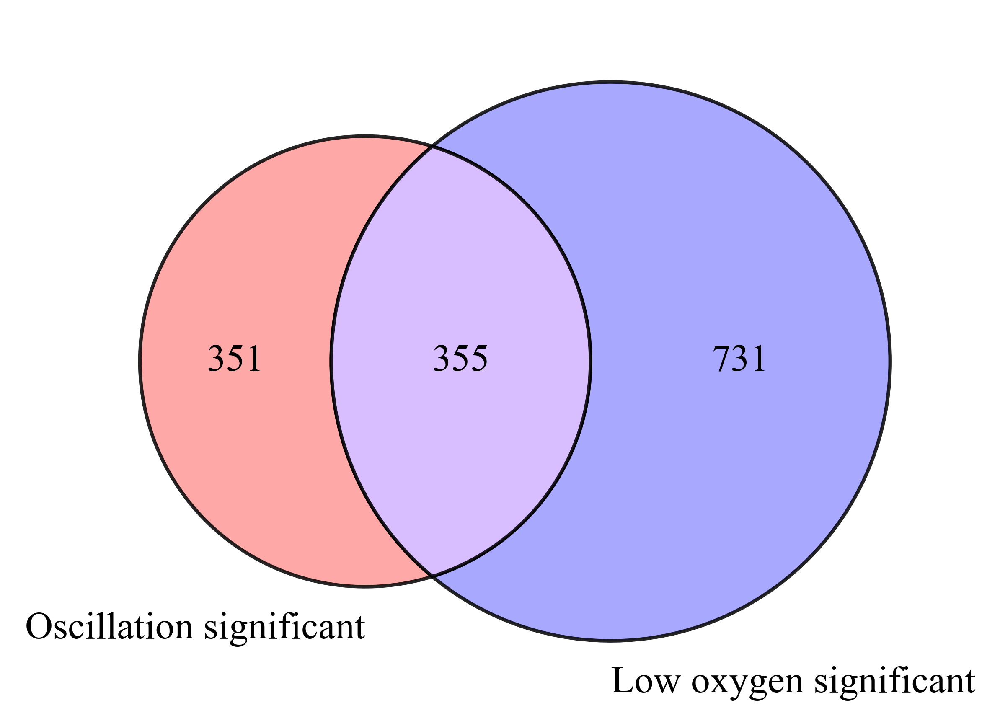


DATASET: redox
dataset  sig_low  sig_osc  shared  osc_only  low_only
  redox     1592      604     522        82      1070
Annotation columns to run: []

DATASET: phospho
dataset  sig_low  sig_osc  shared  osc_only  low_only
phospho       93       75      37        38        56
Annotation columns to run: ['kogClass', 'pathway_class', 'pathway', 'pathway_type', 'goName', 'kogdefline', 'definition']

--- phospho | kogClass ---


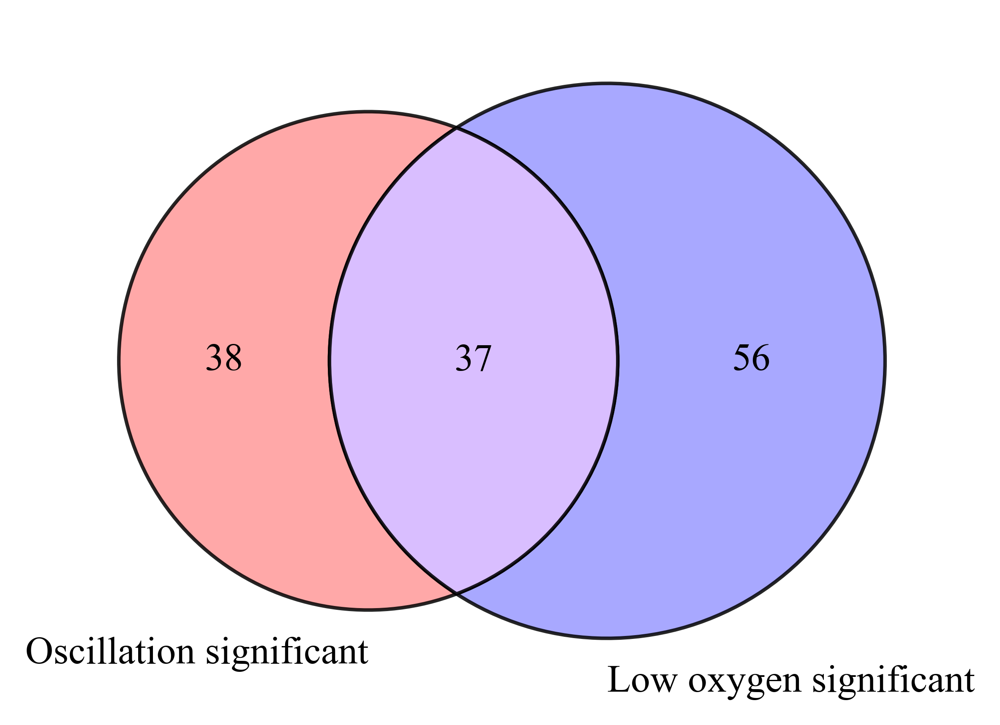


--- phospho | pathway_class ---


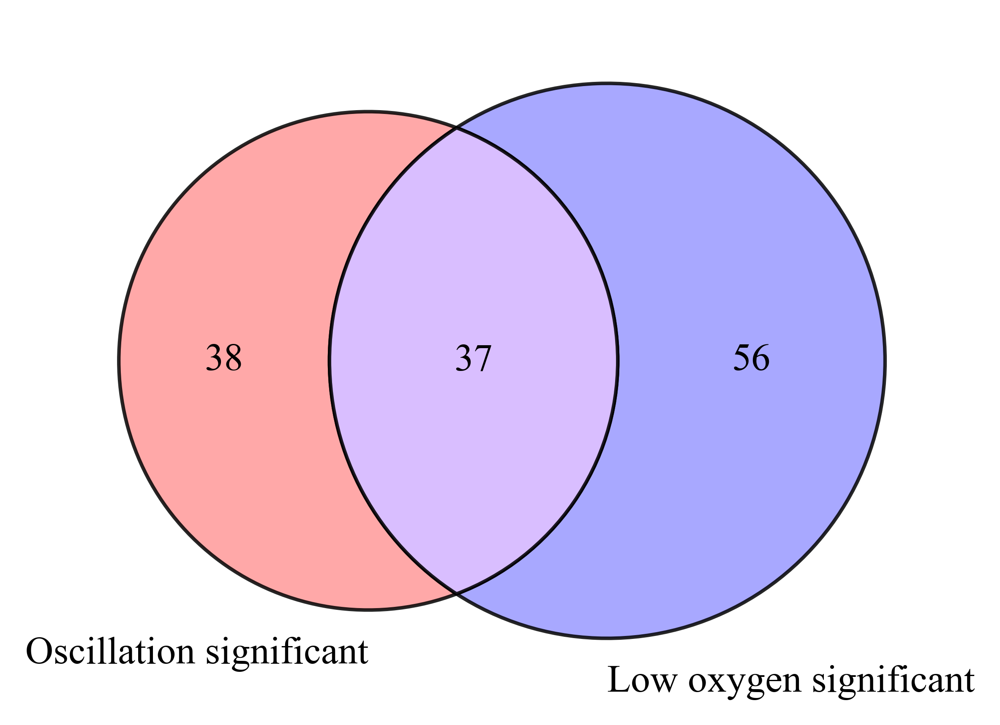


--- phospho | pathway ---


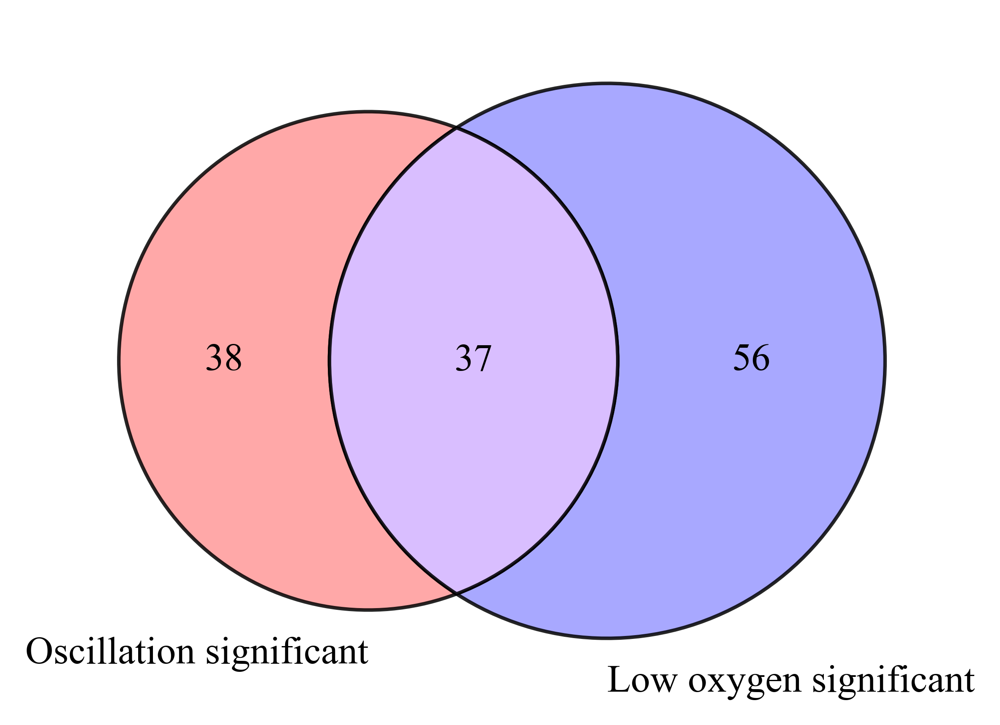


--- phospho | pathway_type ---


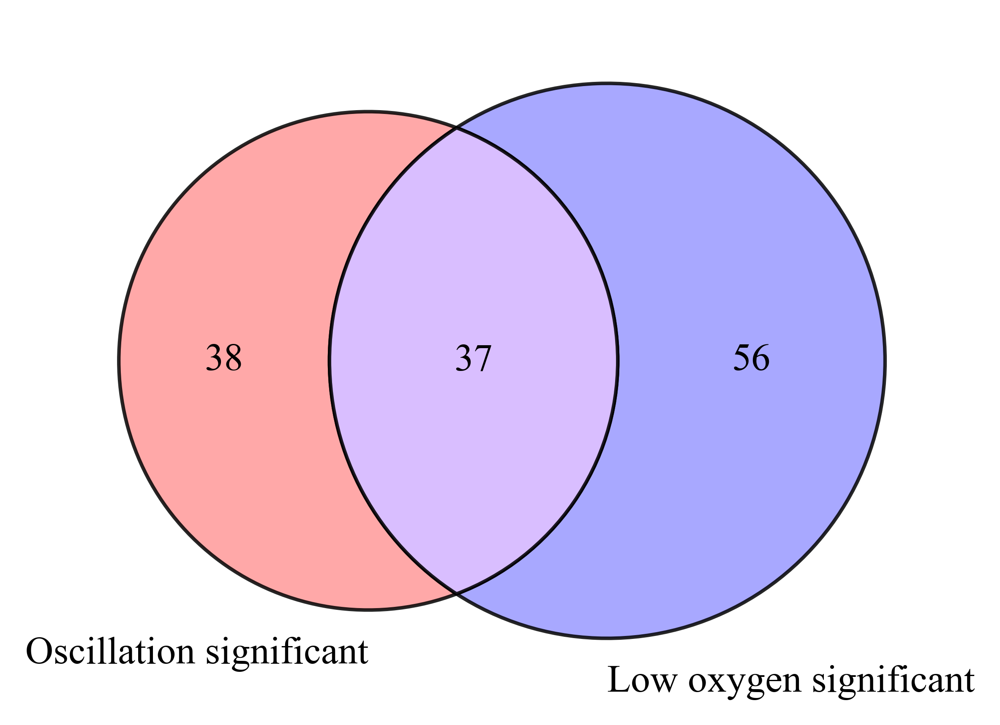


--- phospho | goName ---


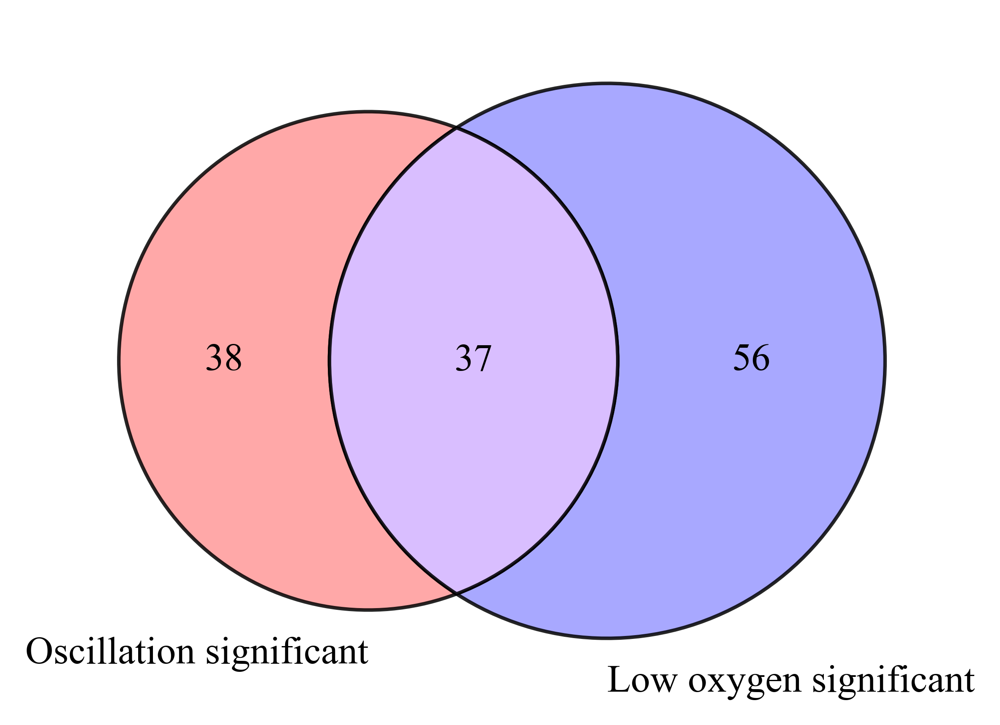


--- phospho | kogdefline ---


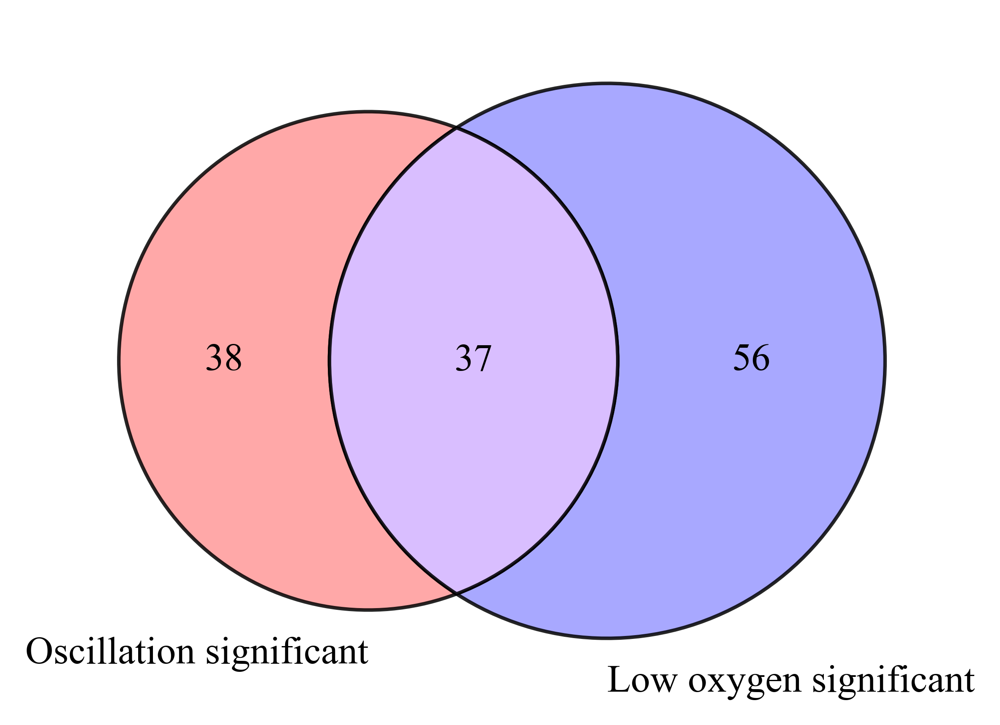


--- phospho | definition ---


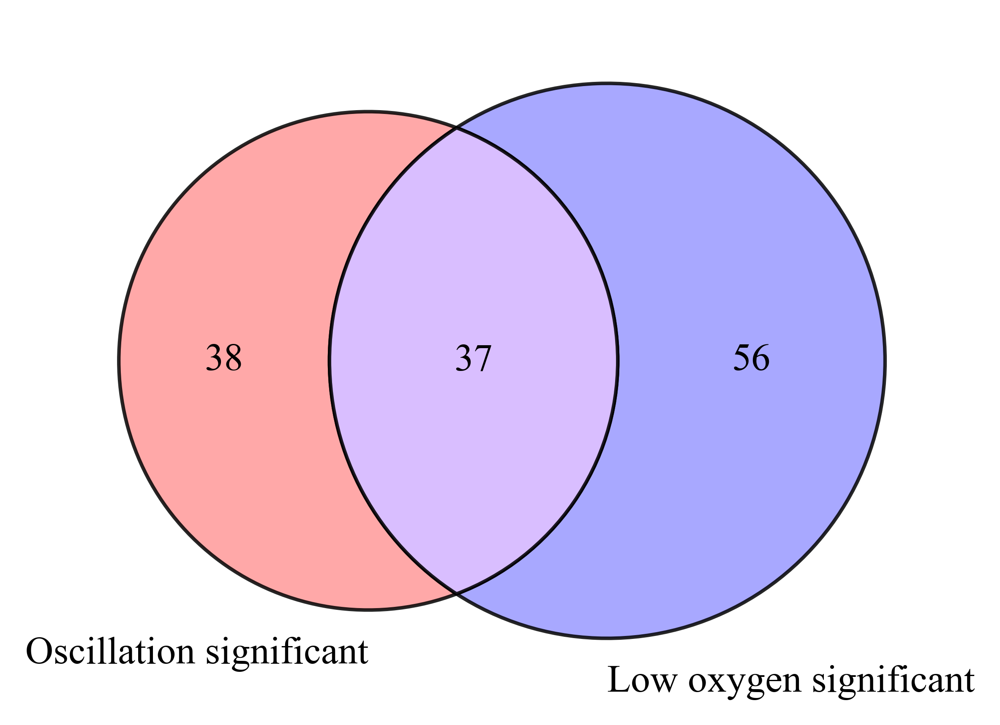

In [22]:

all_export_tables = []

for dataset_name in DATASETS_TO_RUN:
    prep = dataset_registry[dataset_name]
    ann_cols = get_annotation_cols(prep["raw_df"])

    dataset_dir = ensure_dir(os.path.join(OUTDIR, dataset_name))

    print("\n" + "=" * 80)
    print(f"DATASET: {dataset_name}")
    print(prep["summary"].to_string(index=False))
    print(f"Annotation columns to run: {ann_cols}")

    for ann_col in ann_cols:
        ann_safe = ann_col.replace("/", "_").replace(" ", "_")
        save_prefix = os.path.join(dataset_dir, f"{dataset_name}_{ann_safe}")

        print(f"\n--- {dataset_name} | {ann_col} ---")

        if "venn" in PLOT_STYLES:
            _ = plot_venn(prep, save_prefix=save_prefix)

        # if "enrichment_dotplot" in PLOT_STYLES:
        #     _, enrich_df = plot_enrichment_dotplot(prep, ann_col, save_prefix=save_prefix)
        #     if SAVE_TABLES and enrich_df is not None and not enrich_df.empty:
        #         tmp = enrich_df.copy()
        #         tmp["dataset"] = dataset_name
        #         tmp["annotation_col"] = ann_col
        #         tmp["plot_type"] = "enrichment_dotplot_source"
        #         all_export_tables.append(tmp)

        # if "raw_bubble" in PLOT_STYLES:
        #     _, raw_df = plot_raw_bubble(prep, ann_col, save_prefix=save_prefix)
        #     if SAVE_TABLES and raw_df is not None and not raw_df.empty:
        #         tmp = raw_df.copy()
        #         tmp["dataset"] = dataset_name
        #         tmp["annotation_col"] = ann_col
        #         tmp["plot_type"] = "raw_bubble_source"
        #         all_export_tables.append(tmp)
        #     _, raw_df = plot_raw_bubble_count(prep, ann_col, save_prefix=save_prefix)
        #     if SAVE_TABLES and raw_df is not None and not raw_df.empty:
        #         tmp = raw_df.copy()
        #         tmp["dataset"] = dataset_name
        #         tmp["annotation_col"] = ann_col
        #         tmp["plot_type"] = "raw_bubble_source"
        #         all_export_tables.append(tmp)

        # if "enrichment_heatmap" in PLOT_STYLES:
        #     _, enrich_df2 = plot_enrichment_heatmap(prep, ann_col, save_prefix=save_prefix)
        #     if SAVE_TABLES and enrich_df2 is not None and not enrich_df2.empty:
        #         tmp = enrich_df2.copy()
        #         tmp["dataset"] = dataset_name
        #         tmp["annotation_col"] = ann_col
        #         tmp["plot_type"] = "enrichment_heatmap_source"
        #         all_export_tables.append(tmp)
        #     _, enrich_df2 = plot_enrichment_heatmap_count(prep, ann_col, save_prefix=save_prefix)
        #     if SAVE_TABLES and enrich_df2 is not None and not enrich_df2.empty:
        #         tmp = enrich_df2.copy()
        #         tmp["dataset"] = dataset_name
        #         tmp["annotation_col"] = ann_col
        #         tmp["plot_type"] = "enrichment_heatmap_source"
        #         all_export_tables.append(tmp)

        # if "enrichment_barh" in PLOT_STYLES:
        #     _, enrich_df3 = plot_enrichment_barh(prep, ann_col, save_prefix=save_prefix)
        #     if SAVE_TABLES and enrich_df3 is not None and not enrich_df3.empty:
        #         tmp = enrich_df3.copy()
        #         tmp["dataset"] = dataset_name
        #         tmp["annotation_col"] = ann_col
        #         tmp["plot_type"] = "enrichment_barh_source"
        #         all_export_tables.append(tmp)


## 10) Save combined source tables

In [23]:

# if SAVE_TABLES and all_export_tables:
#     export_df = pd.concat(all_export_tables, ignore_index=True)
#     export_path = os.path.join(OUTDIR, "all_overlap_plot_source_tables.csv")
#     export_df.to_csv(export_path, index=False)
#     print("Saved:", export_path)
#     display(export_df.head())
# else:
#     print("No export tables were generated.")



## 11) Notes



### To loop over annotation columns
Set:
```python
ANNOTATION_MODE = "all"
```

### To switch to a single annotation column
Set:
```python
ANNOTATION_MODE = "single"
ANN_COL = "pathway_class"


## Redox

In [24]:
# =========================================
# REDOX site-level overlap
# =========================================
redox_id_col = "Site"

redox_low_tested = redox[
    redox[LOW_FC_COL].notna() & redox[LOW_PADJ_COL].notna()
].copy()

redox_osc_tested = redox[
    redox[OSC_FC_COL].notna() & redox[OSC_PADJ_COL].notna()
].copy()

redox_low_sig = redox_low_tested[
    (redox_low_tested[LOW_PADJ_COL] < 0.05) &
    (redox_low_tested[LOW_FC_COL].abs() > LOG2FC_THRESHOLD)
].copy()

redox_osc_sig = redox_osc_tested[
    (redox_osc_tested[OSC_PADJ_COL] < 0.05) &
    (redox_osc_tested[OSC_FC_COL].abs() > LOG2FC_THRESHOLD)
].copy()

redox_low_site_ids = set(redox_low_sig[redox_id_col].astype(str))
redox_osc_site_ids = set(redox_osc_sig[redox_id_col].astype(str))

redox_shared_site_ids = redox_low_site_ids & redox_osc_site_ids
redox_low_only_site_ids = redox_low_site_ids - redox_osc_site_ids
redox_osc_only_site_ids = redox_osc_site_ids - redox_low_site_ids

print("REDOX low sig sites:", len(redox_low_site_ids))
print("REDOX osc sig sites:", len(redox_osc_site_ids))
print("REDOX shared sig sites:", len(redox_shared_site_ids))


# =========================================
# REDOX protein-level overlap (any site of the protein significant)
# =========================================


REDOX low sig sites: 3123
REDOX osc sig sites: 913
REDOX shared sig sites: 621


In [25]:
redox_protein_col = "Protein"   # confirm this matches your column name

redox_low_protein_ids = set(redox_low_sig[redox_protein_col].astype(str))
redox_osc_protein_ids = set(redox_osc_sig[redox_protein_col].astype(str))

redox_shared_protein_ids   = redox_low_protein_ids & redox_osc_protein_ids
redox_low_only_protein_ids = redox_low_protein_ids - redox_osc_protein_ids
redox_osc_only_protein_ids = redox_osc_protein_ids - redox_low_protein_ids

print("REDOX low sig proteins:",    len(redox_low_protein_ids))
print("REDOX osc sig proteins:",    len(redox_osc_protein_ids))
print("REDOX shared sig proteins:", len(redox_shared_protein_ids))
print("REDOX low-only proteins:",   len(redox_low_only_protein_ids))
print("REDOX osc-only proteins:",   len(redox_osc_only_protein_ids))

REDOX low sig proteins: 1592
REDOX osc sig proteins: 604
REDOX shared sig proteins: 522
REDOX low-only proteins: 1070
REDOX osc-only proteins: 82


In [26]:
# Differential site usage = proteins shared at protein level
# but with no individual shared site
redox_low_only_sig_proteins = set(redox_low_sig[redox_protein_col].astype(str))
redox_osc_only_sig_proteins = set(redox_osc_sig[redox_protein_col].astype(str))
protein_shared = redox_low_only_sig_proteins & redox_osc_only_sig_proteins

# proteins that appear in shared-site set
shared_sites_df = redox[redox[redox_id_col].astype(str).isin(redox_shared_site_ids)]
proteins_with_shared_sites = set(shared_sites_df[redox_protein_col].astype(str))

diff_site_usage = protein_shared - proteins_with_shared_sites
print(f"\nProteins shared at protein level: {len(protein_shared)}")
print(f"  ...with at least one shared SITE: {len(proteins_with_shared_sites)}")
print(f"  ...with differential site usage:  {len(diff_site_usage)}")


Proteins shared at protein level: 522
  ...with at least one shared SITE: 435
  ...with differential site usage:  87


In [28]:
def site_and_protein_overlap(low_sig, osc_sig, site_col, protein_col, label=""):
    """Compute Venn overlap at both site and protein level for PTM data."""
    site_low = set(low_sig[site_col].astype(str))
    site_osc = set(osc_sig[site_col].astype(str))
    prot_low = set(low_sig[protein_col].astype(str))
    prot_osc = set(osc_sig[protein_col].astype(str))
    out = {
        "site_low": site_low, "site_osc": site_osc,
        "site_shared":   site_low & site_osc,
        "site_low_only": site_low - site_osc,
        "site_osc_only": site_osc - site_low,
        "protein_low": prot_low, "protein_osc": prot_osc,
        "protein_shared":   prot_low & prot_osc,
        "protein_low_only": prot_low - prot_osc,
        "protein_osc_only": prot_osc - prot_low,
    }
    if label:
        print(f"\n{label}")
        print(f"  sites    | low: {len(site_low):4d}  osc: {len(site_osc):4d}  shared: {len(out['site_shared']):4d}")
        print(f"  proteins | low: {len(prot_low):4d}  osc: {len(prot_osc):4d}  shared: {len(out['protein_shared']):4d}")
    return out


redox_overlap   = site_and_protein_overlap(redox_low_sig,   redox_osc_sig,   "Site", "Protein", label="REDOX")
# phospho_overlap = site_and_protein_overlap(phospho_low_sig, phospho_osc_sig, "Site", "Protein", label="Phospho")


REDOX
  sites    | low: 3123  osc:  913  shared:  621
  proteins | low: 1592  osc:  604  shared:  522


,Unnamed: 0,Peptide,Site,UniProt,Protein,Residue,AScore,id,Total missingness,Oscillation_24 missingness,...,low/control_late_combined_ANOVA_p,low/control_early_combined,low/control_early_combined_ANOVA_padj,low/control_early_combined_ANOVA_p,osc/control_late_cominbed,osc/control_late_cominbedANOVA_padj,osc/control_late_cominbedANOVA_p,osc/control_early_cominbed,osc/control_early_cominbedANOVA_padj,osc/control_early_cominbedANOVA_p
3,3,K.DC@TLATVDHNIPTTTR.K,jgi|YarliW29_1|1002@C55,jgi|YarliW29_1|1002,jgi|YarliW29_1|1002,C55,NaN,jgi|YarliW29_1|1002@C55,0,0,...,2.505666e-05,0.120556,0.121148,3.889152e-02,0.721698,0.018774,3.142833e-03,-0.157792,0.059889,0.008907
6,6,R.LQC@TTLEQNVK.D,jgi|YarliW29_1|1002@C88,jgi|YarliW29_1|1002,jgi|YarliW29_1|1002,C88,NaN,jgi|YarliW29_1|1002@C88,0,0,...,3.505338e-07,0.319060,0.017805,1.558211e-03,-0.753507,0.023794,4.370010e-03,-0.031847,0.676068,0.493590
18,18,A.IGAEVEVFEGC@K.N; E.VEVFEGC@K.N; E.VFEGC@K.N;...,jgi|YarliW29_1|1004@C422,jgi|YarliW29_1|1004,jgi|YarliW29_1|1004,C422,NaN,jgi|YarliW29_1|1004@C422,0,0,...,4.401394e-11,-1.016320,0.000416,6.567515e-07,-0.878306,0.000370,1.871197e-05,-0.510928,0.015382,0.000976
19,19,K.LNGGLGTSM*GC@VGPK.S; K.LNGGLGTSMGC@VGPK.S,jgi|YarliW29_1|100@C116,jgi|YarliW29_1|100,jgi|YarliW29_1|100,C116,NaN,jgi|YarliW29_1|100@C116,0,0,...,3.614441e-11,0.112135,0.474762,3.211660e-01,-1.109743,0.007354,8.688856e-04,0.023296,0.877437,0.773473
27,27,R.C@AC@PEDLNG.Y; R.C@AC@PEDLNGYK.N; R.C@AC@PED...,jgi|YarliW29_1|1014@C389,jgi|YarliW29_1|1014,jgi|YarliW29_1|1014,C389,NaN,jgi|YarliW29_1|1014@C389,0,0,...,9.229087e-03,0.342566,0.041220,6.922299e-03,-0.559119,0.000043,1.204371e-06,-0.012749,0.941790,0.890724
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5206,5206,R.YYC@PNC@H.N; R.YYC@PNC@HNMSC#EAR.K,jgi|YarliW29_1|941@C31,jgi|YarliW29_1|941,jgi|YarliW29_1|941,C31,NaN,jgi|YarliW29_1|941@C31,0,0,...,1.838223e-08,-0.594136,0.290949,1.508652e-01,-2.624543,0.000013,2.392532e-07,-1.184288,0.053851,0.007453
5207,5207,R.IGNLLVPNDNYC@K.F,jgi|YarliW29_1|948@C163,jgi|YarliW29_1|948,jgi|YarliW29_1|948,C163,NaN,jgi|YarliW29_1|948@C163,0,0,...,1.911719e-15,-0.307734,0.057590,1.197206e-02,-1.220754,0.000029,6.972647e-07,0.050225,0.728575,0.565595
5209,5209,K.YC@AC#HLATGDM*LR.S; K.YC@AC@HL.A; K.YC@AC@HL...,jgi|YarliW29_1|950@C61,jgi|YarliW29_1|950,jgi|YarliW29_1|950,C61,NaN,jgi|YarliW29_1|950@C61,0,0,...,3.689271e-04,0.172617,0.228078,1.036990e-01,1.576564,0.000609,3.535770e-05,-0.016310,0.933138,0.873668
5217,5217,R.TLLIC@GYPNVGK.S,jgi|YarliW29_1|972@C173,jgi|YarliW29_1|972,jgi|YarliW29_1|972,C173,NaN,jgi|YarliW29_1|972@C173,0,0,...,2.860473e-01,0.406145,0.006970,2.939524e-04,-0.750366,0.015498,2.476332e-03,-0.290193,0.082757,0.015839


In [29]:
# =========================================
# PHOSPHO site-level overlap
# =========================================
phospho_id_col = "Site"

phospho_low_tested = phospho[
    phospho[LOW_FC_COL].notna() & phospho[LOW_PADJ_COL].notna()
].copy()

phospho_osc_tested = phospho[
    phospho[OSC_FC_COL].notna() & phospho[OSC_PADJ_COL].notna()
].copy()

phospho_low_sig = phospho_low_tested[
    (phospho_low_tested[LOW_PADJ_COL] < 0.05) &
    (phospho_low_tested[LOW_FC_COL].abs() > LOG2FC_THRESHOLD)
].copy()

phospho_osc_sig = phospho_osc_tested[
    (phospho_osc_tested[OSC_PADJ_COL] < 0.05) &
    (phospho_osc_tested[OSC_FC_COL].abs() > LOG2FC_THRESHOLD)
].copy()

phospho_low_site_ids = set(phospho_low_sig[phospho_id_col].astype(str))
phospho_osc_site_ids = set(phospho_osc_sig[phospho_id_col].astype(str))

phospho_shared_site_ids = phospho_low_site_ids & phospho_osc_site_ids
phospho_low_only_site_ids = phospho_low_site_ids - phospho_osc_site_ids
phospho_osc_only_site_ids = phospho_osc_site_ids - phospho_low_site_ids

print("Phospho low sig sites:", len(phospho_low_site_ids))
print("Phospho osc sig sites:", len(phospho_osc_site_ids))
print("Phospho shared sig sites:", len(phospho_shared_site_ids))

Phospho low sig sites: 107
Phospho osc sig sites: 82
Phospho shared sig sites: 34


In [30]:
phospho

,Unnamed: 0,Peptide,Site,UniProt,Protein,Residue,AScore,id,Total missingness,Oscillation_24 missingness,...,low/control_late_combined,low/control_late_combined_ANOVA_padj,low/control_late_combined_ANOVA_p,osc/control_late_cominbed,osc/control_late_cominbedANOVA_padj,osc/control_late_cominbedANOVA_p,proteinID,#proteinId,osc/low_late_cominbed,osc/low_late_cominbedANOVA_p
0,0,K.LAEENTSEAIFDTPDT#DEDDAK.S,jgi|YarliW29_1|1012@T748,jgi|YarliW29_1|1012,jgi|YarliW29_1|1012,T748,43.406,jgi|YarliW29_1|1012@T748,18,0,...,NaN,NaN,NaN,0.325942,0.062850,0.030915,1012,1012,NaN,NaN
1,1,R.SNS#MSAFR.M,jgi|YarliW29_1|1029@S1108,jgi|YarliW29_1|1029,jgi|YarliW29_1|1029,S1108,22.217,jgi|YarliW29_1|1029@S1108,18,0,...,NaN,NaN,NaN,-0.190275,0.282757,0.192580,1029,1029,NaN,NaN
2,2,R.RGS#MTSTTTNTER.T,jgi|YarliW29_1|1029@S212,jgi|YarliW29_1|1029,jgi|YarliW29_1|1029,S212,45.543,jgi|YarliW29_1|1029@S212,36,3,...,NaN,NaN,NaN,NaN,NaN,NaN,1029,1029,NaN,NaN
3,3,R.THS#LTSTTTTIK.R; R.THS#LTSTTTTIKR.M,jgi|YarliW29_1|1029@S225,jgi|YarliW29_1|1029,jgi|YarliW29_1|1029,S225,28.746,jgi|YarliW29_1|1029@S225,0,0,...,0.394520,0.020056,0.011606,-0.234903,0.263804,0.173968,1029,1029,-0.629424,0.001191
4,4,R.TLS#PM*KPALK.M; R.TLS#PMKPALK.M,jgi|YarliW29_1|1029@S368,jgi|YarliW29_1|1029,jgi|YarliW29_1|1029,S368,1000.000,jgi|YarliW29_1|1029@S368,18,3,...,-1.030425,0.000030,0.000006,NaN,NaN,NaN,1029,1029,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,452,R.SYTDELQDTQVLEDPAES#DEEEEPVISR.K,jgi|YarliW29_1|868@S383,jgi|YarliW29_1|868,jgi|YarliW29_1|868,S383,138.590,jgi|YarliW29_1|868@S383,49,3,...,NaN,NaN,NaN,NaN,NaN,NaN,868,868,NaN,NaN
453,453,R.AAS#PSPVFR.S,jgi|YarliW29_1|930@S188,jgi|YarliW29_1|930,jgi|YarliW29_1|930,S188,39.967,jgi|YarliW29_1|930@S188,36,3,...,NaN,NaN,NaN,NaN,NaN,NaN,930,930,NaN,NaN
454,454,R.SSS#QSNIASIGFGK.W,jgi|YarliW29_1|965@S260,jgi|YarliW29_1|965,jgi|YarliW29_1|965,S260,0.000,jgi|YarliW29_1|965@S260,18,3,...,-0.244271,0.085368,0.057072,NaN,NaN,NaN,965,965,NaN,NaN
455,455,K.RS#PEASPEK.R,jgi|YarliW29_1|971@S12,jgi|YarliW29_1|971,jgi|YarliW29_1|971,S12,83.653,jgi|YarliW29_1|971@S12,18,0,...,NaN,NaN,NaN,0.287181,0.357872,0.259215,971,971,NaN,NaN


In [31]:
phospho_overlap = site_and_protein_overlap(phospho_low_sig, phospho_osc_sig, "Site", "Protein", label="Phospho")


Phospho
  sites    | low:  107  osc:   82  shared:   34
  proteins | low:   93  osc:   75  shared:   37


In [54]:
import re

In [55]:
FS_LEGEND=16
FS_AXLABEL=20
FS_CBAR_TICK=10
def plot_shared_site_fc_scatter(df, shared_site_ids, site_id_col="site_id",
                                low_fc_col=LOW_FC_COL, osc_fc_col=OSC_FC_COL,
                                title="Shared significant PTM sites",
                                label_top_n=0, save_prefix=None):
    """Scatter of Low vs Osc log2FC for shared significant PTM sites,
    colored by whether the two contrasts agree in direction."""
    plot_df = (
        df[df[site_id_col].astype(str).isin(shared_site_ids)]
        [[site_id_col, low_fc_col, osc_fc_col]]
        .dropna()
        .copy()
    )
    plot_df[site_id_col] = plot_df[site_id_col].astype(str)
    plot_df = (plot_df
               .groupby(site_id_col, as_index=False)
               .agg({low_fc_col: "mean", osc_fc_col: "mean"}))

    plot_df["direction_class"] = np.where(
        np.sign(plot_df[low_fc_col]) == np.sign(plot_df[osc_fc_col]),
        "Same direction", "Opposite direction",
    )
    plot_df["diag_diff"]     = plot_df[osc_fc_col] - plot_df[low_fc_col]
    plot_df["abs_diag_diff"] = plot_df["diag_diff"].abs()

    r = np.nan
    if len(plot_df) > 1:
        r = plot_df[[low_fc_col, osc_fc_col]].corr().iloc[0, 1]

    vals = pd.concat([plot_df[low_fc_col], plot_df[osc_fc_col]])
    lim_min = float(np.floor(vals.min() * 1.1))
    lim_max = float(np.ceil(vals.max() * 1.1))
    if lim_min == lim_max:
        lim_min -= 1; lim_max += 1

    # ── publication-styled figure ──────────────────────────────────
    fig, ax = plt.subplots(figsize=(8, 8), dpi=FIG_DPI)

    # Same palette as Fig 2 / GSEA bars
    color_map = {
        "Same direction":     "#2c3e50",   # dark slate
        "Opposite direction": "#c0392b",   # warm red
    }
    for cls, sub in plot_df.groupby("direction_class"):
        ax.scatter(
            sub[low_fc_col], sub[osc_fc_col],
            s=60, alpha=0.85,
            color=color_map.get(cls, "gray"),
            edgecolor="black", linewidth=0.5,
            label=cls,
        )

    ax.axhline(0, color="black", linewidth=1.0, linestyle="--")
    ax.axvline(0, color="black", linewidth=1.0, linestyle="--")
    ax.plot([lim_min, lim_max], [lim_min, lim_max],
            color="gray", linewidth=1.2, linestyle=":")

    if label_top_n > 0:
        to_label = plot_df.nlargest(label_top_n, "abs_diag_diff")
        for _, row in to_label.iterrows():
            ax.text(row[low_fc_col], row[osc_fc_col], row[site_id_col],
                    fontsize=11, ha="left", va="bottom")

    info_text = (f"Shared sites = {len(plot_df)}\nPearson r = {r:.2f}"
                 if pd.notna(r) else f"Shared sites = {len(plot_df)}")
    ax.text(0.03, 0.97, info_text, transform=ax.transAxes,
            ha="left", va="top", fontsize=FS_LEGEND_T,
            bbox=dict(boxstyle="round,pad=0.4", facecolor="white",
                      edgecolor="lightgray", alpha=0.9))

    ax.set_xlim(lim_min, lim_max)
    ax.set_ylim(lim_min, lim_max)
    ax.set_xlabel(r"Low O$_2$ vs Control (log$_2$FC)", fontsize=FS_AXLABEL)
    ax.set_ylabel(r"Oscillation vs Control (log$_2$FC)", fontsize=FS_AXLABEL)
    ax.tick_params(axis="both", which="major",
                   labelsize=FS_CBAR_TICK, width=1.2, length=5)
    ax.legend(frameon=False, fontsize=FS_LEGEND, loc="lower right")
    # No on-figure title — caption supplies it

    fig.tight_layout()

    # ── save (fixed) ───────────────────────────────────────────────
    if SAVE_FIGURES:
        if save_prefix is None:
            safe = re.sub(r"[^a-zA-Z0-9_-]+", "_", title).strip("_").lower()
            save_prefix = safe
        fig.savefig(f"{save_prefix}.pdf")
        fig.savefig(f"{save_prefix}.png", dpi=FIG_DPI)

    plt.show()
    return plot_df

## scatter plots of shared PTM responses. 

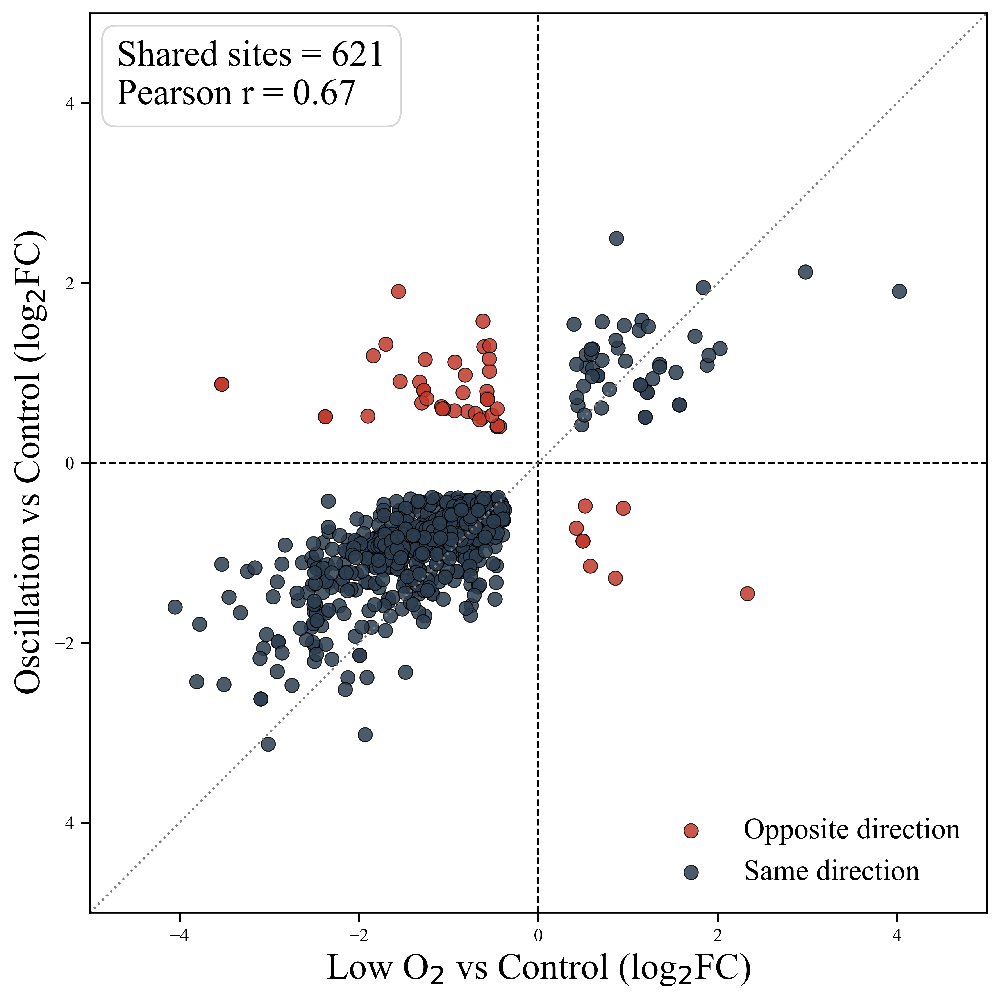

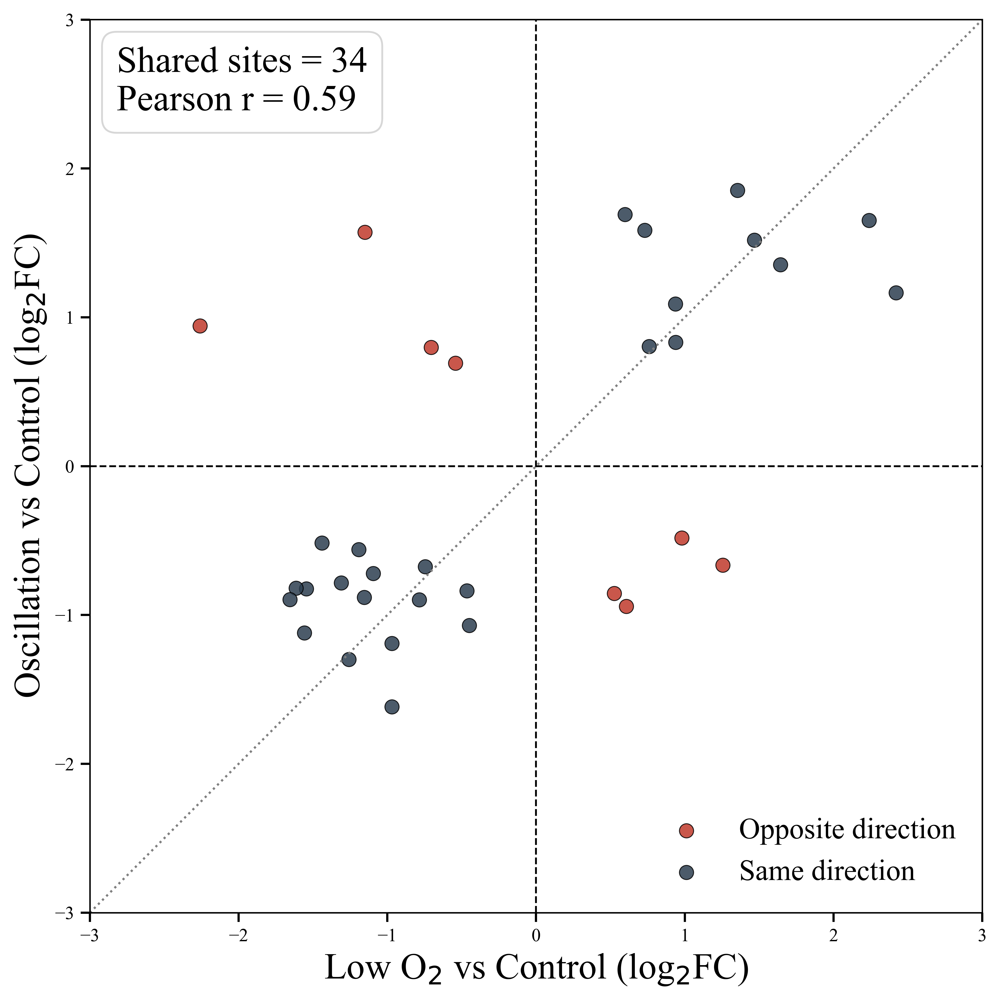

In [56]:
redox_shared_site_scatter_df = plot_shared_site_fc_scatter(
    redox,
    redox_shared_site_ids,
    site_id_col="Site",
    title="REDOX shared significant sites",
    label_top_n=0
)

phospho_shared_site_scatter_df = plot_shared_site_fc_scatter(
    phospho,
    phospho_shared_site_ids,
    site_id_col="Site",
    title="Phosphorylation shared significant sites",
    label_top_n=0
)

REDOX tested sites plotted: 3469


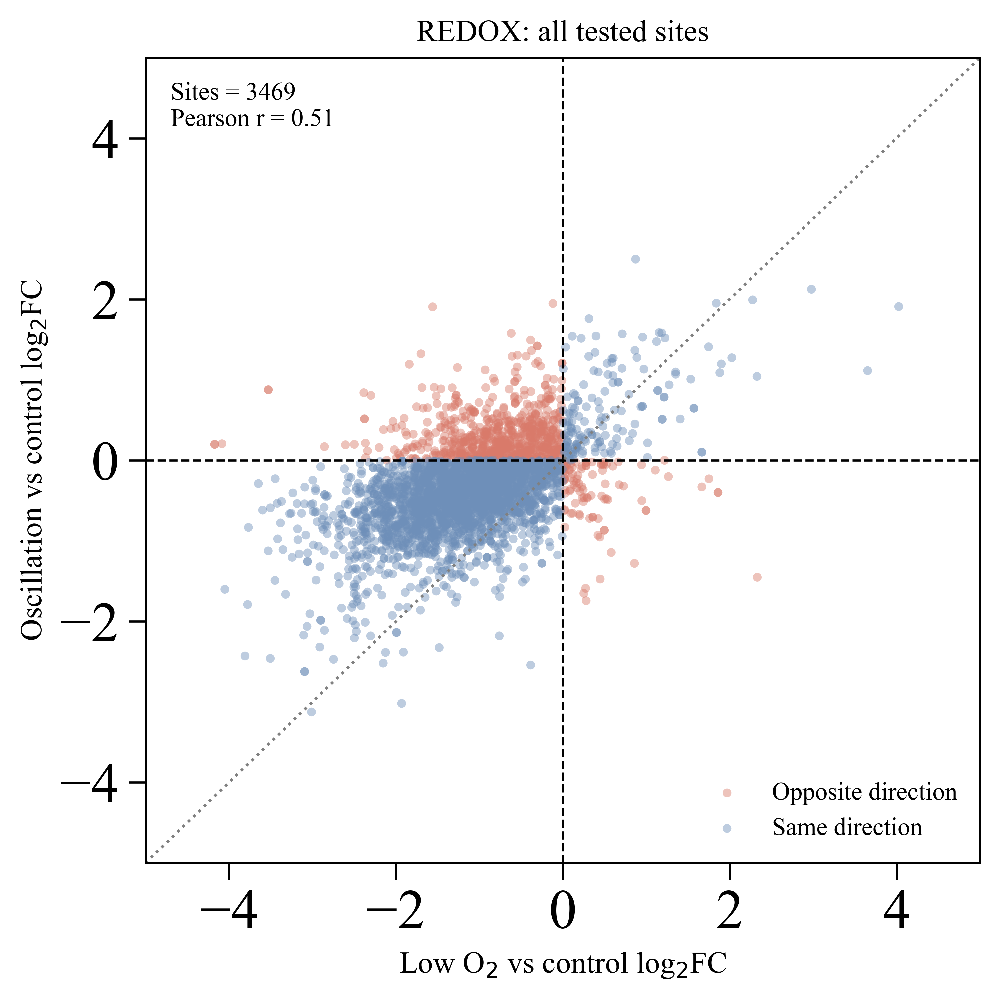

In [57]:


plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["ps.fonttype"] = 42

# =========================================
# REDOX: all tested sites scatter plot
# =========================================

redox_site_id_col = "Site"   # assumes notebook already created this

redox_all_sites_df = redox[
    redox[LOW_FC_COL].notna() & redox[OSC_FC_COL].notna()
].copy()

# if there are duplicate rows per site, collapse by mean
redox_all_sites_df[redox_site_id_col] = redox_all_sites_df[redox_site_id_col].astype(str)

redox_all_sites_df = (
    redox_all_sites_df
    .groupby(redox_site_id_col, as_index=False)
    .agg({
        LOW_FC_COL: "mean",
        OSC_FC_COL: "mean"
    })
)

print("REDOX tested sites plotted:", len(redox_all_sites_df))

redox_all_sites_df["direction_class"] = np.where(
    np.sign(redox_all_sites_df[LOW_FC_COL]) == np.sign(redox_all_sites_df[OSC_FC_COL]),
    "Same direction",
    "Opposite direction"
)

r = redox_all_sites_df[[LOW_FC_COL, OSC_FC_COL]].corr().iloc[0, 1]

vals = pd.concat([redox_all_sites_df[LOW_FC_COL], redox_all_sites_df[OSC_FC_COL]])
lim_min = float(np.floor(vals.min() * 1.05))
lim_max = float(np.ceil(vals.max() * 1.05))

fig, ax = plt.subplots(figsize=(5.4, 5.4), dpi=600)

color_map = {
    "Same direction": "#6E8FB9",
    "Opposite direction": "#D97A6A"
}

for cls, sub in redox_all_sites_df.groupby("direction_class"):
    ax.scatter(
        sub[LOW_FC_COL],
        sub[OSC_FC_COL],
        s=10,
        alpha=0.45,
        color=color_map.get(cls, "gray"),
        edgecolor="none",
        label=cls
    )

ax.axhline(0, color="black", linewidth=0.8, linestyle="--")
ax.axvline(0, color="black", linewidth=0.8, linestyle="--")
ax.plot([lim_min, lim_max], [lim_min, lim_max], color="gray", linewidth=1.0, linestyle=":")

ax.text(
    0.03, 0.97,
    f"Sites = {len(redox_all_sites_df)}\nPearson r = {r:.2f}",
    transform=ax.transAxes,
    ha="left",
    va="top",
    fontsize=9
)

ax.set_xlim(lim_min, lim_max)
ax.set_ylim(lim_min, lim_max)
ax.set_xlabel("Low O$_2$ vs control log$_2$FC", fontsize=11)
ax.set_ylabel("Oscillation vs control log$_2$FC", fontsize=11)
ax.set_title("REDOX: all tested sites", fontsize=11)
ax.legend(frameon=False, fontsize=9, loc="lower right")

plt.tight_layout()
plt.rcParams["axes.linewidth"] = 0.8       # consistent axis weight
plt.rcParams["xtick.major.width"] = 0.8
plt.rcParams["ytick.major.width"] = 0.8
plt.savefig("redox_correlation.tif",
            dpi=600, bbox_inches="tight", facecolor="white",
            pil_kwargs={"compression": "tiff_lzw"})
plt.show()

In [58]:

def plot_all_sites_fc_scatter(df, site_id_col="Site",
                               low_fc_col=LOW_FC_COL, osc_fc_col=OSC_FC_COL,
                               title="All tested sites",
                               save_prefix=None,
                               save_tif=True):
    """Scatter of Low vs Osc log2FC for every tested site (no significance filter),
    colored by whether the two contrasts agree in direction."""

    all_sites = df[df[low_fc_col].notna() & df[osc_fc_col].notna()].copy()
    all_sites[site_id_col] = all_sites[site_id_col].astype(str)
    all_sites = (all_sites
                 .groupby(site_id_col, as_index=False)
                 .agg({low_fc_col: "mean", osc_fc_col: "mean"}))

    print(f"{title}: {len(all_sites)} sites plotted")

    all_sites["direction_class"] = np.where(
        np.sign(all_sites[low_fc_col]) == np.sign(all_sites[osc_fc_col]),
        "Same direction", "Opposite direction",
    )

    r = (all_sites[[low_fc_col, osc_fc_col]].corr().iloc[0, 1]
         if len(all_sites) > 1 else np.nan)

    vals = pd.concat([all_sites[low_fc_col], all_sites[osc_fc_col]])
    lim_min = float(np.floor(vals.min() * 1.05))
    lim_max = float(np.ceil(vals.max() * 1.05))
    if lim_min == lim_max:
        lim_min -= 1; lim_max += 1

    fig, ax = plt.subplots(figsize=(8, 8), dpi=FIG_DPI)

    color_map = {
        "Same direction":     "#2c3e50",
        "Opposite direction": "#c0392b",
    }
    for cls, sub in all_sites.groupby("direction_class"):
        ax.scatter(
            sub[low_fc_col], sub[osc_fc_col],
            s=18, alpha=0.55,
            color=color_map.get(cls, "gray"),
            edgecolor="none",
            label=cls,
        )

    ax.axhline(0, color="black", linewidth=1.0, linestyle="--")
    ax.axvline(0, color="black", linewidth=1.0, linestyle="--")
    ax.plot([lim_min, lim_max], [lim_min, lim_max],
            color="gray", linewidth=1.2, linestyle=":")

    info_text = (f"Sites = {len(all_sites)}\nPearson r = {r:.2f}"
                 if pd.notna(r) else f"Sites = {len(all_sites)}")
    ax.text(0.03, 0.97, info_text, transform=ax.transAxes,
            ha="left", va="top", fontsize=FS_LEGEND_T,
            bbox=dict(boxstyle="round,pad=0.4", facecolor="white",
                      edgecolor="lightgray", alpha=0.9))

    ax.set_xlim(lim_min, lim_max)
    ax.set_ylim(lim_min, lim_max)
    ax.set_xlabel(r"Low O$_2$ vs Control (log$_2$FC)", fontsize=FS_AXLABEL)
    ax.set_ylabel(r"Oscillation vs Control (log$_2$FC)", fontsize=FS_AXLABEL)
    ax.tick_params(axis="both", which="major",
                   labelsize=FS_CBAR_TICK, width=1.2, length=5)
    ax.legend(frameon=False, fontsize=FS_LEGEND, loc="lower right")
    # No on-figure title — caption supplies it

    fig.tight_layout()

    if SAVE_FIGURES:
        if save_prefix is None:
            save_prefix = re.sub(r"[^a-zA-Z0-9_-]+", "_", title).strip("_").lower()
        fig.savefig(f"{save_prefix}.pdf")
        fig.savefig(f"{save_prefix}.png", dpi=FIG_DPI)
        if save_tif:
            fig.savefig(f"{save_prefix}.tif",
                        dpi=FIG_DPI, facecolor="white",
                        pil_kwargs={"compression": "tiff_lzw"})

    plt.show()
    return all_sites

REDOX all tested sites: 3469 sites plotted


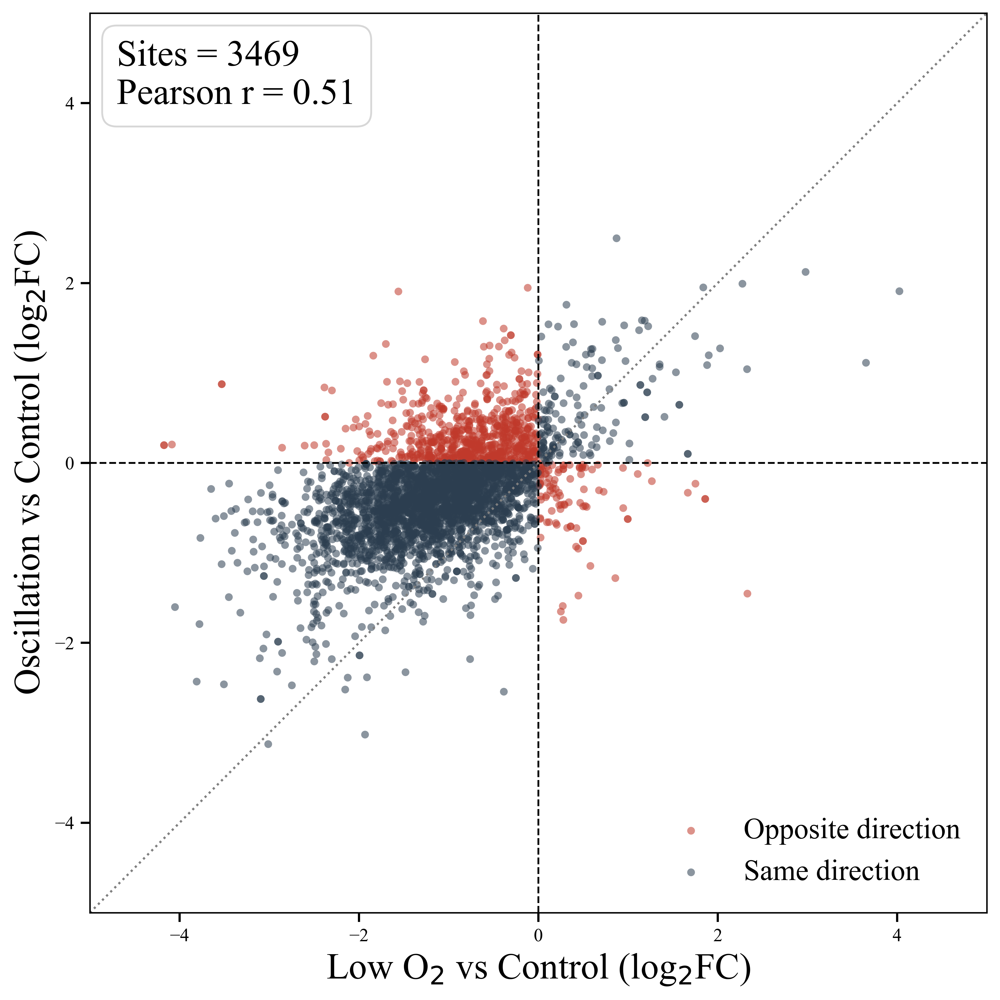

Phosphorylation all tested sites: 119 sites plotted


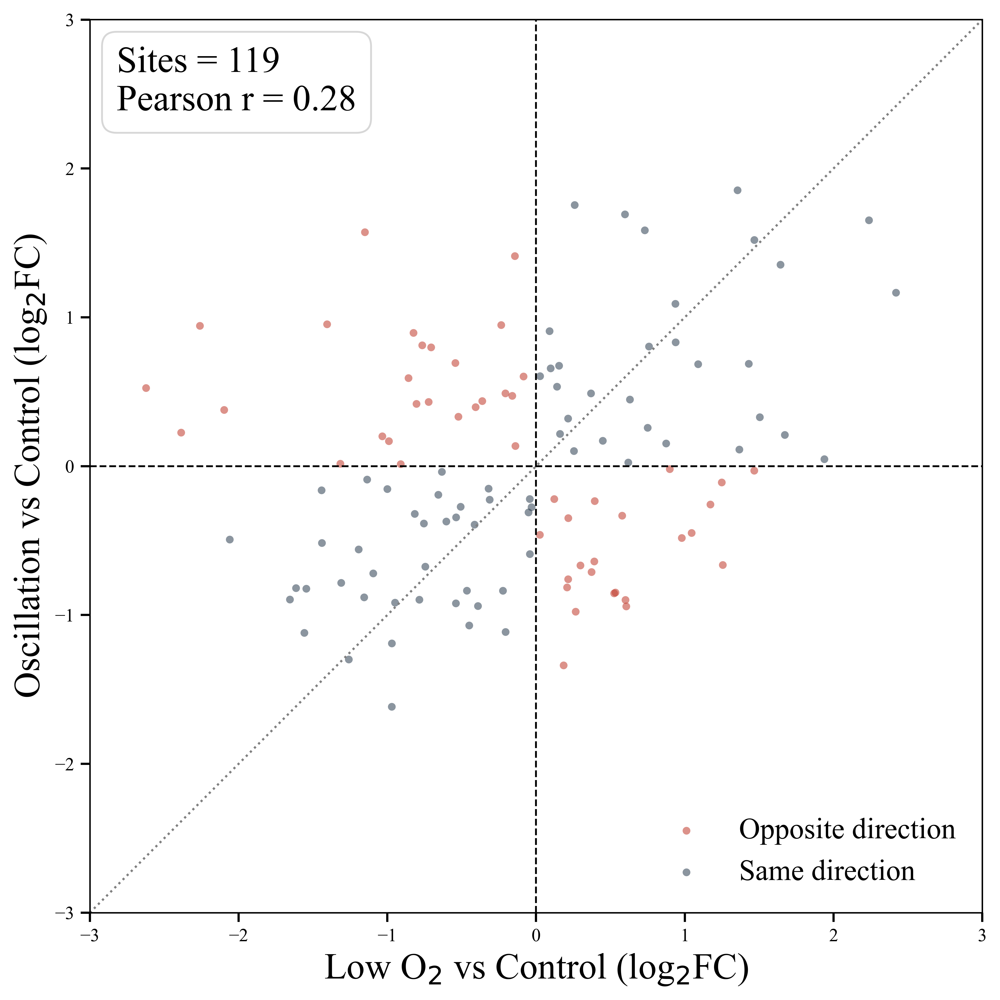

In [59]:
redox_all_sites_df = plot_all_sites_fc_scatter(
    redox,
    site_id_col="Site",
    title="REDOX all tested sites",
    save_prefix="redox_correlation",
)

phospho_all_sites_df = plot_all_sites_fc_scatter(
    phospho,
    site_id_col="Site",
    title="Phosphorylation all tested sites",
    save_prefix="phospho_correlation",
)

In [60]:
def assign_quadrant(x, y):
    if pd.isna(x) or pd.isna(y):
        return np.nan
    if x > 0 and y > 0:
        return "Q1_up_up"
    elif x < 0 and y > 0:
        return "Q2_low_down_osc_up"
    elif x < 0 and y < 0:
        return "Q3_down_down"
    elif x > 0 and y < 0:
        return "Q4_low_up_osc_down"
    elif x == 0 and y == 0:
        return "On origin"
    elif x == 0:
        return "On y-axis"
    elif y == 0:
        return "On x-axis"
    return "Other"

In [61]:
redox_all_sites_df["quadrant"] = redox_all_sites_df.apply(
    lambda r: assign_quadrant(r[LOW_FC_COL], r[OSC_FC_COL]),
    axis=1
)

display(redox_all_sites_df.head())
redox_all_sites_df["quadrant"].value_counts()

,Site,low/control_late_combined,osc/control_late_cominbed,direction_class,quadrant
0,jgi|YarliW29_1|1000@C503,-1.342868,0.498041,Opposite direction,Q2_low_down_osc_up
1,jgi|YarliW29_1|1002@C352,0.170906,0.170217,Same direction,Q1_up_up
2,jgi|YarliW29_1|1002@C55,-0.572486,0.721698,Opposite direction,Q2_low_down_osc_up
3,jgi|YarliW29_1|1002@C614,-1.127900,0.660425,Opposite direction,Q2_low_down_osc_up
4,jgi|YarliW29_1|1002@C704,-1.642798,0.344931,Opposite direction,Q2_low_down_osc_up


quadrant
Q3_down_down          2525
Q2_low_down_osc_up     690
Q1_up_up               156
Q4_low_up_osc_down      98
Name: count, dtype: int64

Phospho tested sites plotted: 119


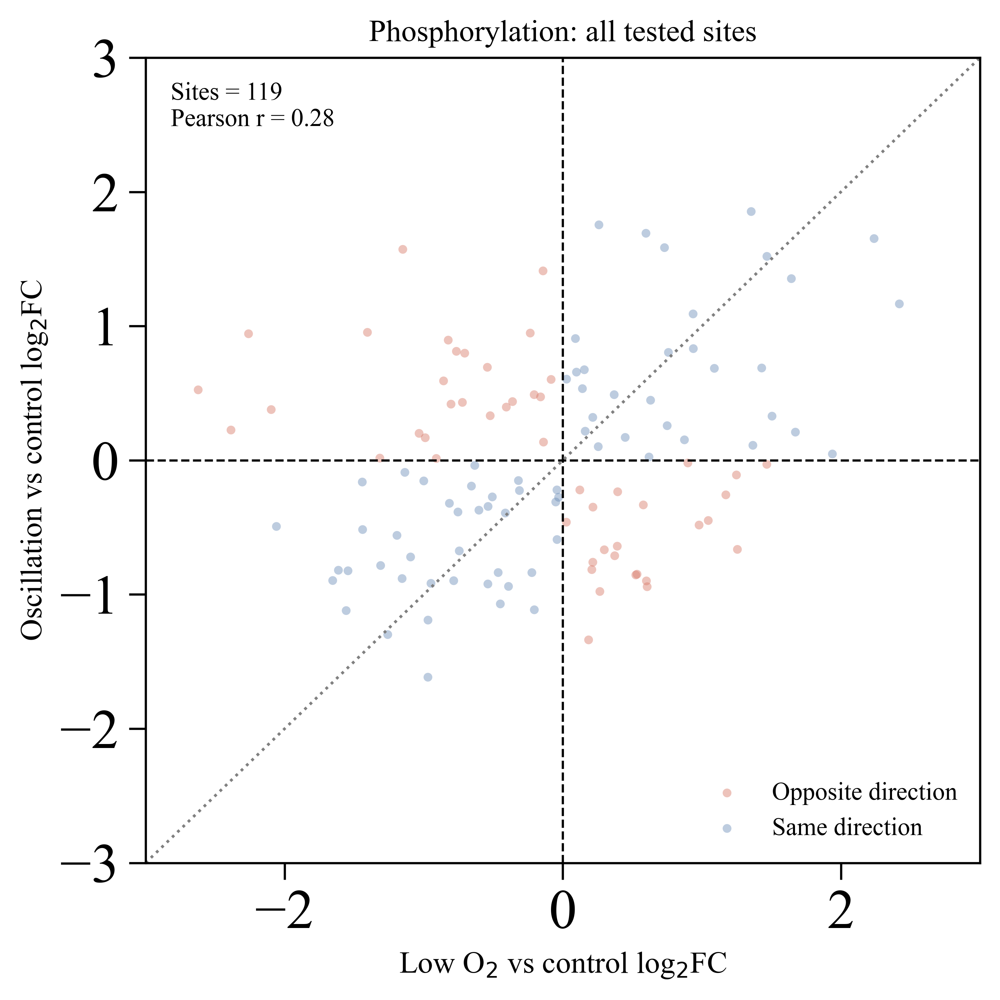

In [62]:
# =========================================
# PHOSPHO: all tested sites scatter plot
# =========================================

phospho_site_id_col = "Site"

phospho_all_sites_df = phospho[
    phospho[LOW_FC_COL].notna() & phospho[OSC_FC_COL].notna()
].copy()

phospho_all_sites_df[phospho_site_id_col] = phospho_all_sites_df[phospho_site_id_col].astype(str)

phospho_all_sites_df = (
    phospho_all_sites_df
    .groupby(phospho_site_id_col, as_index=False)
    .agg({
        LOW_FC_COL: "mean",
        OSC_FC_COL: "mean"
    })
)

print("Phospho tested sites plotted:", len(phospho_all_sites_df))

phospho_all_sites_df["direction_class"] = np.where(
    np.sign(phospho_all_sites_df[LOW_FC_COL]) == np.sign(phospho_all_sites_df[OSC_FC_COL]),
    "Same direction",
    "Opposite direction"
)

r = phospho_all_sites_df[[LOW_FC_COL, OSC_FC_COL]].corr().iloc[0, 1]

vals = pd.concat([phospho_all_sites_df[LOW_FC_COL], phospho_all_sites_df[OSC_FC_COL]])
lim_min = float(np.floor(vals.min() * 1.05))
lim_max = float(np.ceil(vals.max() * 1.05))

fig, ax = plt.subplots(figsize=(5.4, 5.4), dpi=600)

for cls, sub in phospho_all_sites_df.groupby("direction_class"):
    ax.scatter(
        sub[LOW_FC_COL],
        sub[OSC_FC_COL],
        s=10,
        alpha=0.45,
        color=color_map.get(cls, "gray"),
        edgecolor="none",
        label=cls
    )

ax.axhline(0, color="black", linewidth=0.8, linestyle="--")
ax.axvline(0, color="black", linewidth=0.8, linestyle="--")
ax.plot([lim_min, lim_max], [lim_min, lim_max], color="gray", linewidth=1.0, linestyle=":")

ax.text(
    0.03, 0.97,
    f"Sites = {len(phospho_all_sites_df)}\nPearson r = {r:.2f}",
    transform=ax.transAxes,
    ha="left",
    va="top",
    fontsize=9
)

ax.set_xlim(lim_min, lim_max)
ax.set_ylim(lim_min, lim_max)
ax.set_xlabel("Low O$_2$ vs control log$_2$FC", fontsize=11)
ax.set_ylabel("Oscillation vs control log$_2$FC", fontsize=11)
ax.set_title("Phosphorylation: all tested sites", fontsize=11)
ax.legend(frameon=False, fontsize=9, loc="lower right")

plt.tight_layout()
plt.savefig("redox_correlation.tif",
            dpi=600, bbox_inches="tight", facecolor="white",
            pil_kwargs={"compression": "tiff_lzw"})
plt.show()

Text(0.03, 0.97, 'Sites = 3469\nPearson r = 0.28')

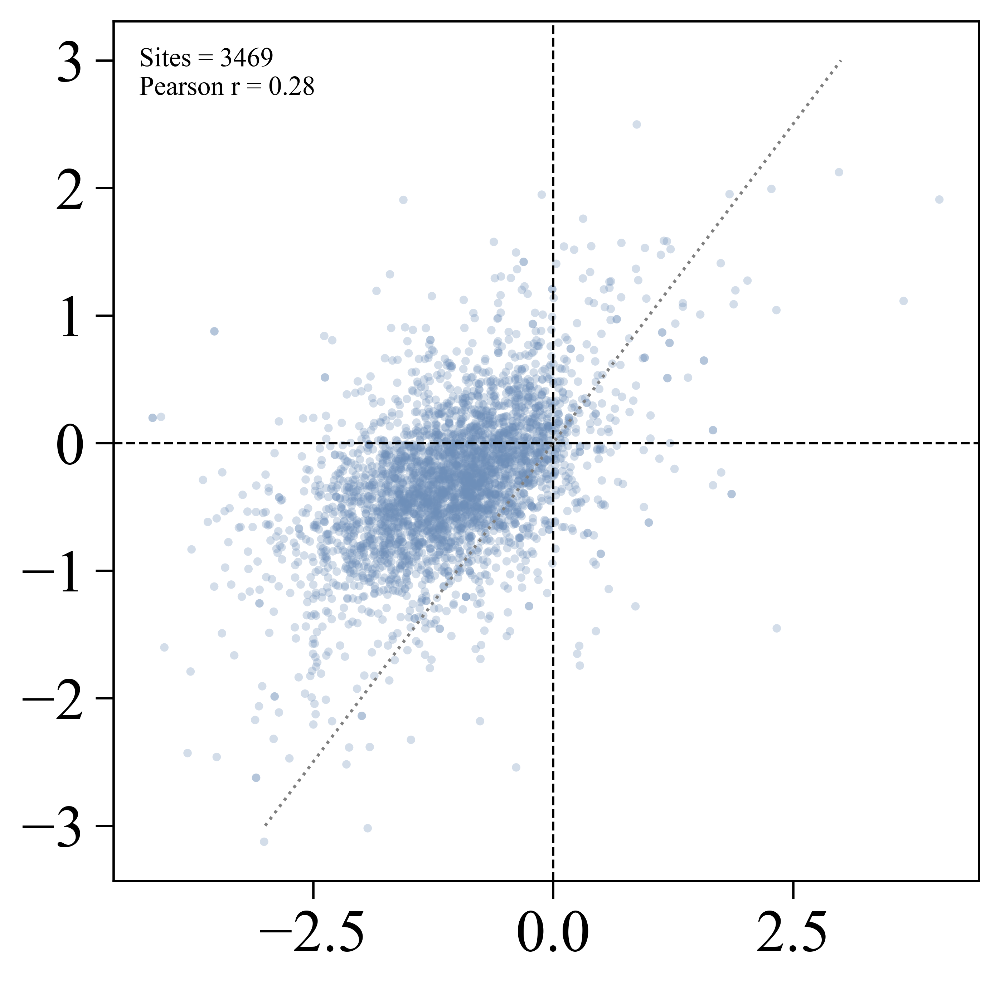

In [63]:
fig, ax = plt.subplots(figsize=(5.2, 5.2), dpi=600)

ax.scatter(
    redox_all_sites_df[LOW_FC_COL],
    redox_all_sites_df[OSC_FC_COL],
    s=8,
    alpha=0.30,
    color="#6E8FB9",
    edgecolor="none"
)

ax.axhline(0, color="black", linewidth=0.8, linestyle="--")
ax.axvline(0, color="black", linewidth=0.8, linestyle="--")
ax.plot([lim_min, lim_max], [lim_min, lim_max], color="gray", linewidth=1.0, linestyle=":")

ax.text(
    0.03, 0.97,
    f"Sites = {len(redox_all_sites_df)}\nPearson r = {r:.2f}",
    transform=ax.transAxes,
    ha="left",
    va="top",
    fontsize=9
)

In [41]:
# collapse significant REDOX sites to proteins
redox_low_sig_prot = collapse_to_protein_annotations(redox_low_sig, PROTEIN_COL, available_annotation_cols(redox))
redox_osc_sig_prot = collapse_to_protein_annotations(redox_osc_sig, PROTEIN_COL, available_annotation_cols(redox))
redox_all_prot_annot = collapse_to_protein_annotations(redox, PROTEIN_COL, available_annotation_cols(redox))

redox_low_prot_ids = set(redox_low_sig_prot[PROTEIN_COL].astype(str))
redox_osc_prot_ids = set(redox_osc_sig_prot[PROTEIN_COL].astype(str))

redox_shared_prot_ids = redox_low_prot_ids & redox_osc_prot_ids
redox_low_only_prot_ids = redox_low_prot_ids - redox_osc_prot_ids
redox_osc_only_prot_ids = redox_osc_prot_ids - redox_low_prot_ids

redox_low_only_prot_df = redox_all_prot_annot[redox_all_prot_annot[PROTEIN_COL].isin(redox_low_only_prot_ids)].copy()
redox_osc_only_prot_df = redox_all_prot_annot[redox_all_prot_annot[PROTEIN_COL].isin(redox_osc_only_prot_ids)].copy()
redox_shared_prot_df   = redox_all_prot_annot[redox_all_prot_annot[PROTEIN_COL].isin(redox_shared_prot_ids)].copy()

print("REDOX low-only proteins:", len(redox_low_only_prot_df))
print("REDOX shared proteins:", len(redox_shared_prot_df))
print("REDOX osc-only proteins:", len(redox_osc_only_prot_df))

REDOX low-only proteins: 1070
REDOX shared proteins: 522
REDOX osc-only proteins: 82


In [42]:
phospho_low_sig_prot = collapse_to_protein_annotations(phospho_low_sig, PROTEIN_COL, available_annotation_cols(phospho))
phospho_osc_sig_prot = collapse_to_protein_annotations(phospho_osc_sig, PROTEIN_COL, available_annotation_cols(phospho))
phospho_all_prot_annot = collapse_to_protein_annotations(phospho, PROTEIN_COL, available_annotation_cols(phospho))

phospho_low_prot_ids = set(phospho_low_sig_prot[PROTEIN_COL].astype(str))
phospho_osc_prot_ids = set(phospho_osc_sig_prot[PROTEIN_COL].astype(str))

phospho_shared_prot_ids = phospho_low_prot_ids & phospho_osc_prot_ids
phospho_low_only_prot_ids = phospho_low_prot_ids - phospho_osc_prot_ids
phospho_osc_only_prot_ids = phospho_osc_prot_ids - phospho_low_prot_ids

phospho_low_only_prot_df = phospho_all_prot_annot[phospho_all_prot_annot[PROTEIN_COL].isin(phospho_low_only_prot_ids)].copy()
phospho_osc_only_prot_df = phospho_all_prot_annot[phospho_all_prot_annot[PROTEIN_COL].isin(phospho_osc_only_prot_ids)].copy()
phospho_shared_prot_df   = phospho_all_prot_annot[phospho_all_prot_annot[PROTEIN_COL].isin(phospho_shared_prot_ids)].copy()

print("Phospho low-only proteins:", len(phospho_low_only_prot_df))
print("Phospho shared proteins:", len(phospho_shared_prot_df))
print("Phospho osc-only proteins:", len(phospho_osc_only_prot_df))

Phospho low-only proteins: 56
Phospho shared proteins: 37
Phospho osc-only proteins: 38


# Signficant different overtime. 

,Timepoint,Up,Down
0,3.5,0,0
1,4.5,1,0
2,5.5,0,0
3,24,105,2472
4,48,115,2814
5,72,132,2949


,Timepoint,Up,Down
0,3.5,0,0
1,4.5,0,0
2,5.5,1,0
3,24,94,948
4,48,233,354
5,72,209,408


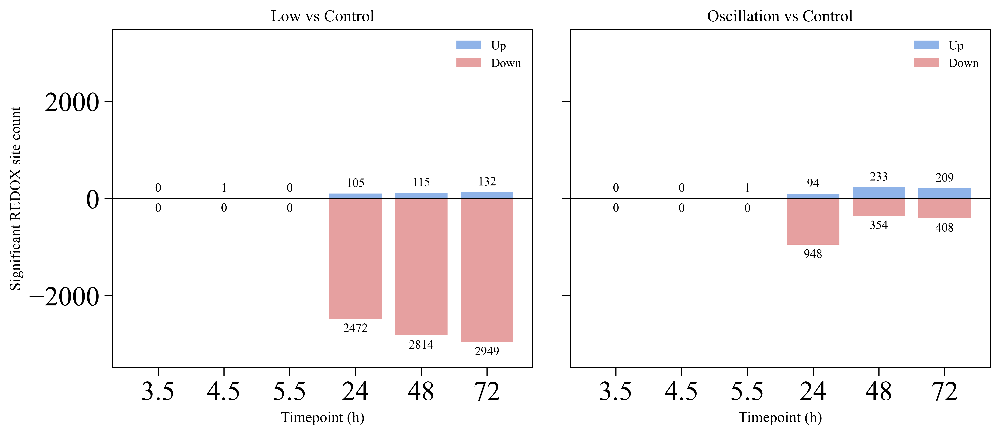

In [43]:


plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["ps.fonttype"] = 42

# =========================================
# REDOX significant site counts by timepoint
# using adj-p < 0.05, ignoring FC threshold
# =========================================

timepoints = ["3.5", "4.5", "5.5", "24", "48", "72"]

low_fc_cols = {
    "3.5": "Low_3.5/Control_3.5",
    "4.5": "Low_4.5/Control_4.5",
    "5.5": "Low_5.5/Control_5.5",
    "24":  "Low_24/Control_24",
    "48":  "Low_48/Control_48",
    "72":  "Low_72/Control_72",
}

low_padj_cols = {
    "3.5": "Low_3.5/Control_3.5_adj-p",
    "4.5": "Low_4.5/Control_4.5_adj-p",
    "5.5": "Low_5.5/Control_5.5_adj-p",
    "24":  "Low_24/Control_24_adj-p",
    "48":  "Low_48/Control_48_adj-p",
    "72":  "Low_72/Control_72_adj-p",
}

osc_fc_cols = {
    "3.5": "Oscillation_3.5/Control_3.5",
    "4.5": "Oscillation_4.5/Control_4.5",
    "5.5": "Oscillation_5.5/Control_5.5",
    "24":  "Oscillation_24/Control_24",
    "48":  "Oscillation_48/Control_48",
    "72":  "Oscillation_72/Control_72",
}

osc_padj_cols = {
    "3.5": "Oscillation_3.5/Control_3.5_adj-p",
    "4.5": "Oscillation_4.5/Control_4.5_adj-p",
    "5.5": "Oscillation_5.5/Control_5.5_adj-p",
    "24":  "Oscillation_24/Control_24_adj-p",
    "48":  "Oscillation_48/Control_48_adj-p",
    "72":  "Oscillation_72/Control_72_adj-p",
}

padj_cutoff = 0.05

# softer colors
up_color = "#8FB3E8"    # soft blue
down_color = "#E6A0A0"  # soft red

# -----------------------------------------
# Count significant up/down sites for Low
# -----------------------------------------
low_counts = []
for tp in timepoints:
    fc_col = low_fc_cols[tp]
    padj_col = low_padj_cols[tp]

    sig = redox[redox[padj_col] < padj_cutoff].copy()

    up_count = (sig[fc_col] > 0).sum(skipna=True)
    down_count = (sig[fc_col] < 0).sum(skipna=True)

    low_counts.append({
        "Timepoint": tp,
        "Up": up_count,
        "Down": down_count
    })

low_counts_df = pd.DataFrame(low_counts)

# -----------------------------------------
# Count significant up/down sites for Oscillation
# -----------------------------------------
osc_counts = []
for tp in timepoints:
    fc_col = osc_fc_cols[tp]
    padj_col = osc_padj_cols[tp]

    sig = redox[redox[padj_col] < padj_cutoff].copy()

    up_count = (sig[fc_col] > 0).sum(skipna=True)
    down_count = (sig[fc_col] < 0).sum(skipna=True)

    osc_counts.append({
        "Timepoint": tp,
        "Up": up_count,
        "Down": down_count
    })

osc_counts_df = pd.DataFrame(osc_counts)

display(low_counts_df)
display(osc_counts_df)

# =========================================
# Plot: two diverging bar charts
# =========================================
fig, axes = plt.subplots(1, 2, figsize=(10.5, 4.8), dpi=600, sharey=True)

# set shared y limit with some headroom for labels
max_count = max(low_counts_df[["Up", "Down"]].to_numpy().max(),
                osc_counts_df[["Up", "Down"]].to_numpy().max())
ylim = max_count * 1.18 + 1

# --- Low ---
ax = axes[0]
ax.bar(low_counts_df["Timepoint"], low_counts_df["Up"], color=up_color, label="Up")
ax.bar(low_counts_df["Timepoint"], -low_counts_df["Down"], color=down_color, label="Down")
ax.axhline(0, color="black", linewidth=0.8)

for i, row in low_counts_df.iterrows():
    ax.text(i, row["Up"] + max_count * 0.03, str(row["Up"]),
            ha="center", va="bottom", fontsize=9)
    ax.text(i, -row["Down"] - max_count * 0.03, str(row["Down"]),
            ha="center", va="top", fontsize=9)

ax.set_title("Low vs Control", fontsize=12)
ax.set_xlabel("Timepoint (h)", fontsize=11)
ax.set_ylabel("Significant REDOX site count", fontsize=11)
ax.set_ylim(-ylim, ylim)
ax.legend(frameon=False, fontsize=9)

# --- Oscillation ---
ax = axes[1]
ax.bar(osc_counts_df["Timepoint"], osc_counts_df["Up"], color=up_color, label="Up")
ax.bar(osc_counts_df["Timepoint"], -osc_counts_df["Down"], color=down_color, label="Down")
ax.axhline(0, color="black", linewidth=0.8)

for i, row in osc_counts_df.iterrows():
    ax.text(i, row["Up"] + max_count * 0.03, str(row["Up"]),
            ha="center", va="bottom", fontsize=9)
    ax.text(i, -row["Down"] - max_count * 0.03, str(row["Down"]),
            ha="center", va="top", fontsize=9)

ax.set_title("Oscillation vs Control", fontsize=12)
ax.set_xlabel("Timepoint (h)", fontsize=11)
ax.set_ylim(-ylim, ylim)
ax.legend(frameon=False, fontsize=9)

plt.tight_layout()
# Add near the top with your other rcParams
plt.rcParams["svg.fonttype"] = "none"     # editable text in SVG
plt.rcParams["axes.linewidth"] = 0.8       # consistent axis weight
plt.rcParams["xtick.major.width"] = 0.8
plt.rcParams["ytick.major.width"] = 0.8
plt.savefig("redox_significant_sites_diverging.tif",
            dpi=600, bbox_inches="tight", facecolor="white",
            pil_kwargs={"compression": "tiff_lzw"})
plt.show()

Low vs Control


,Timepoint,Up,Down
0,3.5,0,0
1,4.5,1,0
2,5.5,0,0
3,24,105,2472
4,48,115,2814
5,72,132,2949


Oscillation vs Control


,Timepoint,Up,Down
0,3.5,0,0
1,4.5,0,0
2,5.5,1,0
3,24,94,948
4,48,233,354
5,72,209,408


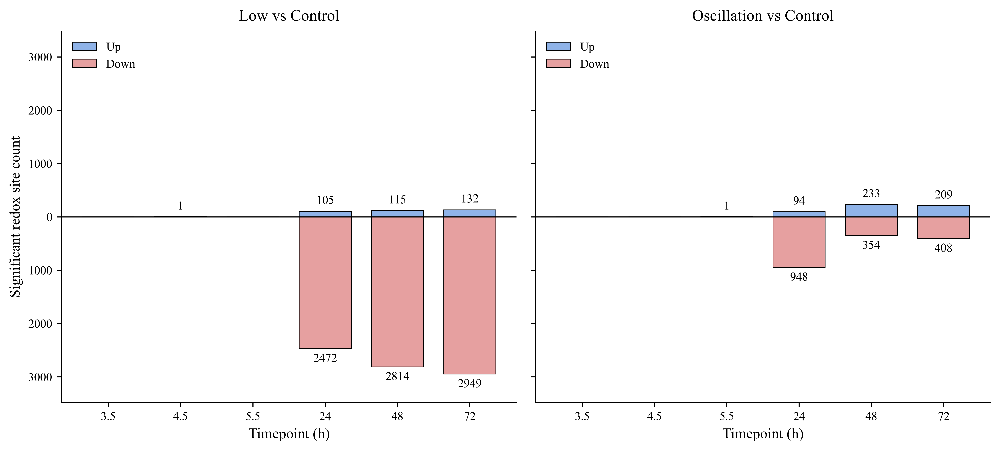

In [77]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Assumes the redox-proteomics DataFrame is already loaded as:
# redox = pd.read_csv("your_redox_file.csv")

# =========================================
# Publication-quality plotting parameters
# =========================================
plt.rcParams.update({
    "font.family": "Times New Roman",
    "font.size": 10,
    "pdf.fonttype": 42,       # Editable TrueType text in PDF
    "ps.fonttype": 42,
    "svg.fonttype": "none",   # Editable text in SVG
    "axes.linewidth": 0.8,
    "xtick.major.width": 0.8,
    "ytick.major.width": 0.8,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "savefig.dpi": 600,
})

# =========================================
# Redox-site counts by timepoint
# Significance: adjusted p-value < 0.05
# No fold-change magnitude threshold
# =========================================
timepoints = ["3.5", "4.5", "5.5", "24", "48", "72"]

low_fc_cols = {
    "3.5": "Low_3.5/Control_3.5",
    "4.5": "Low_4.5/Control_4.5",
    "5.5": "Low_5.5/Control_5.5",
    "24": "Low_24/Control_24",
    "48": "Low_48/Control_48",
    "72": "Low_72/Control_72",
}

low_padj_cols = {
    "3.5": "Low_3.5/Control_3.5_adj-p",
    "4.5": "Low_4.5/Control_4.5_adj-p",
    "5.5": "Low_5.5/Control_5.5_adj-p",
    "24": "Low_24/Control_24_adj-p",
    "48": "Low_48/Control_48_adj-p",
    "72": "Low_72/Control_72_adj-p",
}

osc_fc_cols = {
    "3.5": "Oscillation_3.5/Control_3.5",
    "4.5": "Oscillation_4.5/Control_4.5",
    "5.5": "Oscillation_5.5/Control_5.5",
    "24": "Oscillation_24/Control_24",
    "48": "Oscillation_48/Control_48",
    "72": "Oscillation_72/Control_72",
}

osc_padj_cols = {
    "3.5": "Oscillation_3.5/Control_3.5_adj-p",
    "4.5": "Oscillation_4.5/Control_4.5_adj-p",
    "5.5": "Oscillation_5.5/Control_5.5_adj-p",
    "24": "Oscillation_24/Control_24_adj-p",
    "48": "Oscillation_48/Control_48_adj-p",
    "72": "Oscillation_72/Control_72_adj-p",
}

padj_cutoff = 0.05

# Soft publication colors
up_color = "#8FB3E8"
down_color = "#E6A0A0"

# =========================================
# Validate required columns
# =========================================
required_cols = (
    list(low_fc_cols.values())
    + list(low_padj_cols.values())
    + list(osc_fc_cols.values())
    + list(osc_padj_cols.values())
)

missing_cols = [
    col for col in required_cols
    if col not in redox.columns
]

if missing_cols:
    raise KeyError(
        "The following required columns are missing from redox:\n"
        + "\n".join(missing_cols)
    )

# Convert relevant columns to numeric.
# Non-numeric values are converted to NaN and excluded.
redox_plot = redox.copy()

for col in required_cols:
    redox_plot[col] = pd.to_numeric(
        redox_plot[col],
        errors="coerce"
    )

# =========================================
# Function to count significant redox sites
# =========================================
def count_significant_sites(
    data,
    fc_columns,
    padj_columns,
    cutoff=0.05
):
    """
    Count significantly increased and decreased redox sites
    at each timepoint.

    Positive fold change = Up
    Negative fold change = Down
    Zero or missing fold change is not counted.
    """
    counts = []

    for tp in timepoints:
        fc_col = fc_columns[tp]
        padj_col = padj_columns[tp]

        significant = data.loc[
            data[padj_col].notna()
            & data[fc_col].notna()
            & (data[padj_col] < cutoff),
            fc_col
        ]

        counts.append({
            "Timepoint": tp,
            "Up": int((significant > 0).sum()),
            "Down": int((significant < 0).sum()),
        })

    return pd.DataFrame(counts)


# =========================================
# Calculate counts
# =========================================
low_counts_df = count_significant_sites(
    data=redox_plot,
    fc_columns=low_fc_cols,
    padj_columns=low_padj_cols,
    cutoff=padj_cutoff,
)

osc_counts_df = count_significant_sites(
    data=redox_plot,
    fc_columns=osc_fc_cols,
    padj_columns=osc_padj_cols,
    cutoff=padj_cutoff,
)

print("Low vs Control")
display(low_counts_df)

print("Oscillation vs Control")
display(osc_counts_df)

# =========================================
# Set common symmetrical y-axis limits
# =========================================
max_count = max(
    low_counts_df[["Up", "Down"]].to_numpy().max(),
    osc_counts_df[["Up", "Down"]].to_numpy().max(),
)

# Avoid a zero-height axis if no sites pass the cutoff
if max_count == 0:
    max_count = 1

ylim = max_count * 1.18
label_offset = max_count * 0.03

# Display the negative-axis tick labels as positive counts
absolute_tick_formatter = FuncFormatter(
    lambda value, position: f"{abs(int(value))}"
)

# =========================================
# Plot two diverging bar charts
# =========================================
fig, axes = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(10.5, 4.8),
    dpi=600,
    sharey=True,
)

x_positions = np.arange(len(timepoints))
bar_width = 0.72

# -----------------------------------------
# Panel 1: Low vs Control
# -----------------------------------------
ax = axes[0]

ax.bar(
    x_positions,
    low_counts_df["Up"],
    width=bar_width,
    color=up_color,
    edgecolor="black",
    linewidth=0.5,
    label="Up",
    zorder=3,
)

ax.bar(
    x_positions,
    -low_counts_df["Down"],
    width=bar_width,
    color=down_color,
    edgecolor="black",
    linewidth=0.5,
    label="Down",
    zorder=3,
)

ax.axhline(
    y=0,
    color="black",
    linewidth=0.8,
    zorder=4,
)

for x, row in zip(
    x_positions,
    low_counts_df.itertuples(index=False)
):
    if row.Up > 0:
        ax.text(
            x,
            row.Up + label_offset,
            str(row.Up),
            ha="center",
            va="bottom",
            fontsize=9,
        )

    if row.Down > 0:
        ax.text(
            x,
            -row.Down - label_offset,
            str(row.Down),
            ha="center",
            va="top",
            fontsize=9,
        )

ax.set_title(
    "Low vs Control",
    fontsize=12,
    pad=8,
)

ax.set_xlabel(
    "Timepoint (h)",
    fontsize=11,
)

ax.set_ylabel(
    "Significant redox site count",
    fontsize=11,
)

ax.set_xticks(x_positions)
ax.set_xticklabels(timepoints)
ax.set_ylim(-ylim, ylim)
ax.yaxis.set_major_formatter(absolute_tick_formatter)

ax.legend(
    frameon=False,
    fontsize=9,
    loc="upper left",
)

# -----------------------------------------
# Panel 2: Oscillation vs Control
# -----------------------------------------
ax = axes[1]

ax.bar(
    x_positions,
    osc_counts_df["Up"],
    width=bar_width,
    color=up_color,
    edgecolor="black",
    linewidth=0.5,
    label="Up",
    zorder=3,
)

ax.bar(
    x_positions,
    -osc_counts_df["Down"],
    width=bar_width,
    color=down_color,
    edgecolor="black",
    linewidth=0.5,
    label="Down",
    zorder=3,
)

ax.axhline(
    y=0,
    color="black",
    linewidth=0.8,
    zorder=4,
)

for x, row in zip(
    x_positions,
    osc_counts_df.itertuples(index=False)
):
    if row.Up > 0:
        ax.text(
            x,
            row.Up + label_offset,
            str(row.Up),
            ha="center",
            va="bottom",
            fontsize=9,
        )

    if row.Down > 0:
        ax.text(
            x,
            -row.Down - label_offset,
            str(row.Down),
            ha="center",
            va="top",
            fontsize=9,
        )

ax.set_title(
    "Oscillation vs Control",
    fontsize=12,
    pad=8,
)

ax.set_xlabel(
    "Timepoint (h)",
    fontsize=11,
)

ax.set_xticks(x_positions)
ax.set_xticklabels(timepoints)
ax.set_ylim(-ylim, ylim)
ax.yaxis.set_major_formatter(absolute_tick_formatter)

ax.legend(
    frameon=False,
    fontsize=9,
    loc="upper left",
)

# =========================================
# Final formatting
# =========================================
for ax in axes:
    ax.tick_params(
        axis="both",
        which="major",
        labelsize=9,
        length=3.5,
    )

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.set_axisbelow(True)

fig.tight_layout()

# =========================================
# Save publication-quality files
# =========================================
output_stem = "redox_significant_sites_diverging"

# Vector PDF for manuscript assembly
fig.savefig(
    f"{output_stem}.pdf",
    format="pdf",
    bbox_inches="tight",
    facecolor="white",
)

# Vector SVG for editing
fig.savefig(
    f"{output_stem}.svg",
    format="svg",
    bbox_inches="tight",
    facecolor="white",
)

# 600-dpi TIFF with lossless LZW compression
fig.savefig(
    f"{output_stem}.tif",
    format="tiff",
    dpi=600,
    bbox_inches="tight",
    facecolor="white",
    pil_kwargs={"compression": "tiff_lzw"},
)

# 600-dpi PNG for previews and presentations
fig.savefig(
    f"{output_stem}.png",
    format="png",
    dpi=600,
    bbox_inches="tight",
    facecolor="white",
)

plt.show()

,Timepoint,Up,Down
0,3.5,2231,1574
1,4.5,2026,1779
2,5.5,1993,1812
3,24,396,3409
4,48,343,3462
5,72,349,3456


,Timepoint,Up,Down
0,3.5,1172,2896
1,4.5,1285,2783
2,5.5,1382,2685
3,24,807,3261
4,48,1496,2572
5,72,1170,2898


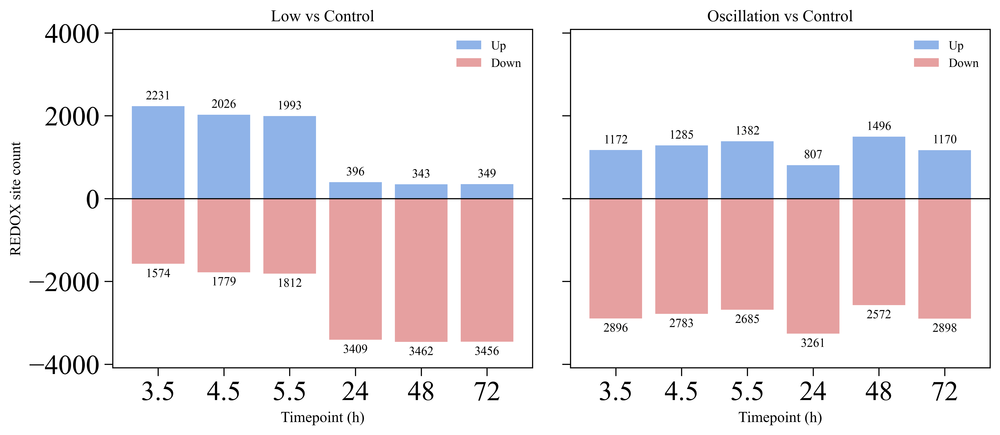

In [44]:


plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["ps.fonttype"] = 42

# =========================================
# REDOX site counts by timepoint
# NO significance filter
# =========================================

timepoints = ["3.5", "4.5", "5.5", "24", "48", "72"]

low_fc_cols = {
    "3.5": "Low_3.5/Control_3.5",
    "4.5": "Low_4.5/Control_4.5",
    "5.5": "Low_5.5/Control_5.5",
    "24":  "Low_24/Control_24",
    "48":  "Low_48/Control_48",
    "72":  "Low_72/Control_72",
}

osc_fc_cols = {
    "3.5": "Oscillation_3.5/Control_3.5",
    "4.5": "Oscillation_4.5/Control_4.5",
    "5.5": "Oscillation_5.5/Control_5.5",
    "24":  "Oscillation_24/Control_24",
    "48":  "Oscillation_48/Control_48",
    "72":  "Oscillation_72/Control_72",
}

# softer colors
up_color = "#8FB3E8"    # soft blue
down_color = "#E6A0A0"  # soft red

# -----------------------------------------
# Count up/down sites for Low
# -----------------------------------------
low_counts = []
for tp in timepoints:
    fc_col = low_fc_cols[tp]

    up_count = (redox[fc_col] > 0).sum(skipna=True)
    down_count = (redox[fc_col] < 0).sum(skipna=True)

    low_counts.append({
        "Timepoint": tp,
        "Up": up_count,
        "Down": down_count
    })

low_counts_df = pd.DataFrame(low_counts)

# -----------------------------------------
# Count up/down sites for Oscillation
# -----------------------------------------
osc_counts = []
for tp in timepoints:
    fc_col = osc_fc_cols[tp]

    up_count = (redox[fc_col] > 0).sum(skipna=True)
    down_count = (redox[fc_col] < 0).sum(skipna=True)

    osc_counts.append({
        "Timepoint": tp,
        "Up": up_count,
        "Down": down_count
    })

osc_counts_df = pd.DataFrame(osc_counts)

display(low_counts_df)
display(osc_counts_df)

# =========================================
# Plot: two diverging bar charts
# =========================================
fig, axes = plt.subplots(1, 2, figsize=(10.5, 4.8), dpi=600, sharey=True)

# shared y-limit with headroom for labels
max_count = max(
    low_counts_df[["Up", "Down"]].to_numpy().max(),
    osc_counts_df[["Up", "Down"]].to_numpy().max()
)
ylim = max_count * 1.18 + 1

# --- Low ---
ax = axes[0]
ax.bar(low_counts_df["Timepoint"], low_counts_df["Up"], color=up_color, label="Up")
ax.bar(low_counts_df["Timepoint"], -low_counts_df["Down"], color=down_color, label="Down")
ax.axhline(0, color="black", linewidth=0.8)

for i, row in low_counts_df.iterrows():
    if row["Up"] > 0:
        ax.text(
            i, row["Up"] + max_count * 0.03, str(row["Up"]),
            ha="center", va="bottom", fontsize=9
        )
    if row["Down"] > 0:
        ax.text(
            i, -row["Down"] - max_count * 0.03, str(row["Down"]),
            ha="center", va="top", fontsize=9
        )

ax.set_title("Low vs Control", fontsize=12)
ax.set_xlabel("Timepoint (h)", fontsize=11)
ax.set_ylabel("REDOX site count", fontsize=11)
ax.set_ylim(-ylim, ylim)
ax.legend(frameon=False, fontsize=9)

# --- Oscillation ---
ax = axes[1]
ax.bar(osc_counts_df["Timepoint"], osc_counts_df["Up"], color=up_color, label="Up")
ax.bar(osc_counts_df["Timepoint"], -osc_counts_df["Down"], color=down_color, label="Down")
ax.axhline(0, color="black", linewidth=0.8)

for i, row in osc_counts_df.iterrows():
    if row["Up"] > 0:
        ax.text(
            i, row["Up"] + max_count * 0.03, str(row["Up"]),
            ha="center", va="bottom", fontsize=9
        )
    if row["Down"] > 0:
        ax.text(
            i, -row["Down"] - max_count * 0.03, str(row["Down"]),
            ha="center", va="top", fontsize=9
        )

ax.set_title("Oscillation vs Control", fontsize=12)
ax.set_xlabel("Timepoint (h)", fontsize=11)
ax.set_ylim(-ylim, ylim)
ax.legend(frameon=False, fontsize=9)

plt.tight_layout()
plt.show()

,Timepoint,Up,Down
0,3.5,0,0
1,4.5,4,2
2,5.5,0,0
3,24,27,24
4,48,29,46
5,72,19,40


,Timepoint,Up,Down
0,3.5,0,0
1,4.5,2,1
2,5.5,0,0
3,24,19,16
4,48,25,27
5,72,29,26


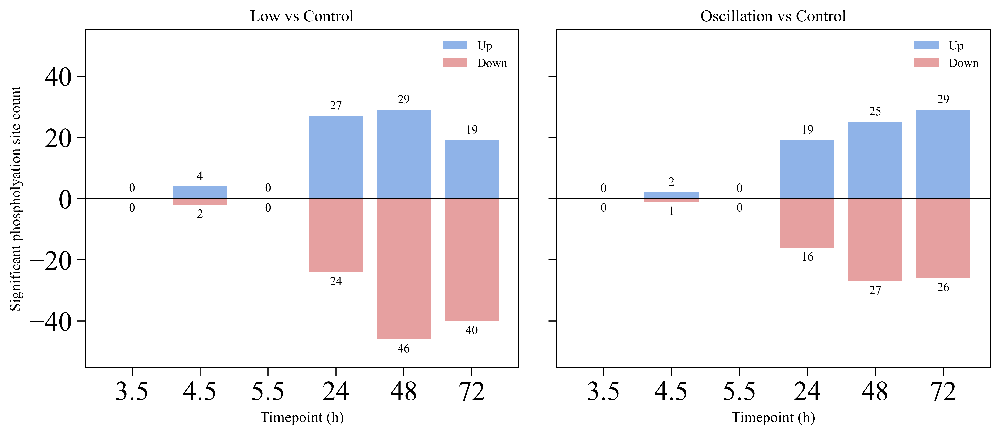

In [45]:


# plt.rcParams["font.family"] = "Times New Roman"
# plt.rcParams["pdf.fonttype"] = 42
# plt.rcParams["ps.fonttype"] = 42

# # =========================================
# # REDOX significant site counts by timepoint
# # using adj-p < 0.05, ignoring FC threshold
# # =========================================

# timepoints = ["3.5", "4.5", "5.5", "24", "48", "72"]

# low_fc_cols = {
#     "3.5": "Low_3.5/Control_3.5",
#     "4.5": "Low_4.5/Control_4.5",
#     "5.5": "Low_5.5/Control_5.5",
#     "24":  "Low_24/Control_24",
#     "48":  "Low_48/Control_48",
#     "72":  "Low_72/Control_72",
# }

# low_padj_cols = {
#     "3.5": "Low_3.5/Control_3.5_adj-p",
#     "4.5": "Low_4.5/Control_4.5_adj-p",
#     "5.5": "Low_5.5/Control_5.5_adj-p",
#     "24":  "Low_24/Control_24_adj-p",
#     "48":  "Low_48/Control_48_adj-p",
#     "72":  "Low_72/Control_72_adj-p",
# }

# osc_fc_cols = {
#     "3.5": "Oscillation_3.5/Control_3.5",
#     "4.5": "Oscillation_4.5/Control_4.5",
#     "5.5": "Oscillation_5.5/Control_5.5",
#     "24":  "Oscillation_24/Control_24",
#     "48":  "Oscillation_48/Control_48",
#     "72":  "Oscillation_72/Control_72",
# }

# osc_padj_cols = {
#     "3.5": "Oscillation_3.5/Control_3.5_adj-p",
#     "4.5": "Oscillation_4.5/Control_4.5_adj-p",
#     "5.5": "Oscillation_5.5/Control_5.5_adj-p",
#     "24":  "Oscillation_24/Control_24_adj-p",
#     "48":  "Oscillation_48/Control_48_adj-p",
#     "72":  "Oscillation_72/Control_72_adj-p",
# }

# padj_cutoff = 0.05

# # softer colors
# up_color = "#8FB3E8"    # soft blue
# down_color = "#E6A0A0"  # soft red

# # -----------------------------------------
# # Count significant up/down sites for Low
# # -----------------------------------------
# low_counts = []
# for tp in timepoints:
#     fc_col = low_fc_cols[tp]
#     padj_col = low_padj_cols[tp]

#     sig = phospho[phospho[padj_col] < padj_cutoff].copy()

#     up_count = (sig[fc_col] > 0).sum(skipna=True)
#     down_count = (sig[fc_col] < 0).sum(skipna=True)

#     low_counts.append({
#         "Timepoint": tp,
#         "Up": up_count,
#         "Down": down_count
#     })

# low_counts_df = pd.DataFrame(low_counts)

# # -----------------------------------------
# # Count significant up/down sites for Oscillation
# # -----------------------------------------
# osc_counts = []
# for tp in timepoints:
#     fc_col = osc_fc_cols[tp]
#     padj_col = osc_padj_cols[tp]

#     sig = phospho[phospho[padj_col] < padj_cutoff].copy()

#     up_count = (sig[fc_col] > 0).sum(skipna=True)
#     down_count = (sig[fc_col] < 0).sum(skipna=True)

#     osc_counts.append({
#         "Timepoint": tp,
#         "Up": up_count,
#         "Down": down_count
#     })

# osc_counts_df = pd.DataFrame(osc_counts)

# display(low_counts_df)
# display(osc_counts_df)

# # =========================================
# # Plot: two diverging bar charts
# # =========================================
# fig, axes = plt.subplots(1, 2, figsize=(10.5, 4.8), dpi=600, sharey=True)

# # set shared y limit with some headroom for labels
# max_count = max(low_counts_df[["Up", "Down"]].to_numpy().max(),
#                 osc_counts_df[["Up", "Down"]].to_numpy().max())
# ylim = max_count * 1.18 + 1

# # --- Low ---
# ax = axes[0]
# ax.bar(low_counts_df["Timepoint"], low_counts_df["Up"], color=up_color, label="Up")
# ax.bar(low_counts_df["Timepoint"], -low_counts_df["Down"], color=down_color, label="Down")
# ax.axhline(0, color="black", linewidth=0.8)

# for i, row in low_counts_df.iterrows():
#     ax.text(i, row["Up"] + max_count * 0.03, str(row["Up"]),
#             ha="center", va="bottom", fontsize=9)
#     ax.text(i, -row["Down"] - max_count * 0.03, str(row["Down"]),
#             ha="center", va="top", fontsize=9)

# ax.set_title("Low vs Control", fontsize=12)
# ax.set_xlabel("Timepoint (h)", fontsize=11)
# ax.set_ylabel("Significant phospholyation site count", fontsize=11)
# ax.set_ylim(-ylim, ylim)
# ax.legend(frameon=False, fontsize=9)

# # --- Oscillation ---
# ax = axes[1]
# ax.bar(osc_counts_df["Timepoint"], osc_counts_df["Up"], color=up_color, label="Up")
# ax.bar(osc_counts_df["Timepoint"], -osc_counts_df["Down"], color=down_color, label="Down")
# ax.axhline(0, color="black", linewidth=0.8)

# for i, row in osc_counts_df.iterrows():
#     ax.text(i, row["Up"] + max_count * 0.03, str(row["Up"]),
#             ha="center", va="bottom", fontsize=9)
#     ax.text(i, -row["Down"] - max_count * 0.03, str(row["Down"]),
#             ha="center", va="top", fontsize=9)

# ax.set_title("Oscillation vs Control", fontsize=12)
# ax.set_xlabel("Timepoint (h)", fontsize=11)
# ax.set_ylim(-ylim, ylim)
# ax.legend(frameon=False, fontsize=9)

# plt.tight_layout()
# # Add near the top with your other rcParams
# plt.rcParams["svg.fonttype"] = "none"     # editable text in SVG
# plt.rcParams["axes.linewidth"] = 0.8       # consistent axis weight
# plt.rcParams["xtick.major.width"] = 0.8
# plt.rcParams["ytick.major.width"] = 0.8
# plt.savefig("phos_significant_sites_diverging.tif",
#             dpi=600, bbox_inches="tight", facecolor="white",
#             pil_kwargs={"compression": "tiff_lzw"})
# plt.show()

Low vs Control


,Timepoint,Up,Down
0,3.5,0,0
1,4.5,4,2
2,5.5,0,0
3,24,27,24
4,48,29,46
5,72,19,40


Oscillation vs Control


,Timepoint,Up,Down
0,3.5,0,0
1,4.5,2,1
2,5.5,0,0
3,24,19,16
4,48,25,27
5,72,29,26


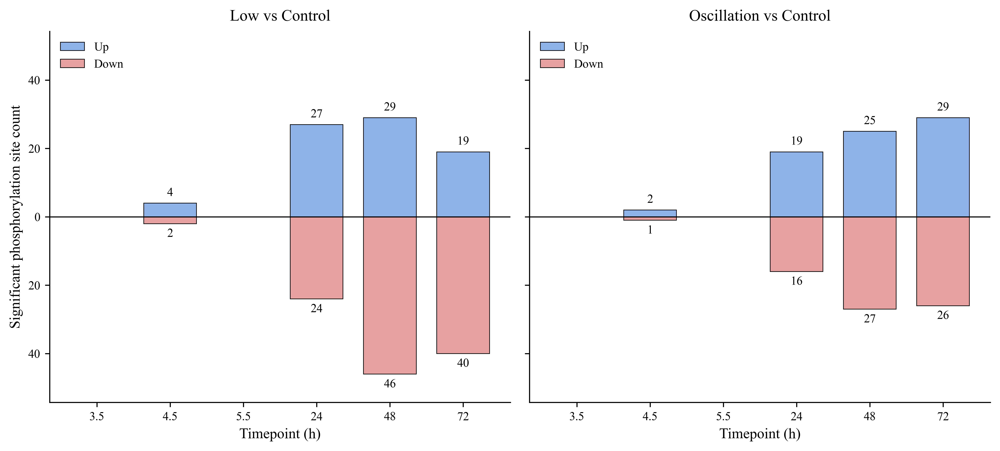

In [76]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Assumes the phosphoproteomics DataFrame is already loaded as:
# phospho = pd.read_csv("your_phosphoproteomics_file.csv")

# =========================================
# Publication-quality plotting parameters
# =========================================
plt.rcParams.update({
    "font.family": "Times New Roman",
    "font.size": 10,
    "pdf.fonttype": 42,       # Editable TrueType text in PDF
    "ps.fonttype": 42,
    "svg.fonttype": "none",   # Editable text in SVG
    "axes.linewidth": 0.8,
    "xtick.major.width": 0.8,
    "ytick.major.width": 0.8,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "savefig.dpi": 600,
})

# =========================================
# Phosphorylation-site counts by timepoint
# Significance: adjusted p-value < 0.05
# No fold-change magnitude threshold
# =========================================
timepoints = ["3.5", "4.5", "5.5", "24", "48", "72"]

low_fc_cols = {
    "3.5": "Low_3.5/Control_3.5",
    "4.5": "Low_4.5/Control_4.5",
    "5.5": "Low_5.5/Control_5.5",
    "24": "Low_24/Control_24",
    "48": "Low_48/Control_48",
    "72": "Low_72/Control_72",
}

low_padj_cols = {
    "3.5": "Low_3.5/Control_3.5_adj-p",
    "4.5": "Low_4.5/Control_4.5_adj-p",
    "5.5": "Low_5.5/Control_5.5_adj-p",
    "24": "Low_24/Control_24_adj-p",
    "48": "Low_48/Control_48_adj-p",
    "72": "Low_72/Control_72_adj-p",
}

osc_fc_cols = {
    "3.5": "Oscillation_3.5/Control_3.5",
    "4.5": "Oscillation_4.5/Control_4.5",
    "5.5": "Oscillation_5.5/Control_5.5",
    "24": "Oscillation_24/Control_24",
    "48": "Oscillation_48/Control_48",
    "72": "Oscillation_72/Control_72",
}

osc_padj_cols = {
    "3.5": "Oscillation_3.5/Control_3.5_adj-p",
    "4.5": "Oscillation_4.5/Control_4.5_adj-p",
    "5.5": "Oscillation_5.5/Control_5.5_adj-p",
    "24": "Oscillation_24/Control_24_adj-p",
    "48": "Oscillation_48/Control_48_adj-p",
    "72": "Oscillation_72/Control_72_adj-p",
}

padj_cutoff = 0.05

# Soft publication colors
up_color = "#8FB3E8"
down_color = "#E6A0A0"

# =========================================
# Validate required columns
# =========================================
required_cols = (
    list(low_fc_cols.values())
    + list(low_padj_cols.values())
    + list(osc_fc_cols.values())
    + list(osc_padj_cols.values())
)

missing_cols = [col for col in required_cols if col not in phospho.columns]

if missing_cols:
    raise KeyError(
        "The following required columns are missing from phospho:\n"
        + "\n".join(missing_cols)
    )

# Convert required columns to numeric.
# Non-numeric values are converted to NaN and excluded.
phospho_plot = phospho.copy()

for col in required_cols:
    phospho_plot[col] = pd.to_numeric(
        phospho_plot[col],
        errors="coerce"
    )

# =========================================
# Function to count significant sites
# =========================================
def count_significant_sites(data, fc_columns, padj_columns, cutoff=0.05):
    """
    Count significantly increased and decreased phosphorylation
    sites at each timepoint.

    Positive fold change = Up
    Negative fold change = Down
    Zero or missing fold change is not counted.
    """
    counts = []

    for tp in timepoints:
        fc_col = fc_columns[tp]
        padj_col = padj_columns[tp]

        significant = data.loc[
            data[padj_col].notna()
            & data[fc_col].notna()
            & (data[padj_col] < cutoff),
            fc_col
        ]

        counts.append({
            "Timepoint": tp,
            "Up": int((significant > 0).sum()),
            "Down": int((significant < 0).sum()),
        })

    return pd.DataFrame(counts)


# =========================================
# Calculate counts
# =========================================
low_counts_df = count_significant_sites(
    data=phospho_plot,
    fc_columns=low_fc_cols,
    padj_columns=low_padj_cols,
    cutoff=padj_cutoff,
)

osc_counts_df = count_significant_sites(
    data=phospho_plot,
    fc_columns=osc_fc_cols,
    padj_columns=osc_padj_cols,
    cutoff=padj_cutoff,
)

print("Low vs Control")
display(low_counts_df)

print("Oscillation vs Control")
display(osc_counts_df)

# =========================================
# Set common symmetrical y-axis limits
# =========================================
max_count = max(
    low_counts_df[["Up", "Down"]].to_numpy().max(),
    osc_counts_df[["Up", "Down"]].to_numpy().max(),
)

# Avoid a zero-height axis if no sites pass the cutoff
if max_count == 0:
    max_count = 1

ylim = max_count * 1.18

# Label offset above and below bars
label_offset = max_count * 0.03

# Display negative-axis ticks as positive counts
absolute_tick_formatter = FuncFormatter(
    lambda value, position: f"{abs(int(value))}"
)

# =========================================
# Plot two diverging bar charts
# =========================================
fig, axes = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(10.5, 4.8),
    dpi=600,
    sharey=True,
)

x_positions = np.arange(len(timepoints))
bar_width = 0.72

# -----------------------------------------
# Panel 1: Low vs Control
# -----------------------------------------
ax = axes[0]

ax.bar(
    x_positions,
    low_counts_df["Up"],
    width=bar_width,
    color=up_color,
    edgecolor="black",
    linewidth=0.5,
    label="Up",
    zorder=3,
)

ax.bar(
    x_positions,
    -low_counts_df["Down"],
    width=bar_width,
    color=down_color,
    edgecolor="black",
    linewidth=0.5,
    label="Down",
    zorder=3,
)

ax.axhline(
    y=0,
    color="black",
    linewidth=0.8,
    zorder=4,
)

for x, row in zip(x_positions, low_counts_df.itertuples(index=False)):
    if row.Up > 0:
        ax.text(
            x,
            row.Up + label_offset,
            str(row.Up),
            ha="center",
            va="bottom",
            fontsize=9,
        )

    if row.Down > 0:
        ax.text(
            x,
            -row.Down - label_offset,
            str(row.Down),
            ha="center",
            va="top",
            fontsize=9,
        )

ax.set_title(
    "Low vs Control",
    fontsize=12,
    pad=8,
)

ax.set_xlabel(
    "Timepoint (h)",
    fontsize=11,
)

ax.set_ylabel(
    "Significant phosphorylation site count",
    fontsize=11,
)

ax.set_xticks(x_positions)
ax.set_xticklabels(timepoints)
ax.set_ylim(-ylim, ylim)
ax.yaxis.set_major_formatter(absolute_tick_formatter)

ax.legend(
    frameon=False,
    fontsize=9,
    loc="upper left",
)

# -----------------------------------------
# Panel 2: Oscillation vs Control
# -----------------------------------------
ax = axes[1]

ax.bar(
    x_positions,
    osc_counts_df["Up"],
    width=bar_width,
    color=up_color,
    edgecolor="black",
    linewidth=0.5,
    label="Up",
    zorder=3,
)

ax.bar(
    x_positions,
    -osc_counts_df["Down"],
    width=bar_width,
    color=down_color,
    edgecolor="black",
    linewidth=0.5,
    label="Down",
    zorder=3,
)

ax.axhline(
    y=0,
    color="black",
    linewidth=0.8,
    zorder=4,
)

for x, row in zip(x_positions, osc_counts_df.itertuples(index=False)):
    if row.Up > 0:
        ax.text(
            x,
            row.Up + label_offset,
            str(row.Up),
            ha="center",
            va="bottom",
            fontsize=9,
        )

    if row.Down > 0:
        ax.text(
            x,
            -row.Down - label_offset,
            str(row.Down),
            ha="center",
            va="top",
            fontsize=9,
        )

ax.set_title(
    "Oscillation vs Control",
    fontsize=12,
    pad=8,
)

ax.set_xlabel(
    "Timepoint (h)",
    fontsize=11,
)

ax.set_xticks(x_positions)
ax.set_xticklabels(timepoints)
ax.set_ylim(-ylim, ylim)
ax.yaxis.set_major_formatter(absolute_tick_formatter)

ax.legend(
    frameon=False,
    fontsize=9,
    loc="upper left",
)

# =========================================
# Final formatting
# =========================================
for ax in axes:
    ax.tick_params(
        axis="both",
        which="major",
        labelsize=9,
        length=3.5,
    )

    # Remove upper and right borders
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # Keep gridlines behind the bars
    ax.set_axisbelow(True)

fig.tight_layout()

# =========================================
# Save publication-quality files
# =========================================
output_stem = "phospho_significant_sites_diverging"

# Vector PDF: preferred for manuscript assembly
fig.savefig(
    f"{output_stem}.pdf",
    format="pdf",
    bbox_inches="tight",
    facecolor="white",
)

# Vector SVG: useful for editing in Illustrator or Inkscape
fig.savefig(
    f"{output_stem}.svg",
    format="svg",
    bbox_inches="tight",
    facecolor="white",
)

# 600-dpi TIFF with lossless LZW compression
fig.savefig(
    f"{output_stem}.tif",
    format="tiff",
    dpi=600,
    bbox_inches="tight",
    facecolor="white",
    pil_kwargs={"compression": "tiff_lzw"},
)

# 600-dpi PNG for previews and presentations
fig.savefig(
    f"{output_stem}.png",
    format="png",
    dpi=600,
    bbox_inches="tight",
    facecolor="white",
)

plt.show()

Redox: Low vs Control


,Timepoint,Up,Down
0,3.5,0,0
1,4.5,1,0
2,5.5,0,0
3,24,105,2472
4,48,115,2814
5,72,132,2949


Redox: Oscillation vs Control


,Timepoint,Up,Down
0,3.5,0,0
1,4.5,0,0
2,5.5,1,0
3,24,94,948
4,48,233,354
5,72,209,408


Phosphorylation: Low vs Control


,Timepoint,Up,Down
0,3.5,0,0
1,4.5,4,2
2,5.5,0,0
3,24,27,24
4,48,29,46
5,72,19,40


Phosphorylation: Oscillation vs Control


,Timepoint,Up,Down
0,3.5,0,0
1,4.5,2,1
2,5.5,0,0
3,24,19,16
4,48,25,27
5,72,29,26


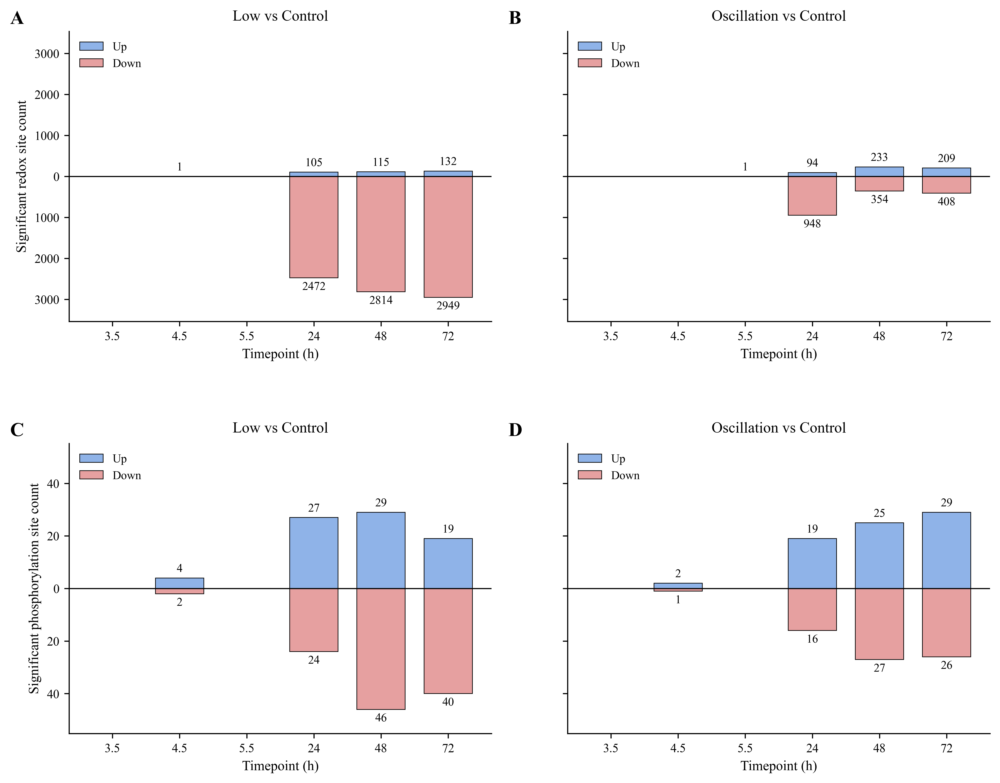

In [79]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Assumes these DataFrames are already loaded:
# redox   = pd.read_csv("your_redox_file.csv")
# phospho = pd.read_csv("your_phosphoproteomics_file.csv")

# =========================================
# Publication-quality plotting parameters
# =========================================
plt.rcParams.update({
    "font.family": "Times New Roman",
    "font.size": 10,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "svg.fonttype": "none",
    "axes.linewidth": 0.8,
    "xtick.major.width": 0.8,
    "ytick.major.width": 0.8,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "savefig.dpi": 600,
})

# =========================================
# Analysis settings
# =========================================
timepoints = ["3.5", "4.5", "5.5", "24", "48", "72"]
padj_cutoff = 0.05

# Soft publication colors
up_color = "#8FB3E8"
down_color = "#E6A0A0"

low_fc_cols = {
    "3.5": "Low_3.5/Control_3.5",
    "4.5": "Low_4.5/Control_4.5",
    "5.5": "Low_5.5/Control_5.5",
    "24": "Low_24/Control_24",
    "48": "Low_48/Control_48",
    "72": "Low_72/Control_72",
}

low_padj_cols = {
    "3.5": "Low_3.5/Control_3.5_adj-p",
    "4.5": "Low_4.5/Control_4.5_adj-p",
    "5.5": "Low_5.5/Control_5.5_adj-p",
    "24": "Low_24/Control_24_adj-p",
    "48": "Low_48/Control_48_adj-p",
    "72": "Low_72/Control_72_adj-p",
}

osc_fc_cols = {
    "3.5": "Oscillation_3.5/Control_3.5",
    "4.5": "Oscillation_4.5/Control_4.5",
    "5.5": "Oscillation_5.5/Control_5.5",
    "24": "Oscillation_24/Control_24",
    "48": "Oscillation_48/Control_48",
    "72": "Oscillation_72/Control_72",
}

osc_padj_cols = {
    "3.5": "Oscillation_3.5/Control_3.5_adj-p",
    "4.5": "Oscillation_4.5/Control_4.5_adj-p",
    "5.5": "Oscillation_5.5/Control_5.5_adj-p",
    "24": "Oscillation_24/Control_24_adj-p",
    "48": "Oscillation_48/Control_48_adj-p",
    "72": "Oscillation_72/Control_72_adj-p",
}

required_cols = (
    list(low_fc_cols.values())
    + list(low_padj_cols.values())
    + list(osc_fc_cols.values())
    + list(osc_padj_cols.values())
)

# =========================================
# Validate and prepare a DataFrame
# =========================================
def prepare_dataframe(data, dataframe_name):
    """
    Check that required columns exist and convert them to numeric.
    Non-numeric values are converted to NaN.
    """
    missing_cols = [
        col for col in required_cols
        if col not in data.columns
    ]

    if missing_cols:
        raise KeyError(
            f"The following required columns are missing "
            f"from {dataframe_name}:\n"
            + "\n".join(missing_cols)
        )

    prepared_data = data.copy()

    for col in required_cols:
        prepared_data[col] = pd.to_numeric(
            prepared_data[col],
            errors="coerce"
        )

    return prepared_data


redox_plot = prepare_dataframe(redox, "redox")
phospho_plot = prepare_dataframe(phospho, "phospho")

# =========================================
# Count significant sites
# =========================================
def count_significant_sites(
    data,
    fc_columns,
    padj_columns,
    cutoff=0.05
):
    """
    Count significant sites based on adjusted p-value.

    Positive fold change = Up
    Negative fold change = Down
    Zero or missing fold change is not counted.
    """
    counts = []

    for tp in timepoints:
        fc_col = fc_columns[tp]
        padj_col = padj_columns[tp]

        significant_fc = data.loc[
            data[padj_col].notna()
            & data[fc_col].notna()
            & (data[padj_col] < cutoff),
            fc_col
        ]

        counts.append({
            "Timepoint": tp,
            "Up": int((significant_fc > 0).sum()),
            "Down": int((significant_fc < 0).sum()),
        })

    return pd.DataFrame(counts)


# =========================================
# Calculate redox counts
# =========================================
redox_low_counts = count_significant_sites(
    data=redox_plot,
    fc_columns=low_fc_cols,
    padj_columns=low_padj_cols,
    cutoff=padj_cutoff,
)

redox_osc_counts = count_significant_sites(
    data=redox_plot,
    fc_columns=osc_fc_cols,
    padj_columns=osc_padj_cols,
    cutoff=padj_cutoff,
)

# =========================================
# Calculate phosphorylation counts
# =========================================
phospho_low_counts = count_significant_sites(
    data=phospho_plot,
    fc_columns=low_fc_cols,
    padj_columns=low_padj_cols,
    cutoff=padj_cutoff,
)

phospho_osc_counts = count_significant_sites(
    data=phospho_plot,
    fc_columns=osc_fc_cols,
    padj_columns=osc_padj_cols,
    cutoff=padj_cutoff,
)

# =========================================
# Display count tables
# =========================================
print("Redox: Low vs Control")
display(redox_low_counts)

print("Redox: Oscillation vs Control")
display(redox_osc_counts)

print("Phosphorylation: Low vs Control")
display(phospho_low_counts)

print("Phosphorylation: Oscillation vs Control")
display(phospho_osc_counts)

# =========================================
# Determine separate redox and phospho limits
# =========================================
redox_max = max(
    redox_low_counts[["Up", "Down"]].to_numpy().max(),
    redox_osc_counts[["Up", "Down"]].to_numpy().max(),
)

phospho_max = max(
    phospho_low_counts[["Up", "Down"]].to_numpy().max(),
    phospho_osc_counts[["Up", "Down"]].to_numpy().max(),
)

# Prevent zero-height axes
redox_max = max(redox_max, 1)
phospho_max = max(phospho_max, 1)

redox_ylim = redox_max * 1.20
phospho_ylim = phospho_max * 1.20

redox_label_offset = redox_max * 0.03
phospho_label_offset = phospho_max * 0.03

# Show negative-axis tick labels as absolute counts
absolute_tick_formatter = FuncFormatter(
    lambda value, position: f"{abs(int(value))}"
)

# =========================================
# Reusable plotting function
# =========================================
def plot_diverging_counts(
    ax,
    counts_df,
    panel_letter,
    title,
    y_limit,
    label_offset,
    ylabel=None,
    show_legend=True
):
    x_positions = np.arange(len(timepoints))
    bar_width = 0.72

    ax.bar(
        x_positions,
        counts_df["Up"],
        width=bar_width,
        color=up_color,
        edgecolor="black",
        linewidth=0.5,
        label="Up",
        zorder=3,
    )

    ax.bar(
        x_positions,
        -counts_df["Down"],
        width=bar_width,
        color=down_color,
        edgecolor="black",
        linewidth=0.5,
        label="Down",
        zorder=3,
    )

    ax.axhline(
        y=0,
        color="black",
        linewidth=0.8,
        zorder=4,
    )

    # Add counts above and below bars
    for x, row in zip(
        x_positions,
        counts_df.itertuples(index=False)
    ):
        if row.Up > 0:
            ax.text(
                x,
                row.Up + label_offset,
                str(row.Up),
                ha="center",
                va="bottom",
                fontsize=8.5,
            )

        if row.Down > 0:
            ax.text(
                x,
                -row.Down - label_offset,
                str(row.Down),
                ha="center",
                va="top",
                fontsize=8.5,
            )

    ax.set_title(
        title,
        fontsize=11,
        pad=8,
    )

    ax.set_xlabel(
        "Timepoint (h)",
        fontsize=10,
    )

    if ylabel is not None:
        ax.set_ylabel(
            ylabel,
            fontsize=10,
        )

    ax.set_xticks(x_positions)
    ax.set_xticklabels(timepoints)
    ax.set_ylim(-y_limit, y_limit)
    ax.yaxis.set_major_formatter(absolute_tick_formatter)

    ax.tick_params(
        axis="both",
        which="major",
        labelsize=9,
        length=3.5,
    )

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.set_axisbelow(True)

    if show_legend:
        ax.legend(
            frameon=False,
            fontsize=8.5,
            loc="upper left",
        )

    # Panel label
    ax.text(
        -0.14,
        1.07,
        panel_letter,
        transform=ax.transAxes,
        fontsize=14,
        fontweight="bold",
        ha="left",
        va="top",
        clip_on=False,
    )


# =========================================
# Create four-panel figure
# =========================================
fig, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(10.5, 8.2),
    dpi=600,
    sharey="row",
)

# A: Redox, Low vs Control
plot_diverging_counts(
    ax=axes[0, 0],
    counts_df=redox_low_counts,
    panel_letter="A",
    title="Low vs Control",
    y_limit=redox_ylim,
    label_offset=redox_label_offset,
    ylabel="Significant redox site count",
    show_legend=True,
)

# B: Redox, Oscillation vs Control
plot_diverging_counts(
    ax=axes[0, 1],
    counts_df=redox_osc_counts,
    panel_letter="B",
    title="Oscillation vs Control",
    y_limit=redox_ylim,
    label_offset=redox_label_offset,
    ylabel=None,
    show_legend=True,
)

# C: Phosphorylation, Low vs Control
plot_diverging_counts(
    ax=axes[1, 0],
    counts_df=phospho_low_counts,
    panel_letter="C",
    title="Low vs Control",
    y_limit=phospho_ylim,
    label_offset=phospho_label_offset,
    ylabel="Significant phosphorylation site count",
    show_legend=True,
)

# D: Phosphorylation, Oscillation vs Control
plot_diverging_counts(
    ax=axes[1, 1],
    counts_df=phospho_osc_counts,
    panel_letter="D",
    title="Oscillation vs Control",
    y_limit=phospho_ylim,
    label_offset=phospho_label_offset,
    ylabel=None,
    show_legend=True,
)

# Optional row labels to make the omics type immediately clear
# fig.text(
#     0.5,
#     0.985,
#     "Redox proteomics",
#     ha="center",
#     va="top",
#     fontsize=13,
#     fontweight="bold",
# )

# fig.text(
#     0.5,
#     0.495,
#     "Phosphoproteomics",
#     ha="center",
#     va="top",
#     fontsize=13,
#     fontweight="bold",
# )

fig.subplots_adjust(
    left=0.10,
    right=0.98,
    bottom=0.08,
    top=0.94,
    wspace=0.18,
    hspace=0.42,
)

# =========================================
# Save publication-quality outputs
# =========================================
output_stem = "redox_phospho_significant_sites_four_panel"

# Vector PDF
fig.savefig(
    f"{output_stem}.pdf",
    format="pdf",
    bbox_inches="tight",
    facecolor="white",
)

# Editable vector SVG
fig.savefig(
    f"{output_stem}.svg",
    format="svg",
    bbox_inches="tight",
    facecolor="white",
)

# 600-dpi TIFF with lossless LZW compression
fig.savefig(
    f"{output_stem}.tif",
    format="tiff",
    dpi=600,
    bbox_inches="tight",
    facecolor="white",
    pil_kwargs={"compression": "tiff_lzw"},
)

# 600-dpi PNG
fig.savefig(
    f"{output_stem}.png",
    format="png",
    dpi=600,
    bbox_inches="tight",
    facecolor="white",
)

plt.show()

In [46]:
ANNOTATION_INCLUDE

['kogClass',
 'pathway_class',
 'pathway',
 'pathway_type',
 'goName',
 'kogdefline',
 'definition']

OSC tested rows: 2639
OSC significant rows: 1041
OSC up rows: 523
OSC down rows: 518
\n===== kogClass =====


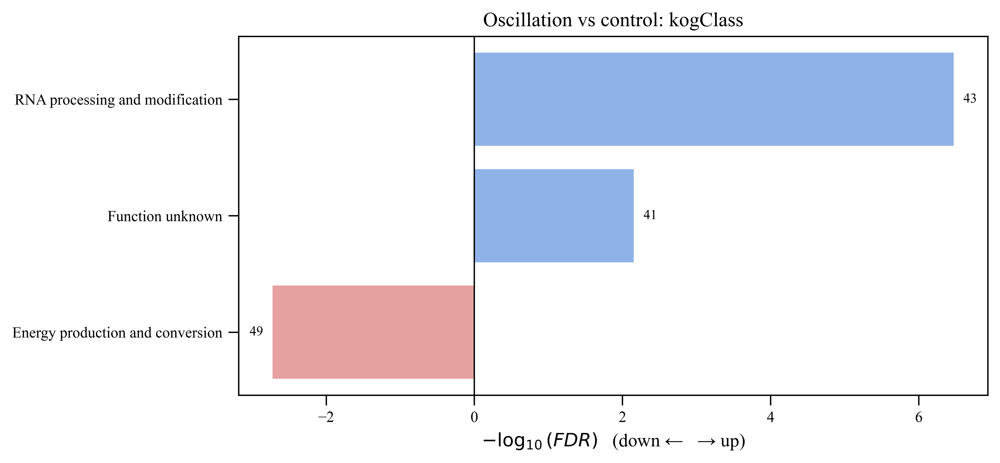

\n===== pathway_class =====


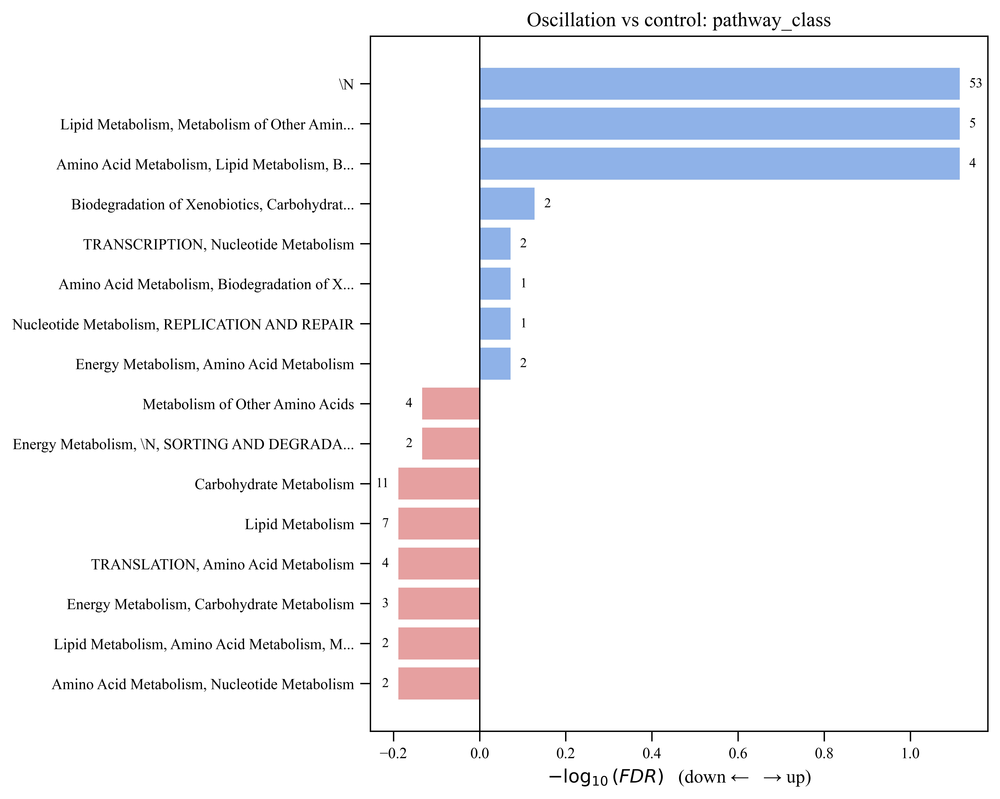

\n===== pathway =====


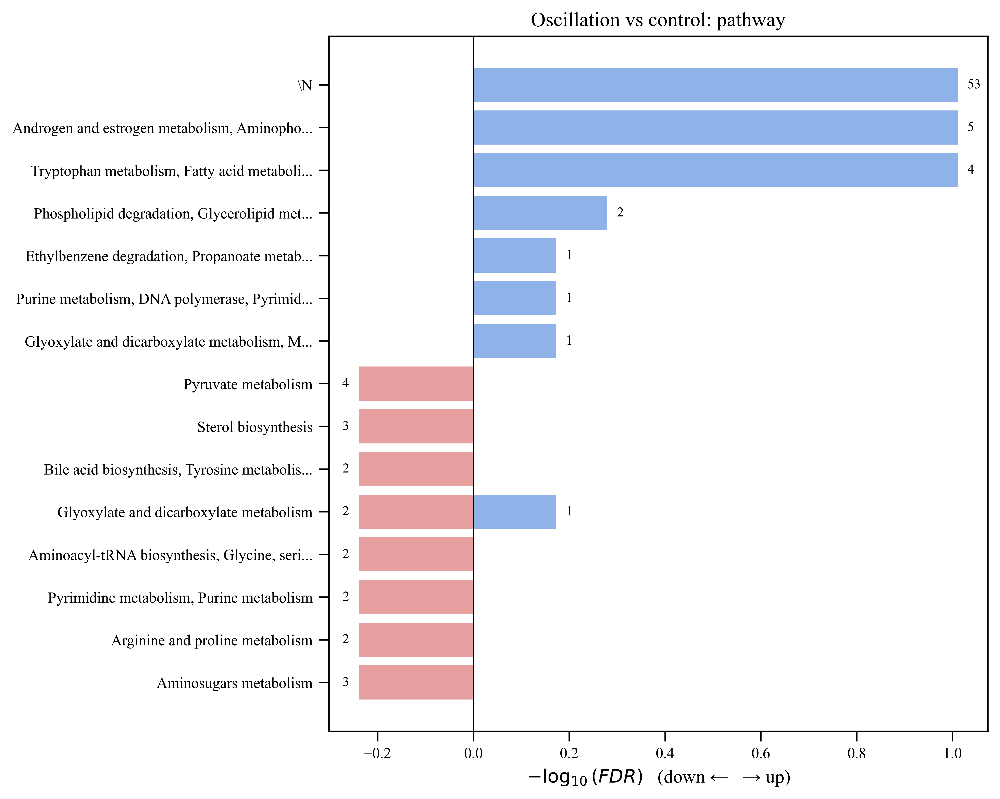

\n===== kogdefline =====


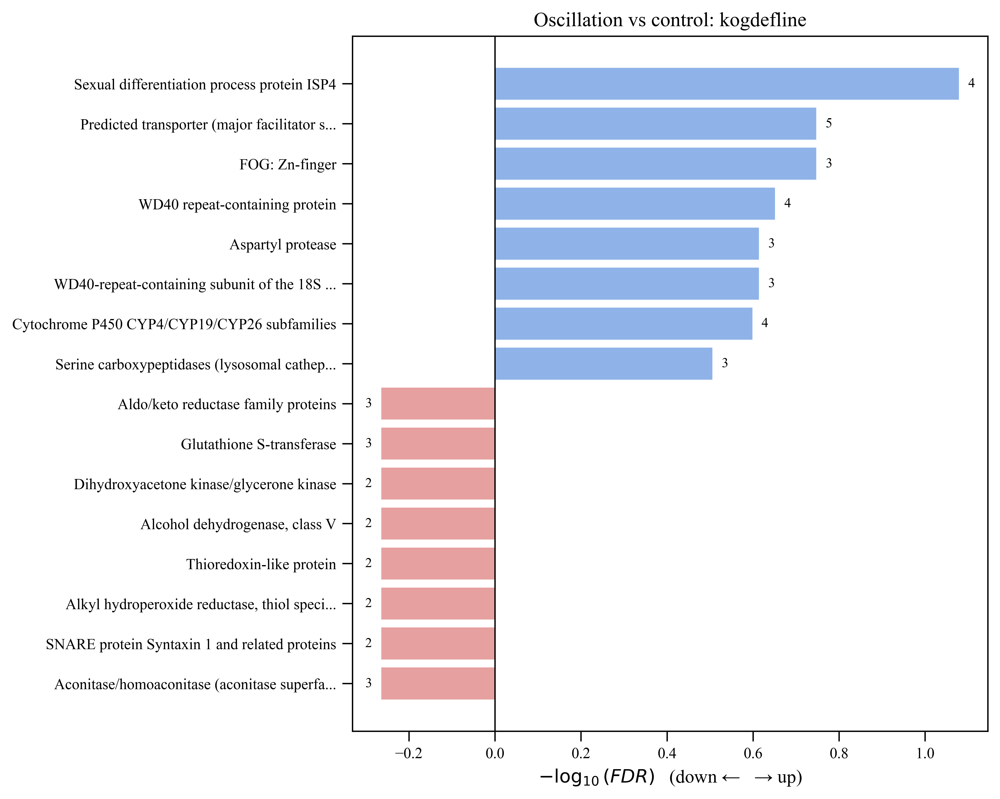

\n===== definition =====


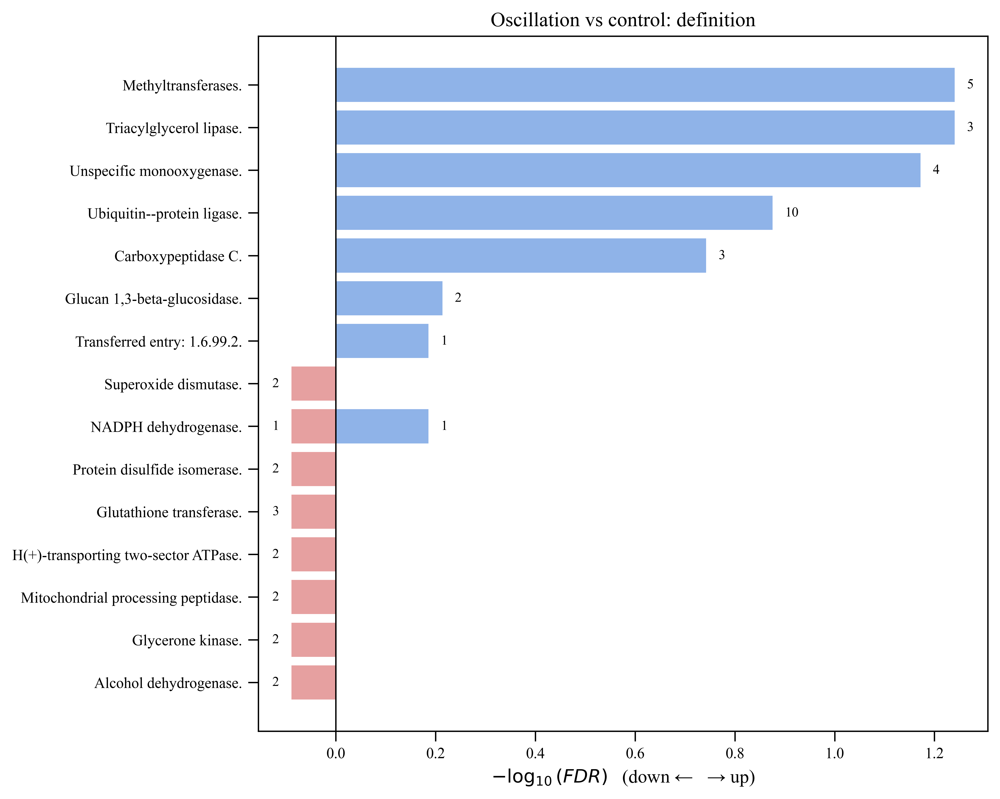

In [47]:
# =========================================
# OSCILLATION-ONLY ENRICHMENT:
# combined up/down bar charts
# cycles through ANNOTATION_INCLUDE
# =========================================


plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["ps.fonttype"] = 42

# -----------------------------
# USER SETTINGS
# -----------------------------
OSC_ONLY_FC_COL   = "osc/low_late_cominbed"
OSC_ONLY_PADJ_COL = "osc/low_late_cominbedANOVA_padj"

ANNOTATION_INCLUDE = [
    "kogClass",
    "pathway_class",
    "pathway",
    "kogdefline",
    "definition",
]

PADJ_CUTOFF = 0.05
MIN_TERM_SIZE = 3
TOP_N_UP = 8
TOP_N_DOWN = 8
LOG2FC_THRESHOLD = np.log2(1.3)   # set to 0 if you want padj-only

# softer colors
UP_COLOR = "#8FB3E8"     # soft blue
DOWN_COLOR = "#E6A0A0"   # soft red

# optional save
SAVE_OSC_ONLY_COMBINED = False
OSC_ONLY_OUTDIR = "osc_only_combined_enrichment"
os.makedirs(OSC_ONLY_OUTDIR, exist_ok=True)

# -----------------------------
# 1) Build oscillation-only sets
# -----------------------------
osc_tested_only = prot[
    prot[OSC_ONLY_FC_COL].notna() & prot[OSC_ONLY_PADJ_COL].notna()
].copy()

osc_sig_only = osc_tested_only[
    (osc_tested_only[OSC_ONLY_PADJ_COL] < PADJ_CUTOFF) &
    (osc_tested_only[OSC_ONLY_FC_COL].abs() > LOG2FC_THRESHOLD)
].copy()

osc_up_only = osc_sig_only[osc_sig_only[OSC_ONLY_FC_COL] > 0].copy()
osc_down_only = osc_sig_only[osc_sig_only[OSC_ONLY_FC_COL] < 0].copy()

print("OSC tested rows:", len(osc_tested_only))
print("OSC significant rows:", len(osc_sig_only))
print("OSC up rows:", len(osc_up_only))
print("OSC down rows:", len(osc_down_only))

# -----------------------------
# 2) Plot helper
# -----------------------------
def plot_combined_up_down_enrichment(
    bg_df,
    up_df,
    down_df,
    ann_col,
    protein_col=PROTEIN_COL,
    min_term_size=3,
    top_n_up=8,
    top_n_down=8,
    padj_cutoff=0.05,
    max_term_len=45,
    title_prefix="Oscillation vs control"
):
    # collapse to one row per protein for enrichment
    bg_annot = collapse_to_protein_annotations(bg_df, protein_col, [ann_col])
    up_annot = collapse_to_protein_annotations(up_df, protein_col, [ann_col])
    down_annot = collapse_to_protein_annotations(down_df, protein_col, [ann_col])

    # run enrichment
    up_enrich = enrich_section(bg_annot, up_annot, protein_col, ann_col, min_term_size=min_term_size)
    down_enrich = enrich_section(bg_annot, down_annot, protein_col, ann_col, min_term_size=min_term_size)

    # keep significant if available, otherwise fall back to best terms
    if up_enrich is None or up_enrich.empty:
        up_plot = pd.DataFrame()
    else:
        up_plot = up_enrich[up_enrich["padj"] < padj_cutoff].copy()
        if up_plot.empty:
            up_plot = up_enrich.copy()
        up_plot = up_plot.sort_values(["neglog10_padj", "fold_enrichment"], ascending=[False, False]).head(top_n_up).copy()

    if down_enrich is None or down_enrich.empty:
        down_plot = pd.DataFrame()
    else:
        down_plot = down_enrich[down_enrich["padj"] < padj_cutoff].copy()
        if down_plot.empty:
            down_plot = down_enrich.copy()
        down_plot = down_plot.sort_values(["neglog10_padj", "fold_enrichment"], ascending=[False, False]).head(top_n_down).copy()

    if up_plot.empty and down_plot.empty:
        print(f"No enrichment terms found for {ann_col}")
        return None, up_enrich, down_enrich

    # format terms
    if not up_plot.empty:
        up_plot["term_short"] = up_plot["term"].astype(str).apply(
            lambda x: x if len(x) <= max_term_len else x[:max_term_len - 3] + "..."
        )
        up_plot["plot_value"] = up_plot["neglog10_padj"]

    if not down_plot.empty:
        down_plot["term_short"] = down_plot["term"].astype(str).apply(
            lambda x: x if len(x) <= max_term_len else x[:max_term_len - 3] + "..."
        )
        down_plot["plot_value"] = -down_plot["neglog10_padj"]

    # order: down on bottom half, up on top half
    down_plot = down_plot.sort_values("plot_value", ascending=True) if not down_plot.empty else down_plot
    up_plot = up_plot.sort_values("plot_value", ascending=True) if not up_plot.empty else up_plot

    combined = pd.concat([down_plot, up_plot], ignore_index=True)

    fig, ax = plt.subplots(figsize=(8.6, max(4.2, 0.36 * len(combined) + 1.2)), dpi=600)

    colors = [DOWN_COLOR if v < 0 else UP_COLOR for v in combined["plot_value"]]
    bars = ax.barh(combined["term_short"], combined["plot_value"], color=colors)

    ax.axvline(0, color="black", linewidth=0.8)
    ax.set_xlabel(r"$-\log_{10}(FDR)$   (down ←   → up)", fontsize=11)
    ax.set_title(f"{title_prefix}: {ann_col}", fontsize=12)
    ax.tick_params(axis="y", labelsize=9)
    ax.tick_params(axis="x", labelsize=9)

    # labels = hit counts
    xspan = max(abs(combined["plot_value"]).max(), 1)
    offset = xspan * 0.02

    for bar, count, val in zip(bars, combined["hit_with_term"], combined["plot_value"]):
        if val >= 0:
            ax.text(
                val + offset,
                bar.get_y() + bar.get_height()/2,
                str(int(count)),
                va="center",
                ha="left",
                fontsize=8
            )
        else:
            ax.text(
                val - offset,
                bar.get_y() + bar.get_height()/2,
                str(int(count)),
                va="center",
                ha="right",
                fontsize=8
            )

    plt.tight_layout()
    plt.show()

    return combined, up_enrich, down_enrich

# -----------------------------
# 3) Cycle through annotation columns
# -----------------------------
osc_only_combined_results = {}

for ann_col in ANNOTATION_INCLUDE:
    if ann_col not in prot.columns:
        print(f"Skipping {ann_col}: not found in prot columns")
        continue

    print(f"\\n===== {ann_col} =====")

    combined_df, up_enrich_df, down_enrich_df = plot_combined_up_down_enrichment(
        bg_df=osc_tested_only,
        up_df=osc_up_only,
        down_df=osc_down_only,
        ann_col=ann_col,
        protein_col=PROTEIN_COL,
        min_term_size=MIN_TERM_SIZE,
        top_n_up=TOP_N_UP,
        top_n_down=TOP_N_DOWN,
        padj_cutoff=PADJ_CUTOFF,
        title_prefix="Oscillation vs control"
    )

    osc_only_combined_results[ann_col] = {
        "combined_plot_df": combined_df,
        "up_enrichment": up_enrich_df,
        "down_enrichment": down_enrich_df,
    }

    if SAVE_OSC_ONLY_COMBINED and combined_df is not None:
        safe = ann_col.replace("/", "_").replace(" ", "_")
        combined_df.to_csv(
            os.path.join(OSC_ONLY_OUTDIR, f"osc_only_combined_{safe}.csv"),
            index=False
        )